In [1]:
import pandas as pd
import os

def clean_slope_missing_data(input_folder, output_folder):
    # Ensure output folder exists
    os.makedirs(output_folder, exist_ok=True)
    
    # List all CSV files in the input folder
    files = [f for f in os.listdir(input_folder) if f.endswith('.csv')]
    
    # List of pixels to remove (identified from 2012 data)
    pixels_to_remove = [
        (31.4393, 35.3936), (31.4393, 35.4042), (31.4394, 35.3620), (31.4394, 35.3725),
        (31.4394, 35.3831), (31.4395, 35.3409), (31.4395, 35.3515), (31.4396, 35.3198),
        (31.4396, 35.3304), (31.4397, 35.2882)
        # Add the rest of the 108 pixel coordinates here
    ]
    
    for file in files:
        file_path = os.path.join(input_folder, file)
        df = pd.read_csv(file_path)
        
        # Remove rows where (latitude, longitude) matches pixels_to_remove
        df = df[~df[['latitude', 'longitude']].apply(tuple, axis=1).isin(pixels_to_remove)]
        
        # Save cleaned data
        output_path = os.path.join(output_folder, file)
        df.to_csv(output_path, index=False)
        print(f"Processed: {file} -> Saved to: {output_path}")

# Example usage
input_folder = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/merged/nov2apr/event_base_dfs/remapping time dfs"
output_folder = os.path.join(input_folder, "DEEP_RESEARCH")
clean_slope_missing_data(input_folder, output_folder)


Processed: Merged_North_Dead_Sea_2019_remapped.csv -> Saved to: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/merged/nov2apr/event_base_dfs/remapping time dfs/DEEP_RESEARCH/Merged_North_Dead_Sea_2019_remapped.csv
Processed: Merged_North_Dead_Sea_2012_remapped.csv -> Saved to: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/merged/nov2apr/event_base_dfs/remapping time dfs/DEEP_RESEARCH/Merged_North_Dead_Sea_2012_remapped.csv
Processed: Merged_North_Dead_Sea_2020_remapped.csv -> Saved to: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/merged/nov2apr/event_base_dfs/remapping time dfs/DEEP_RESEARCH/Merged_North_Dead_Sea_2020_remapped.csv
Processed: Merged_North_Dead_Sea_2018_remapped.csv -> Saved to: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files 

In [2]:
import pandas as pd
import os

def verify_cleaned_files(cleaned_folder, original_folder):
    # List all CSV files in the cleaned folder
    cleaned_files = [f for f in os.listdir(cleaned_folder) if f.endswith('.csv')]
    
    for file in cleaned_files:
        cleaned_path = os.path.join(cleaned_folder, file)
        original_path = os.path.join(original_folder, file)
        
        if not os.path.exists(original_path):
            print(f"Original file missing for comparison: {file}")
            continue
        
        # Load the data
        df_cleaned = pd.read_csv(cleaned_path)
        df_original = pd.read_csv(original_path)
        
        # Check the number of rows before and after cleaning
        original_rows = df_original.shape[0]
        cleaned_rows = df_cleaned.shape[0]
        removed_rows = original_rows - cleaned_rows
        
        print(f"File: {file}")
        print(f"  Original rows: {original_rows}")
        print(f"  Cleaned rows: {cleaned_rows}")
        print(f"  Removed rows: {removed_rows}")
        
        # Verify that removed rows are only from the predefined pixels
        removed_data = df_original[~df_original[['latitude', 'longitude']].apply(tuple, axis=1)
                                  .isin(df_cleaned[['latitude', 'longitude']].apply(tuple, axis=1))]
        
        print(f"  Rows removed match expected pixels: {set(removed_data[['latitude', 'longitude']].apply(tuple, axis=1)) == set(pixels_to_remove)}")
        print("----------------------------------------------------")

# Example usage
original_folder = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/merged/nov2apr/event_base_dfs/remapping time dfs"
cleaned_folder = os.path.join(original_folder, "DEEP_RESEARCH")
verify_cleaned_files(cleaned_folder, original_folder)


File: Merged_North_Dead_Sea_2019_remapped.csv
  Original rows: 1086624
  Cleaned rows: 1076334
  Removed rows: 10290


NameError: name 'pixels_to_remove' is not defined

In [3]:
import pandas as pd
import os

def verify_cleaned_files(cleaned_folder, original_folder):
    # List all CSV files in the cleaned folder
    cleaned_files = [f for f in os.listdir(cleaned_folder) if f.endswith('.csv')]
    
    # List of pixels that were removed
    pixels_to_remove = [
        (31.4393, 35.3936), (31.4393, 35.4042), (31.4394, 35.3620), (31.4394, 35.3725),
        (31.4394, 35.3831), (31.4395, 35.3409), (31.4395, 35.3515), (31.4396, 35.3198),
        (31.4396, 35.3304), (31.4397, 35.2882)
        # Add the rest of the 108 pixel coordinates here
    ]
    
    for file in cleaned_files:
        cleaned_path = os.path.join(cleaned_folder, file)
        original_path = os.path.join(original_folder, file)
        
        if not os.path.exists(original_path):
            print(f"Original file missing for comparison: {file}")
            continue
        
        # Load the data
        df_cleaned = pd.read_csv(cleaned_path)
        df_original = pd.read_csv(original_path)
        
        # Check the number of rows before and after cleaning
        original_rows = df_original.shape[0]
        cleaned_rows = df_cleaned.shape[0]
        removed_rows = original_rows - cleaned_rows
        
        print(f"File: {file}")
        print(f"  Original rows: {original_rows}")
        print(f"  Cleaned rows: {cleaned_rows}")
        print(f"  Removed rows: {removed_rows}")
        
        # Verify that removed rows are only from the predefined pixels
        removed_data = df_original[~df_original[['latitude', 'longitude']].apply(tuple, axis=1)
                                  .isin(df_cleaned[['latitude', 'longitude']].apply(tuple, axis=1))]
        
        removed_pixels = set(removed_data[['latitude', 'longitude']].apply(tuple, axis=1))
        expected_pixels = set(pixels_to_remove)
        
        print(f"  Rows removed match expected pixels: {removed_pixels.issubset(expected_pixels)}")
        print("----------------------------------------------------")

# Example usage
original_folder = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/merged/nov2apr/event_base_dfs/remapping time dfs"
cleaned_folder = os.path.join(original_folder, "DEEP_RESEARCH")
verify_cleaned_files(cleaned_folder, original_folder)


File: Merged_North_Dead_Sea_2019_remapped.csv
  Original rows: 1086624
  Cleaned rows: 1076334
  Removed rows: 10290
  Rows removed match expected pixels: True
----------------------------------------------------
File: Merged_North_Dead_Sea_2012_remapped.csv
  Original rows: 1108800
  Cleaned rows: 1098300
  Removed rows: 10500
  Rows removed match expected pixels: True
----------------------------------------------------
File: Merged_North_Dead_Sea_2020_remapped.csv
  Original rows: 1726560
  Cleaned rows: 1710210
  Removed rows: 16350
  Rows removed match expected pixels: True
----------------------------------------------------
File: Merged_North_Dead_Sea_2018_remapped.csv
  Original rows: 1680096
  Cleaned rows: 1664186
  Removed rows: 15910
  Rows removed match expected pixels: True
----------------------------------------------------
File: Merged_North_Dead_Sea_2013_remapped.csv
  Original rows: 1785696
  Cleaned rows: 1768786
  Removed rows: 16910
  Rows removed match expected p

In [4]:
import os
import glob
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

################################################################################
# 1. Hyperparameters & File Paths
################################################################################

# Paths to your 8 CSV files (adjust to your directory)
DATA_DIR = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/merged/nov2apr/event_base_dfs/remapping time dfs/DEEP_RESEARCH/"
csv_files = [
    "Merged_North_Dead_Sea_2012_remapped.csv",
    "Merged_North_Dead_Sea_2013_remapped.csv",
    "Merged_North_Dead_Sea_2014_remapped.csv",
    "Merged_North_Dead_Sea_2015_remapped.csv",
    "Merged_North_Dead_Sea_2016_remapped.csv",
    # "Merged_North_Dead_Sea_2017_remapped.csv", # (Missing?)
    "Merged_North_Dead_Sea_2018_remapped.csv",
    "Merged_North_Dead_Sea_2019_remapped.csv",
    "Merged_North_Dead_Sea_2020_remapped.csv",
]

# LSTM model parameters
SEQ_LEN = 6        # how many time steps to use as input
BATCH_SIZE = 32
HIDDEN_SIZE = 32
NUM_LAYERS = 1
EPOCHS = 10

# Loss weights
LAMBDA_PHYSICS = 0.1  # weight for physics-based penalty (tune this!)

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)


################################################################################
# 2. Data Loading & Preprocessing
################################################################################

def load_and_merge_data(data_dir, file_list):
    """
    Reads multiple CSV files, merges them into one DataFrame.
    Then filters to the rows corresponding to hydrometric stations 
    (where rg_qms is not NaN).
    """
    df_list = []
    for fname in file_list:
        fpath = os.path.join(data_dir, fname)
        if os.path.exists(fpath):
            temp_df = pd.read_csv(fpath)
            df_list.append(temp_df)
        else:
            print(f"[Warning] File not found: {fpath}")
    # Merge all data
    merged_df = pd.concat(df_list, ignore_index=True)
    
    # Filter for station pixels only (where rg_qms is not NaN)
    # This will keep only the 3 known station coords, across time
    station_df = merged_df[~merged_df["rg_qms"].isna()].copy()
    
    # Sort by time (tau) or actual date-time if you have it
    # For demonstration, we'll assume 'tau' orders the events in each year
    # If you have a real timestamp, you should sort by that instead.
    station_df = station_df.sort_values(["tau", "latitude", "longitude"])
    
    return station_df

def make_sequences(station_df, seq_len):
    """
    Takes the station data and creates sequences of length seq_len
    to predict the next discharge.
    
    We will assume 'tau' indicates the time order within an event-year.
    If you have a real datetime, use that for grouping or sorting.
    
    Return:
        X (shape: [num_sequences, seq_len, num_features])
        y (shape: [num_sequences, 1]) # next-step discharge
    """
    # In some hydrological forecasting tasks, you might separate each event or
    # year to ensure the sequences don't cross boundaries. For simplicity here,
    # we'll just treat the entire station_df as continuous if 'tau' increments smoothly.
    
    # Identify the unique station pixels. 
    # We have 3 station coords, so we'll create sequences per station.
    # Then we will combine them.
    
    X_all, y_all = [], []
    
    # Potential features to include
    # (You can add more or fewer based on domain knowledge)
    feature_cols = ["rainrate", "elevation", "slope_calculated", "tau"]
    
    # We'll group by each station pixel: (lat, lon)
    grouped = station_df.groupby(["latitude", "longitude"])
    
    for (lat, lon), group_df in grouped:
        group_df = group_df.sort_values("tau")
        # Reset index to make iteration easier
        group_df.reset_index(drop=True, inplace=True)
        
        # Convert to numpy for sequence creation
        group_features = group_df[feature_cols].values
        group_discharge = group_df["rg_qms"].values
        
        # Build sequences
        for i in range(len(group_df) - seq_len):
            seq_x = group_features[i : i + seq_len]
            seq_y = group_discharge[i + seq_len]  # next-step discharge
            X_all.append(seq_x)
            y_all.append(seq_y)
    
    X_all = np.array(X_all, dtype=np.float32)
    y_all = np.array(y_all, dtype=np.float32).reshape(-1, 1)
    
    return X_all, y_all


class DischargeDataset(Dataset):
    def __init__(self, X, y):
        super().__init__()
        self.X = X
        self.y = y
    
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]


################################################################################
# 3. Define the Model (LSTM + a Learnable Alpha for Physics)
################################################################################

class LSTMDischargeModel(nn.Module):
    """
    Simple LSTM-based model to predict next discharge from a sequence of features.
    We'll also incorporate a scalar alpha parameter to represent a 'runoff coefficient'
    in a very simplistic conceptual water-balance equation:
        Q(t+1) - Q(t) = alpha * rain(t)  (for each time step)
    That is obviously an over-simplification, but serves to illustrate how to 
    integrate a physics-inspired penalty into the loss.
    """
    def __init__(self, input_size, hidden_size, num_layers=1):
        super().__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        
        # LSTM
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        
        # Fully-connected layer to map LSTM hidden state to discharge
        self.fc = nn.Linear(hidden_size, 1)
        
        # A learnable parameter alpha that might represent a "runoff factor"
        # or any relevant conceptual parameter you want to enforce in the physics penalty.
        # You can also make it a small linear sub-network if you want it to depend on slope, etc.
        self.alpha = nn.Parameter(torch.tensor(0.01, dtype=torch.float32))
    
    def forward(self, x):
        """
        x: shape [batch_size, seq_len, input_size]
        returns predicted discharge at the last time step -> shape [batch_size, 1]
        """
        batch_size = x.size(0)
        
        # LSTM forward
        # h_0, c_0 are initialized to zeros if not provided
        lstm_out, (h_n, c_n) = self.lstm(x)
        
        # Take the hidden state from the last time step
        # lstm_out[:, -1, :] or h_n[-1, :, :]
        out = lstm_out[:, -1, :]  # shape [batch_size, hidden_size]
        
        # Map to discharge
        discharge_pred = self.fc(out)  # shape [batch_size, 1]
        
        return discharge_pred


################################################################################
# 4. Training Loop with Combined (Data + Physics) Loss
################################################################################

def train_model(model, train_loader, optimizer, num_epochs=10, lambda_phys=0.1):
    """
    train_loader: DataLoader of (X, y) for training
    lambda_phys: weight for physics penalty
    """
    criterion_data = nn.MSELoss()
    
    # We'll define a simple physics penalty:
    #   penalty = MSE( Q_pred(t+1) - Q_pred(t), alpha * rain(t) )
    #   We'll do this over the "internal" time steps in the sequence.
    #   Because our network only predicts the final step's discharge right now,
    #   we either do a multi-step approach, or we do something approximate.
    #
    # For demonstration, we'll do a small trick: 
    # We'll run the model *step by step* on the input sequence 
    # to get intermediate Q predictions, then compute a difference Q(t+1)-Q(t).
    #
    # NOTE: This is not the same as a standard "one-shot" LSTM approach, 
    # but it shows how to embed a PDE or water-balance residual in the training.
    
    for epoch in range(num_epochs):
        model.train()
        epoch_data_loss = 0.0
        epoch_phys_loss = 0.0
        
        for batch_idx, (X_batch, y_batch) in enumerate(train_loader):
            X_batch = X_batch.to(device)  # shape [B, seq_len, input_size]
            y_batch = y_batch.to(device)  # shape [B, 1]
            
            optimizer.zero_grad()
            
            # Forward pass (predict only the final step's Q)
            y_pred_final = model(X_batch)
            
            # Data loss
            loss_data = criterion_data(y_pred_final, y_batch)
            
            # Physics penalty:
            # We'll do a "step-by-step" approach below:
            # 1) We run the LSTM on each time step to get Q_pred(t).
            # 2) Then for t in [0..seq_len-2], penalty += (Q_pred(t+1) - Q_pred(t) - alpha * rain(t))^2
            # 
            # Alternatively, if you don't want to re-run step-by-step, 
            # you can do other conceptual constraints. 
            # The code below shows a simple approach with re-running LSTM by slicing the input.
            
            # We'll hold partial predictions in a list
            # shape of X_batch is [B, seq_len, input_size]
            # We'll produce Q_pred at each time step from 0..seq_len-1
            Q_preds = []
            hidden = None
            
            # We do a manual LSTM iteration for physics constraints
            # so we can get discharge predictions at each time step.
            # This is more "RNN-like" rather than "batch-first LSTM" approach.
            
            # Turn off existing model's batch_first LSTM usage by transposing?
            # Or we do an explicit single-step approach. 
            # For clarity, let's do an explicit loop with the same LSTM module 
            # but re-initialize hidden states each time. 
            # This is somewhat slow but demonstrates the concept.
            
            # We'll store (Q_pred(t)) for t in 0..seq_len-1
            for t_idx in range(X_batch.size(1)):
                # X_batch[:, t_idx, :] -> shape [B, input_size]
                # We want [B, 1, input_size] to feed the LSTM in batch_first mode
                x_t = X_batch[:, t_idx, :].unsqueeze(1)
                
                if hidden is None:
                    lstm_out, hidden = model.lstm(x_t)
                else:
                    lstm_out, hidden = model.lstm(x_t, hidden)
                
                # Map to discharge
                Q_t = model.fc(lstm_out[:, -1, :])  # shape [B, 1]
                
                Q_preds.append(Q_t)
            
            # Q_preds is a list of length seq_len, each element shape [B, 1]
            # Now compute the physics penalty
            #   (Q(t+1) - Q(t) - alpha * rain(t))^2
            # Note: `rain(t)` is X_batch[:, t, rain_index]. We must identify which input index is "rainrate"
            # Suppose "rainrate" is index 0 in feature_cols
            rain_index = 0
            
            penalty = 0.0
            alpha = model.alpha  # scalar parameter
            for t_idx in range(len(Q_preds) - 1):
                Q_t1 = Q_preds[t_idx + 1]  # Q(t+1)
                Q_t = Q_preds[t_idx]       # Q(t)
                # get rain(t) from input
                rain_t = X_batch[:, t_idx, rain_index]  # shape [B]
                # Expand dimension to match Q shape [B,1]
                rain_t = rain_t.unsqueeze(1)
                
                # difference
                diff = Q_t1 - Q_t - alpha * rain_t
                penalty += torch.mean(diff**2)
            
            # Average penalty over the time steps
            penalty = penalty / (len(Q_preds) - 1)
            
            # Combine losses
            loss = loss_data + lambda_phys * penalty
            
            loss.backward()
            optimizer.step()
            
            epoch_data_loss += loss_data.item()
            epoch_phys_loss += penalty.item()
        
        avg_data_loss = epoch_data_loss / len(train_loader)
        avg_phys_loss = epoch_phys_loss / len(train_loader)
        
        print(f"Epoch [{epoch+1}/{num_epochs}] "
              f"DataLoss: {avg_data_loss:.6f}  PhysLoss: {avg_phys_loss:.6f}")


################################################################################
# 5. Putting It All Together (Main)
################################################################################
def main():
    # 1) Load and merge data
    station_df = load_and_merge_data(DATA_DIR, csv_files)
    print("Loaded station data shape:", station_df.shape)
    
    # 2) Create sequences
    X_all, y_all = make_sequences(station_df, SEQ_LEN)
    print("X_all shape:", X_all.shape, "y_all shape:", y_all.shape)
    
    # 3) Train/Val Split (simple random split for demonstration)
    #    You may want a more careful event-based or year-based split in practice.
    dataset_size = len(X_all)
    indices = np.arange(dataset_size)
    np.random.shuffle(indices)
    
    split_idx = int(0.8 * dataset_size)
    train_indices = indices[:split_idx]
    val_indices = indices[split_idx:]
    
    X_train, y_train = X_all[train_indices], y_all[train_indices]
    X_val, y_val = X_all[val_indices], y_all[val_indices]
    
    # Create PyTorch Datasets
    train_dataset = DischargeDataset(X_train, y_train)
    val_dataset = DischargeDataset(X_val, y_val)
    
    # Create Dataloaders
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
    
    # 4) Initialize Model
    input_size = X_all.shape[2]  # number of features
    model = LSTMDischargeModel(input_size=input_size,
                               hidden_size=HIDDEN_SIZE,
                               num_layers=NUM_LAYERS).to(device)
    
    # 5) Optimizer
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
    
    # 6) Train
    train_model(model, train_loader, optimizer, num_epochs=EPOCHS, lambda_phys=LAMBDA_PHYSICS)
    
    # 7) [Optional] Validation / Test
    model.eval()
    mse_criterion = nn.MSELoss()
    all_preds = []
    all_truth = []
    
    with torch.no_grad():
        for X_batch, y_batch in val_loader:
            X_batch = X_batch.to(device)
            y_batch = y_batch.to(device)
            
            y_pred = model(X_batch)
            all_preds.append(y_pred.cpu().numpy())
            all_truth.append(y_batch.cpu().numpy())
    
    all_preds = np.concatenate(all_preds, axis=0)
    all_truth = np.concatenate(all_truth, axis=0)
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"Validation MSE: {val_mse:.4f}")
    
    # Done. You would typically save the model, plot predictions, etc.
    torch.save(model.state_dict(), "lstm_discharge_model.pth")
    print("Model saved to lstm_discharge_model.pth")


if __name__ == "__main__":
    main()


Using device: cuda
Loaded station data shape: (32301, 7)
X_all shape: (32283, 6, 4) y_all shape: (32283, 1)
Epoch [1/10] DataLoss: 9.802665  PhysLoss: 0.000926
Epoch [2/10] DataLoss: 9.763895  PhysLoss: 0.000780
Epoch [3/10] DataLoss: 9.762478  PhysLoss: 0.000734
Epoch [4/10] DataLoss: 9.765855  PhysLoss: 0.000702
Epoch [5/10] DataLoss: 9.763386  PhysLoss: 0.000712
Epoch [6/10] DataLoss: 9.774718  PhysLoss: 0.000815
Epoch [7/10] DataLoss: 9.763182  PhysLoss: 0.000909
Epoch [8/10] DataLoss: 9.761847  PhysLoss: 0.000907
Epoch [9/10] DataLoss: 9.761593  PhysLoss: 0.000928
Epoch [10/10] DataLoss: 9.889243  PhysLoss: 0.000964
Validation MSE: 5.6851
Model saved to lstm_discharge_model.pth


Using device: cuda
Loaded station data shape: (32301, 8)
X_all shape: (32295, 6, 4) y_all shape: (32295, 1) tau_label_all shape: (32295, 1)
Epoch [1/10] DataLoss: 10.584360 PhysLoss: 0.164751
Epoch [2/10] DataLoss: 10.596843 PhysLoss: 0.106514
Epoch [3/10] DataLoss: 10.591792 PhysLoss: 0.096674
Epoch [4/10] DataLoss: 10.590141 PhysLoss: 0.100598
Epoch [5/10] DataLoss: 10.592745 PhysLoss: 0.100352
Epoch [6/10] DataLoss: 10.596568 PhysLoss: 0.089498
Epoch [7/10] DataLoss: 10.585212 PhysLoss: 0.101939
Epoch [8/10] DataLoss: 10.591526 PhysLoss: 0.112191
Epoch [9/10] DataLoss: 10.591366 PhysLoss: 0.109313
Epoch [10/10] DataLoss: 10.570821 PhysLoss: 0.091456
Validation MSE: 2.8745


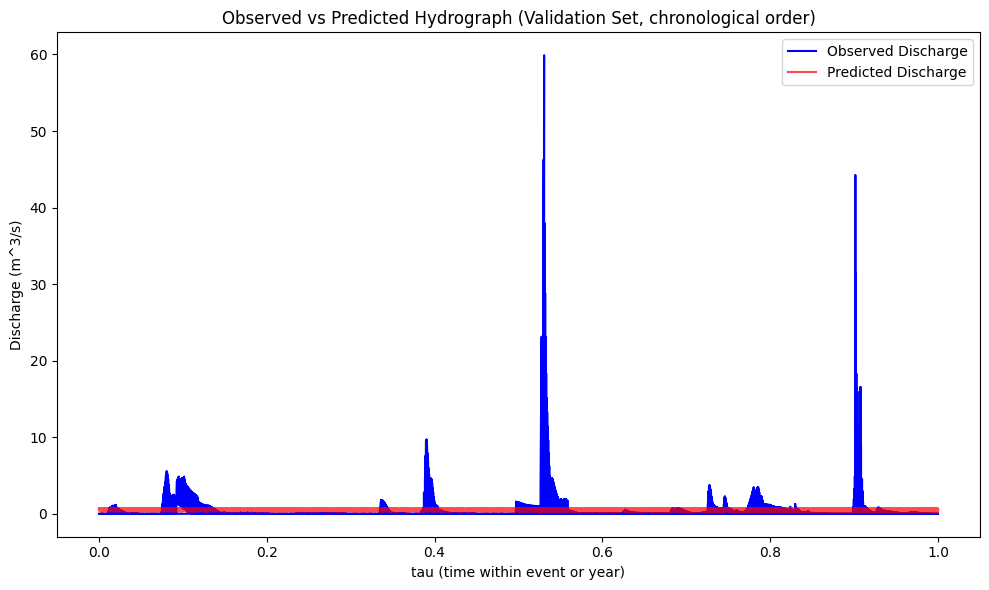

Model saved to lstm_discharge_model.pth


In [7]:
import os
import glob
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt

###############################################################################
# 1. Hyperparameters & File Paths
###############################################################################

DATA_DIR = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/merged/nov2apr/event_base_dfs/remapping time dfs/DEEP_RESEARCH/"

csv_files = [
    "Merged_North_Dead_Sea_2012_remapped.csv",
    "Merged_North_Dead_Sea_2013_remapped.csv",
    "Merged_North_Dead_Sea_2014_remapped.csv",
    "Merged_North_Dead_Sea_2015_remapped.csv",
    "Merged_North_Dead_Sea_2016_remapped.csv",
    "Merged_North_Dead_Sea_2018_remapped.csv",
    "Merged_North_Dead_Sea_2019_remapped.csv",
    "Merged_North_Dead_Sea_2020_remapped.csv",
]

# LSTM model parameters
SEQ_LEN = 6         # how many time steps to use as input
BATCH_SIZE = 32
HIDDEN_SIZE = 32
NUM_LAYERS = 1
EPOCHS = 10

# Loss weights
LAMBDA_PHYSICS = 0.1  # weight for physics-based penalty (tune this)

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

###############################################################################
# 2. Data Loading & Merging in Chronological Order
###############################################################################
def load_and_merge_data(data_dir, file_list):
    """
    Reads multiple CSV files from 'file_list' in the given order (which you can
    interpret as chronological if each file is from a different period/year).
    For each file, we sort by tau. Then we concatenate them in the specified order.
    
    We filter to station pixels only (where rg_qms is not NaN).
    
    Returns:
        A DataFrame with columns including lat, lon, tau, rainrate, elevation,
        slope_calculated, rg_qms, etc., sorted in a 'chronological' manner 
        based on the order of CSVs + ascending tau.
    """
    merged_dfs = []
    for fname in file_list:
        fpath = os.path.join(data_dir, fname)
        if not os.path.exists(fpath):
            print(f"[WARNING] File not found: {fpath}")
            continue
        
        df = pd.read_csv(fpath)
        # Keep station pixels only
        df = df[~df["rg_qms"].isna()].copy()
        
        # Sort by tau within this file (assuming 0..1 for the event)
        df = df.sort_values("tau", ascending=True)
        
        # (Optional) Add a column 'source_file' or 'year' if needed
        df["source_file"] = fname
        # E.g., parse year from filename if you want it:
        # year_str = fname.split("_")[4]  # adapt to the exact naming
        # df["year"] = int(year_str)
        
        merged_dfs.append(df)
    
    # Concatenate in the file_list order
    station_df = pd.concat(merged_dfs, ignore_index=True)
    
    # Now we have a DataFrame sorted by [file order, tau].
    # If you want to also sort by a year column, you can do:
    # station_df = station_df.sort_values(["year", "tau"])
    
    return station_df

def make_sequences(df, seq_len):
    """
    Takes the station data in strict chronological order (no shuffle),
    and creates sequences of length seq_len -> predict next discharge.
    
    We also keep track of 'tau' for each sample so we can reconstruct
    the time axis for plotting the hydrograph in the correct order.
    """
    # Potential features for the LSTM
    feature_cols = ["rainrate", "elevation", "slope_calculated", "tau"]
    
    # Convert to numpy
    # shape: [N, #features]
    features = df[feature_cols].values.astype(np.float32)
    discharge = df["rg_qms"].values.astype(np.float32)
    
    # We'll store the final "tau" of each sample so we can reconstruct
    # the time order of the *label*
    tau_array = df["tau"].values.astype(np.float32)
    
    X_all = []
    y_all = []
    tau_label_all = []
    
    # Because this is a continuous time series, we just do a sliding window
    # from i=0 to i=(N - seq_len).
    # For each i, input = features[i:i+seq_len], label = discharge[i+seq_len]
    # We'll store tau[i+seq_len] as the time index of that label.
    N = len(df)
    for i in range(N - seq_len):
        seq_x = features[i : i + seq_len]
        seq_y = discharge[i + seq_len]
        seq_tau_label = tau_array[i + seq_len]  # the tau for the label time step
        
        X_all.append(seq_x)
        y_all.append(seq_y)
        tau_label_all.append(seq_tau_label)
    
    X_all = np.array(X_all, dtype=np.float32)
    y_all = np.array(y_all, dtype=np.float32).reshape(-1, 1)
    tau_label_all = np.array(tau_label_all, dtype=np.float32).reshape(-1, 1)
    
    return X_all, y_all, tau_label_all

class DischargeDataset(Dataset):
    def __init__(self, X, y, tau_label):
        super().__init__()
        self.X = X
        self.y = y
        self.tau_label = tau_label  # so we can keep time order
    
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        return self.X[idx], self.y[idx], self.tau_label[idx]

###############################################################################
# 3. Define the Model (LSTM + a Learnable Alpha for Physics)
###############################################################################
class LSTMDischargeModel(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers=1):
        super().__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        
        # LSTM
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        
        # Fully-connected layer to map LSTM hidden state to discharge
        self.fc = nn.Linear(hidden_size, 1)
        
        # A learnable parameter alpha (example: runoff factor)
        self.alpha = nn.Parameter(torch.tensor(0.01, dtype=torch.float32))
    
    def forward(self, x):
        """
        x shape: [batch_size, seq_len, input_size]
        returns predicted discharge at the last step -> shape [batch_size, 1]
        """
        lstm_out, (h_n, c_n) = self.lstm(x)
        # Take hidden state from last time step
        out = lstm_out[:, -1, :]
        discharge_pred = self.fc(out)
        return discharge_pred

###############################################################################
# 4. Training Loop (No Shuffling) + Combined (Data + Physics) Loss
###############################################################################
def train_model(model, train_loader, optimizer, num_epochs=10, lambda_phys=0.1):
    criterion_data = nn.MSELoss()
    
    for epoch in range(num_epochs):
        model.train()
        epoch_data_loss = 0.0
        epoch_phys_loss = 0.0
        
        for batch_idx, (X_batch, y_batch, _) in enumerate(train_loader):
            X_batch = X_batch.to(device)
            y_batch = y_batch.to(device)
            
            optimizer.zero_grad()
            
            # Forward pass (predict final step's Q)
            y_pred_final = model(X_batch)
            
            # Data loss
            loss_data = criterion_data(y_pred_final, y_batch)
            
            # Physics penalty:
            # We'll do the step-by-step approach to get Q(t) for each t in [0..seq_len-1].
            Q_preds = []
            hidden = None
            
            for t_idx in range(X_batch.size(1)):
                x_t = X_batch[:, t_idx, :].unsqueeze(1)  # shape [B, 1, input_size]
                if hidden is None:
                    lstm_out, hidden = model.lstm(x_t)
                else:
                    lstm_out, hidden = model.lstm(x_t, hidden)
                Q_t = model.fc(lstm_out[:, -1, :])  # shape [B, 1]
                Q_preds.append(Q_t)
            
            penalty = 0.0
            alpha = model.alpha
            
            # Index of "rainrate" in the input features array (rainrate=0 if we used feature_cols = [rainrate, elevation, slope, tau])
            rain_index = 0
            
            for t_idx in range(len(Q_preds) - 1):
                Q_t1 = Q_preds[t_idx + 1]
                Q_t = Q_preds[t_idx]
                rain_t = X_batch[:, t_idx, rain_index].unsqueeze(1)  # shape [B, 1]
                diff = Q_t1 - Q_t - alpha * rain_t
                penalty += torch.mean(diff**2)
            
            if (len(Q_preds) - 1) > 0:
                penalty = penalty / (len(Q_preds) - 1)
            
            # Combine
            loss = loss_data + lambda_phys * penalty
            loss.backward()
            optimizer.step()
            
            epoch_data_loss += loss_data.item()
            epoch_phys_loss += penalty.item()
        
        avg_data_loss = epoch_data_loss / len(train_loader)
        avg_phys_loss = epoch_phys_loss / len(train_loader)
        print(f"Epoch [{epoch+1}/{num_epochs}] DataLoss: {avg_data_loss:.6f} PhysLoss: {avg_phys_loss:.6f}")

###############################################################################
# 5. Main: Putting It All Together
###############################################################################
def main():
    # 1) Load data in chronological order
    station_df = load_and_merge_data(DATA_DIR, csv_files)
    print("Loaded station data shape:", station_df.shape)
    
    # 2) Create sequences
    X_all, y_all, tau_label_all = make_sequences(station_df, SEQ_LEN)
    print("X_all shape:", X_all.shape, "y_all shape:", y_all.shape, "tau_label_all shape:", tau_label_all.shape)
    
    # 3) Chronological Train/Validation Split (no shuffle)
    dataset_size = len(X_all)
    split_idx = int(0.8 * dataset_size)  # e.g., first 80% for training, last 20% for validation
    
    X_train = X_all[:split_idx]
    y_train = y_all[:split_idx]
    tau_train = tau_label_all[:split_idx]
    
    X_val = X_all[split_idx:]
    y_val = y_all[split_idx:]
    tau_val = tau_label_all[split_idx:]
    
    train_dataset = DischargeDataset(X_train, y_train, tau_train)
    val_dataset = DischargeDataset(X_val, y_val, tau_val)
    
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=False)
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
    
    # 4) Initialize Model
    input_size = X_all.shape[2]
    model = LSTMDischargeModel(input_size=input_size, hidden_size=HIDDEN_SIZE, num_layers=NUM_LAYERS).to(device)
    
    # 5) Optimizer
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
    
    # 6) Train
    train_model(model, train_loader, optimizer, num_epochs=EPOCHS, lambda_phys=LAMBDA_PHYSICS)
    
    # 7) Validation Prediction in chronological order
    model.eval()
    all_preds = []
    all_truth = []
    all_tau = []
    
    with torch.no_grad():
        hidden = None
        for X_batch, y_batch, tau_batch in val_loader:
            X_batch = X_batch.to(device)
            y_batch = y_batch.to(device)
            
            # Predict final discharge for each sequence in this batch
            y_pred = model(X_batch)
            
            all_preds.append(y_pred.cpu().numpy())
            all_truth.append(y_batch.cpu().numpy())
            all_tau.append(tau_batch.cpu().numpy())
    
    # Concatenate along batch dimension
    all_preds = np.concatenate(all_preds).flatten()
    all_truth = np.concatenate(all_truth).flatten()
    all_tau = np.concatenate(all_tau).flatten()
    
    # The arrays are in ascending order of the DataLoader batches,
    # which should match the chronological order we used (since shuffle=False).
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"Validation MSE: {val_mse:.4f}")
    
    # 8) Plot: Observed vs Predicted Discharge as a function of tau
    #    Because tau is in [0..1] for each event, you'll see it jump from 0 to 1 for each event.
    #    If you want a single continuous time axis across events, you must add a "year/event"
    #    offset or do another global time index.
    
    plt.figure(figsize=(10, 6))
    plt.plot(all_tau, all_truth, label='Observed Discharge', color='blue')
    plt.plot(all_tau, all_preds, label='Predicted Discharge', color='red', alpha=0.7)
    plt.xlabel('tau (time within event or year)')
    plt.ylabel('Discharge (m^3/s)')
    plt.title('Observed vs Predicted Hydrograph (Validation Set, chronological order)')
    plt.legend()
    plt.tight_layout()
    plt.show()
    
    # Save model
    torch.save(model.state_dict(), "lstm_discharge_model.pth")
    print("Model saved to lstm_discharge_model.pth")

if __name__ == "__main__":
    main()


Using device: cuda
Loaded station data shape: (32301, 7)
X_all shape: (32295, 6, 4) y_all shape: (32295, 1)

=== Experiment A: Pure Data Loss (lambda_data=1, lambda_phys=0) ===
Epoch [1/10]  DataLoss: 10.63544  PhysLoss: 0.12128
Epoch [2/10]  DataLoss: 10.58906  PhysLoss: 0.16410
Epoch [3/10]  DataLoss: 10.58235  PhysLoss: 0.15708
Epoch [4/10]  DataLoss: 10.58099  PhysLoss: 0.16317
Epoch [5/10]  DataLoss: 10.57134  PhysLoss: 0.15751
Epoch [6/10]  DataLoss: 10.56168  PhysLoss: 0.17161
Epoch [7/10]  DataLoss: 10.56013  PhysLoss: 0.16911
Epoch [8/10]  DataLoss: 10.55954  PhysLoss: 0.17815
Epoch [9/10]  DataLoss: 10.55250  PhysLoss: 0.18909
Epoch [10/10]  DataLoss: 10.55985  PhysLoss: 0.18125
Pure Data Loss - Validation MSE: 2.9254


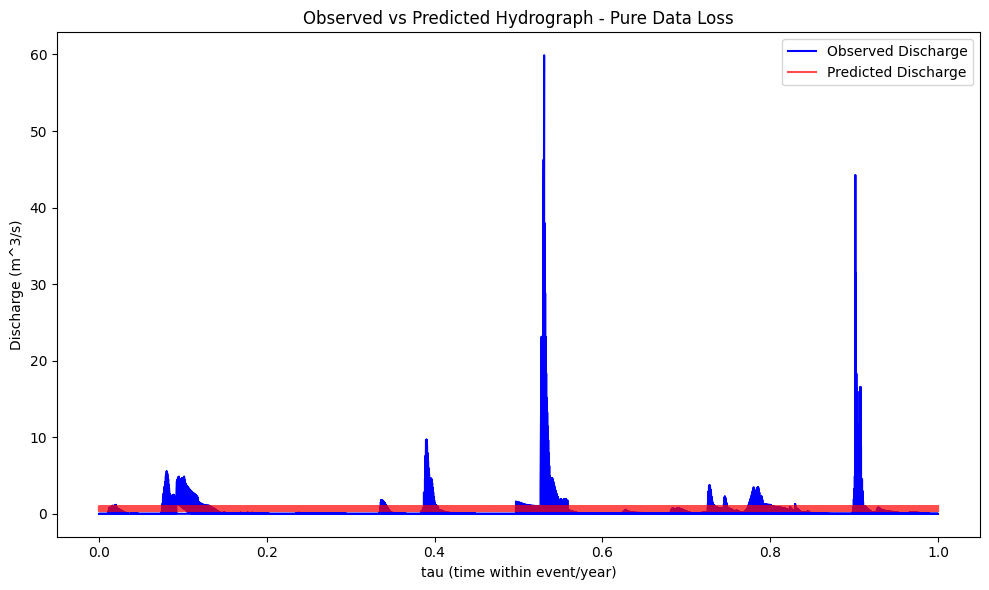


=== Experiment B: Pure Physics (lambda_data=0, lambda_phys=1) ===
Epoch [1/10]  DataLoss: 0.00000  PhysLoss: 0.00063
Epoch [2/10]  DataLoss: 0.00000  PhysLoss: 0.00000
Epoch [3/10]  DataLoss: 0.00000  PhysLoss: 0.00000
Epoch [4/10]  DataLoss: 0.00000  PhysLoss: 0.00000
Epoch [5/10]  DataLoss: 0.00000  PhysLoss: 0.00000
Epoch [6/10]  DataLoss: 0.00000  PhysLoss: 0.00000
Epoch [7/10]  DataLoss: 0.00000  PhysLoss: 0.00000
Epoch [8/10]  DataLoss: 0.00000  PhysLoss: 0.00000
Epoch [9/10]  DataLoss: 0.00000  PhysLoss: 0.00000
Epoch [10/10]  DataLoss: 0.00000  PhysLoss: 0.00000
Pure Physics Loss - Validation MSE: 2.9552


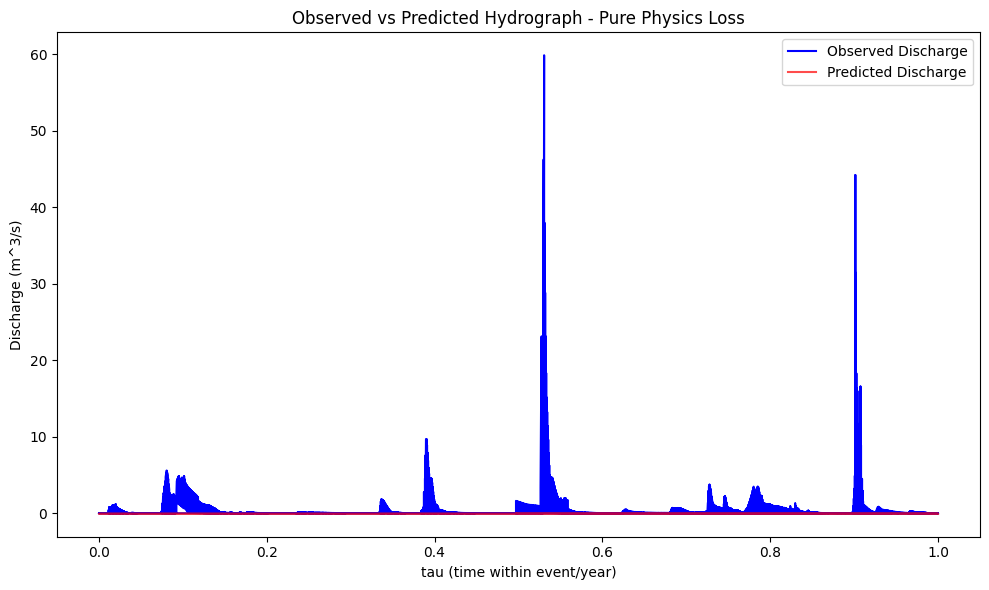

All experiments done.


In [8]:
import os
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt

###############################################################################
# 1. Hyperparameters & File Paths
###############################################################################

DATA_DIR = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/merged/nov2apr/event_base_dfs/remapping time dfs/DEEP_RESEARCH/"

csv_files = [
    "Merged_North_Dead_Sea_2012_remapped.csv",
    "Merged_North_Dead_Sea_2013_remapped.csv",
    "Merged_North_Dead_Sea_2014_remapped.csv",
    "Merged_North_Dead_Sea_2015_remapped.csv",
    "Merged_North_Dead_Sea_2016_remapped.csv",
    "Merged_North_Dead_Sea_2018_remapped.csv",
    "Merged_North_Dead_Sea_2019_remapped.csv",
    "Merged_North_Dead_Sea_2020_remapped.csv",
]

SEQ_LEN = 6
BATCH_SIZE = 32
HIDDEN_SIZE = 32
NUM_LAYERS = 1
EPOCHS = 10

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

###############################################################################
# 2. Data Loading & Chronological Order
###############################################################################

def load_and_merge_data(data_dir, file_list):
    merged_dfs = []
    for fname in file_list:
        fpath = os.path.join(data_dir, fname)
        if not os.path.exists(fpath):
            print(f"[WARNING] File not found: {fpath}")
            continue
        
        df = pd.read_csv(fpath)
        # Keep station pixels only (where rg_qms is not NaN)
        df = df[~df["rg_qms"].isna()].copy()
        # Sort within file by tau
        df.sort_values(by="tau", ascending=True, inplace=True)
        merged_dfs.append(df)

    # Concatenate in the given order
    station_df = pd.concat(merged_dfs, ignore_index=True)
    return station_df

def make_sequences(df, seq_len):
    """
    Create (X,y) sliding windows in chronological order.
    Also keep tau for plotting (the label's time index).
    """
    feature_cols = ["rainrate", "elevation", "slope_calculated", "tau"]
    feat = df[feature_cols].values.astype(np.float32)
    discharge = df["rg_qms"].values.astype(np.float32)
    tau_vals = df["tau"].values.astype(np.float32)
    
    X_all, y_all, tau_label = [], [], []
    N = len(df)
    for i in range(N - seq_len):
        X_all.append(feat[i : i+seq_len])
        y_all.append(discharge[i + seq_len])
        tau_label.append(tau_vals[i + seq_len])
    
    X_all = np.array(X_all, dtype=np.float32)
    y_all = np.array(y_all, dtype=np.float32).reshape(-1, 1)
    tau_label = np.array(tau_label, dtype=np.float32).reshape(-1, 1)
    return X_all, y_all, tau_label

class DischargeDataset(Dataset):
    def __init__(self, X, y, tau_label):
        super().__init__()
        self.X = X
        self.y = y
        self.tau_label = tau_label
    
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        return self.X[idx], self.y[idx], self.tau_label[idx]

###############################################################################
# 3. Model Definition
###############################################################################
class LSTMDischargeModel(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers=1):
        super().__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, 1)
        self.alpha = nn.Parameter(torch.tensor(0.01, dtype=torch.float32))
    
    def forward(self, x):
        # x: [batch, seq_len, input_size]
        lstm_out, (h_n, c_n) = self.lstm(x)
        out = lstm_out[:, -1, :]
        discharge_pred = self.fc(out)
        return discharge_pred

###############################################################################
# 4. Training Function (Flexible for MSE vs. Physics)
###############################################################################

def train_model(model, train_loader, optimizer, num_epochs=10,
                lambda_phys=0.1, lambda_data=1.0):
    """
    lambda_phys: weight for the physics penalty
    lambda_data: weight for the MSE data loss
    Setting lambda_data=0 -> pure physics. Setting lambda_phys=0 -> pure data.
    """
    criterion_data = nn.MSELoss()
    
    for epoch in range(num_epochs):
        model.train()
        epoch_data_loss = 0.0
        epoch_phys_loss = 0.0
        
        for X_batch, y_batch, _ in train_loader:
            X_batch = X_batch.to(device)
            y_batch = y_batch.to(device)
            
            optimizer.zero_grad()
            
            # Forward pass: final step's discharge
            y_pred_final = model(X_batch)
            
            # Data loss (weighted by lambda_data)
            loss_data = criterion_data(y_pred_final, y_batch) * lambda_data
            
            # Physics penalty: Q(t+1) - Q(t) = alpha * rain(t)
            # We'll do step-by-step to get Q at each time step:
            Q_preds = []
            hidden = None
            batch_size = X_batch.size(0)
            
            for t_idx in range(X_batch.size(1)):
                x_t = X_batch[:, t_idx, :].unsqueeze(1)
                if hidden is None:
                    lstm_out, hidden = model.lstm(x_t)
                else:
                    lstm_out, hidden = model.lstm(x_t, hidden)
                Q_t = model.fc(lstm_out[:, -1, :])
                Q_preds.append(Q_t)
            
            alpha = model.alpha
            rain_index = 0
            penalty = 0.0
            steps = len(Q_preds) - 1
            
            for t_idx in range(steps):
                Q_t1 = Q_preds[t_idx+1]
                Q_t = Q_preds[t_idx]
                rain_t = X_batch[:, t_idx, rain_index].unsqueeze(1)
                diff = Q_t1 - Q_t - alpha * rain_t
                penalty += torch.mean(diff**2)
            
            if steps > 0:
                penalty = penalty / steps
            
            loss_phys = penalty * lambda_phys
            loss = loss_data + loss_phys
            
            loss.backward()
            optimizer.step()
            
            # Accumulate
            epoch_data_loss += (loss_data.item() / lambda_data if lambda_data>0 else 0.0)
            epoch_phys_loss += (penalty.item())
        
        n_batches = len(train_loader)
        avg_data_loss = epoch_data_loss / n_batches
        avg_phys_loss = epoch_phys_loss / n_batches
        print(f"Epoch [{epoch+1}/{num_epochs}]  "
              f"DataLoss: {avg_data_loss:.5f}  PhysLoss: {avg_phys_loss:.5f}")

###############################################################################
# 5. Helper: Evaluate & Plot
###############################################################################

def evaluate_and_plot(model, val_loader, title_suffix=""):
    model.eval()
    preds, truth, taus = [], [], []
    
    with torch.no_grad():
        for X_batch, y_batch, tau_batch in val_loader:
            X_batch = X_batch.to(device)
            y_batch = y_batch.to(device)
            y_pred = model(X_batch)
            preds.append(y_pred.cpu().numpy())
            truth.append(y_batch.cpu().numpy())
            taus.append(tau_batch.cpu().numpy())
    
    preds = np.concatenate(preds).flatten()
    truth = np.concatenate(truth).flatten()
    taus = np.concatenate(taus).flatten()
    
    val_mse = np.mean((preds - truth)**2)
    print(f"{title_suffix} - Validation MSE: {val_mse:.4f}")
    
    # Plot
    plt.figure(figsize=(10,6))
    plt.plot(taus, truth, label="Observed Discharge", color="blue")
    plt.plot(taus, preds, label="Predicted Discharge", color="red", alpha=0.7)
    plt.xlabel("tau (time within event/year)")
    plt.ylabel("Discharge (m^3/s)")
    plt.title(f"Observed vs Predicted Hydrograph - {title_suffix}")
    plt.legend()
    plt.tight_layout()
    plt.show()

###############################################################################
# 6. Main: Run Two Separate Experiments
###############################################################################

def main():
    # Load data in chronological order
    df = load_and_merge_data(DATA_DIR, csv_files)
    print("Loaded station data shape:", df.shape)
    
    X_all, y_all, tau_all = make_sequences(df, SEQ_LEN)
    print("X_all shape:", X_all.shape, "y_all shape:", y_all.shape)
    
    # Chronological split
    N = len(X_all)
    split_idx = int(0.8 * N)
    
    X_train, y_train, tau_train = X_all[:split_idx], y_all[:split_idx], tau_all[:split_idx]
    X_val, y_val, tau_val = X_all[split_idx:], y_all[split_idx:], tau_all[split_idx:]
    
    train_dataset = DischargeDataset(X_train, y_train, tau_train)
    val_dataset = DischargeDataset(X_val, y_val, tau_val)
    
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=False)
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
    
    # -------------------------------
    # Experiment A: Pure Data Loss
    # -------------------------------
    print("\n=== Experiment A: Pure Data Loss (lambda_data=1, lambda_phys=0) ===")
    model_data = LSTMDischargeModel(input_size=X_all.shape[2], hidden_size=HIDDEN_SIZE, num_layers=NUM_LAYERS).to(device)
    optimizer_data = torch.optim.Adam(model_data.parameters(), lr=1e-3)
    
    train_model(
        model=model_data,
        train_loader=train_loader,
        optimizer=optimizer_data,
        num_epochs=EPOCHS,
        lambda_phys=0.0,      # No physics penalty
        lambda_data=1.0       # Full data weight
    )
    
    evaluate_and_plot(model_data, val_loader, title_suffix="Pure Data Loss")
    torch.save(model_data.state_dict(), "model_pure_data.pth")
    
    # -------------------------------
    # Experiment B: Pure Physics
    # -------------------------------
    print("\n=== Experiment B: Pure Physics (lambda_data=0, lambda_phys=1) ===")
    model_phys = LSTMDischargeModel(input_size=X_all.shape[2], hidden_size=HIDDEN_SIZE, num_layers=NUM_LAYERS).to(device)
    optimizer_phys = torch.optim.Adam(model_phys.parameters(), lr=1e-3)
    
    train_model(
        model=model_phys,
        train_loader=train_loader,
        optimizer=optimizer_phys,
        num_epochs=EPOCHS,
        lambda_phys=1.0,     # Physics penalty only
        lambda_data=0.0      # No data MSE
    )
    
    evaluate_and_plot(model_phys, val_loader, title_suffix="Pure Physics Loss")
    torch.save(model_phys.state_dict(), "model_pure_physics.pth")
    
    print("All experiments done.")

if __name__ == "__main__":
    main()


In [9]:
import os
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
import math

###############################################################################
# 1. Hyperparameters & File Paths
###############################################################################

DATA_DIR = "/media/data-ssd/PINN/DATA/..."
csv_files = [
    "Merged_North_Dead_Sea_2012_remapped.csv",
    "Merged_North_Dead_Sea_2013_remapped.csv",
    "Merged_North_Dead_Sea_2014_remapped.csv",
    "Merged_North_Dead_Sea_2015_remapped.csv",
    "Merged_North_Dead_Sea_2016_remapped.csv",
    "Merged_North_Dead_Sea_2018_remapped.csv",
    "Merged_North_Dead_Sea_2019_remapped.csv",
    "Merged_North_Dead_Sea_2020_remapped.csv",
]

SEQ_LEN = 6
BATCH_SIZE = 32
HIDDEN_SIZE = 32
NUM_LAYERS = 1
EPOCHS = 50  # Increased
LR = 1e-3

# Hybrid loss weights
LAMBDA_DATA = 1.0
LAMBDA_PHYS = 0.1

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

###############################################################################
# 2. Data Loading & Chronological Merging
###############################################################################
def load_and_merge_data(data_dir, file_list):
    merged_dfs = []
    for fname in file_list:
        fpath = os.path.join(data_dir, fname)
        if not os.path.exists(fpath):
            print(f"[WARNING] File not found: {fpath}")
            continue
        df = pd.read_csv(fpath)
        df = df[~df["rg_qms"].isna()].copy()  # station pixels
        df.sort_values(by="tau", ascending=True, inplace=True)
        merged_dfs.append(df)
    station_df = pd.concat(merged_dfs, ignore_index=True)
    return station_df

def make_sequences(df, seq_len):
    """
    We'll create sequences in log-space for discharge.
    """
    feature_cols = ["rainrate", "elevation", "slope_calculated", "tau"]
    feats = df[feature_cols].values.astype(np.float32)

    # Log1p transform of discharge
    discharge = df["rg_qms"].values.astype(np.float32)
    log_q = np.log1p(discharge)  # shape [N]
    
    tau_vals = df["tau"].values.astype(np.float32)
    
    X_all, y_all, tau_label = [], [], []
    N = len(df)
    for i in range(N - seq_len):
        X_all.append(feats[i : i+seq_len])
        y_all.append(log_q[i + seq_len])
        tau_label.append(tau_vals[i + seq_len])
    
    X_all = np.array(X_all, dtype=np.float32)
    y_all = np.array(y_all, dtype=np.float32).reshape(-1,1)
    tau_label = np.array(tau_label, dtype=np.float32).reshape(-1,1)
    return X_all, y_all, tau_label

class DischargeDataset(Dataset):
    def __init__(self, X, y, tau_label):
        super().__init__()
        self.X = X
        self.y = y
        self.tau_label = tau_label
    
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        return self.X[idx], self.y[idx], self.tau_label[idx]

###############################################################################
# 3. Model for Log-Space Discharge
###############################################################################
class LSTMDischargeModel(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers=1):
        super().__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, 1)
        self.alpha = nn.Parameter(torch.tensor(0.01, dtype=torch.float32))  # naive runoff
    def forward(self, x):
        lstm_out, (h_n, c_n) = self.lstm(x)
        out = lstm_out[:, -1, :]
        log_q_pred = self.fc(out)  # This is log-discharge in our design
        return log_q_pred

###############################################################################
# 4. Training with MSE on Log-Discharge + Simple Physics
###############################################################################
def train_model(model, train_loader, optimizer, num_epochs,
                lambda_data=1.0, lambda_phys=0.1):
    # MSE in log space
    criterion_data = nn.MSELoss()
    
    for epoch in range(num_epochs):
        model.train()
        total_data_loss = 0.0
        total_phys_loss = 0.0
        
        for X_batch, y_log_batch, _ in train_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            optimizer.zero_grad()
            
            # forward pass in log space
            log_q_pred_final = model(X_batch)  # shape [B,1]
            
            # (A) Data MSE in log space
            data_loss = criterion_data(log_q_pred_final, y_log_batch) * lambda_data
            
            # (B) Physics penalty: We'll do the same naive approach:
            # Q(t+1) - Q(t) = alpha * rain(t)
            # BUT now we are predicting log(Q). We'll do an approximate re-exp:
            #   Q(t) = exp(log_q(t)) - 1
            # It's naive, but let's see if it helps a bit more than before.
            
            Q_preds = []
            hidden = None
            rain_index = 0
            
            # Step-by-step to get log(Q_t) for each time step
            seq_len = X_batch.size(1)
            for t_idx in range(seq_len):
                x_t = X_batch[:, t_idx, :].unsqueeze(1)
                if hidden is None:
                    lstm_out, hidden = model.lstm(x_t)
                else:
                    lstm_out, hidden = model.lstm(x_t, hidden)
                log_q_t = model.fc(lstm_out[:, -1, :])  # shape [B,1]
                Q_t = torch.expm1(log_q_t)  # ~ e^(log_q) - 1
                Q_preds.append(Q_t)
            
            # compute penalty
            penalty = 0.0
            steps = seq_len - 1
            alpha = model.alpha
            for t_idx in range(steps):
                Q_t1 = Q_preds[t_idx+1]  # shape [B,1]
                Q_t  = Q_preds[t_idx]    # shape [B,1]
                rain_t = X_batch[:, t_idx, rain_index].unsqueeze(1)  # [B,1]
                
                diff = Q_t1 - Q_t - alpha * rain_t
                penalty += torch.mean(diff**2)
            
            if steps > 0:
                penalty = penalty / steps
            
            phys_loss = penalty * lambda_phys
            total_loss = data_loss + phys_loss
            total_loss.backward()
            optimizer.step()
            
            total_data_loss += data_loss.item() / max(lambda_data,1e-9)
            total_phys_loss += penalty.item()
        
        avg_data = total_data_loss / len(train_loader)
        avg_phys = total_phys_loss / len(train_loader)
        
        print(f"Epoch [{epoch+1}/{num_epochs}] - DataLoss: {avg_data:.4f}  PhysLoss: {avg_phys:.4f}")

###############################################################################
# 5. Evaluation & Plot (convert log space back to linear)
###############################################################################
def evaluate_and_plot(model, val_loader, title=""):
    model.eval()
    preds, truth, taus = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch in val_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)  # [B,1]
            q_pred = torch.expm1(log_q_pred).cpu().numpy().flatten()  # revert log->linear
            q_true = torch.expm1(y_log_batch).cpu().numpy().flatten()
            
            preds.append(q_pred)
            truth.append(q_true)
            taus.append(tau_batch.cpu().numpy().flatten())
    
    preds = np.concatenate(preds)
    truth = np.concatenate(truth)
    taus = np.concatenate(taus)
    
    val_mse = np.mean((preds - truth)**2)
    print(f"{title} - Validation MSE (linear discharge): {val_mse:.4f}")
    
    plt.figure(figsize=(10,6))
    plt.plot(taus, truth, label='Observed', color='blue')
    plt.plot(taus, preds, label='Predicted', color='red', alpha=0.7)
    plt.xlabel("tau (time within event/year)")
    plt.ylabel("Discharge (m^3/s)")
    plt.title(title)
    plt.legend()
    plt.tight_layout()
    plt.show()

###############################################################################
# 6. Main
###############################################################################
def main():
    df = load_and_merge_data(DATA_DIR, csv_files)
    print("Loaded station data shape:", df.shape)
    
    X_all, y_all, tau_all = make_sequences(df, SEQ_LEN)
    print("X_all:", X_all.shape, "y_all:", y_all.shape)
    
    # Chronological split
    N = len(X_all)
    split_idx = int(0.8 * N)
    
    X_train, y_train, tau_train = X_all[:split_idx], y_all[:split_idx], tau_all[:split_idx]
    X_val, y_val, tau_val = X_all[split_idx:], y_all[split_idx:], tau_all[split_idx:]
    
    train_ds = DischargeDataset(X_train, y_train, tau_train)
    val_ds = DischargeDataset(X_val, y_val, tau_val)
    
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=False)
    val_loader = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False)
    
    # Model
    input_size = X_all.shape[2]
    model = LSTMDischargeModel(input_size, HIDDEN_SIZE, NUM_LAYERS).to(device)
    
    optimizer = torch.optim.Adam(model.parameters(), lr=LR)
    
    print("\n=== Training: Log-Transformed MSE + Simple Physics Constraint ===")
    train_model(
        model=model,
        train_loader=train_loader,
        optimizer=optimizer,
        num_epochs=EPOCHS,
        lambda_data=LAMBDA_DATA,
        lambda_phys=LAMBDA_PHYS
    )
    
    evaluate_and_plot(model, val_loader, title="Hybrid (Log MSE + Physics)")

if __name__ == "__main__":
    main()


Using device: cuda
[WARNING] File not found: /media/data-ssd/PINN/DATA/.../Merged_North_Dead_Sea_2012_remapped.csv
[WARNING] File not found: /media/data-ssd/PINN/DATA/.../Merged_North_Dead_Sea_2013_remapped.csv
[WARNING] File not found: /media/data-ssd/PINN/DATA/.../Merged_North_Dead_Sea_2014_remapped.csv
[WARNING] File not found: /media/data-ssd/PINN/DATA/.../Merged_North_Dead_Sea_2015_remapped.csv
[WARNING] File not found: /media/data-ssd/PINN/DATA/.../Merged_North_Dead_Sea_2016_remapped.csv
[WARNING] File not found: /media/data-ssd/PINN/DATA/.../Merged_North_Dead_Sea_2018_remapped.csv
[WARNING] File not found: /media/data-ssd/PINN/DATA/.../Merged_North_Dead_Sea_2019_remapped.csv
[WARNING] File not found: /media/data-ssd/PINN/DATA/.../Merged_North_Dead_Sea_2020_remapped.csv


ValueError: No objects to concatenate

Using device: cuda
Loaded station data shape: (32301, 7)
X_all: (32295, 6, 4) y_all: (32295, 1)

=== Training: Log-Transformed MSE + Simple Physics Constraint ===
Epoch [1/50] - DataLoss: 0.2927, PhysLoss: 0.0312
Epoch [2/50] - DataLoss: 0.2934, PhysLoss: 0.0155
Epoch [3/50] - DataLoss: 0.2931, PhysLoss: 0.0130
Epoch [4/50] - DataLoss: 0.2932, PhysLoss: 0.0127
Epoch [5/50] - DataLoss: 0.2928, PhysLoss: 0.0126
Epoch [6/50] - DataLoss: 0.2932, PhysLoss: 0.0123
Epoch [7/50] - DataLoss: 0.2891, PhysLoss: 0.0205
Epoch [8/50] - DataLoss: 0.2939, PhysLoss: 0.0194
Epoch [9/50] - DataLoss: 0.2930, PhysLoss: 0.0190
Epoch [10/50] - DataLoss: 0.2936, PhysLoss: 0.0194
Epoch [11/50] - DataLoss: 0.2938, PhysLoss: 0.0241
Epoch [12/50] - DataLoss: 0.2937, PhysLoss: 0.0233
Epoch [13/50] - DataLoss: 0.2938, PhysLoss: 0.0215
Epoch [14/50] - DataLoss: 0.2936, PhysLoss: 0.0201
Epoch [15/50] - DataLoss: 0.2934, PhysLoss: 0.0189
Epoch [16/50] - DataLoss: 0.2936, PhysLoss: 0.0188
Epoch [17/50] - DataLoss: 0.29

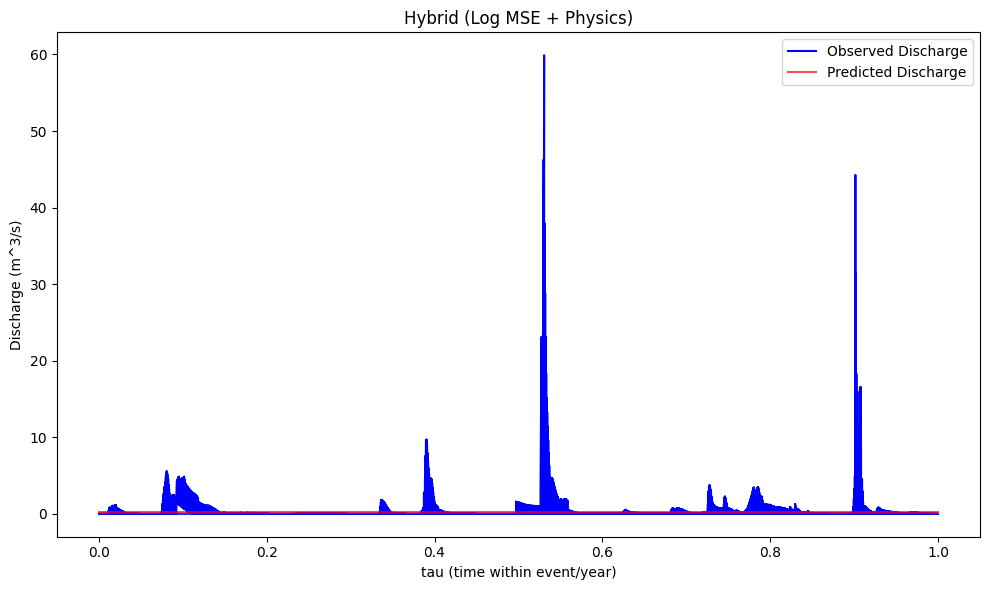

Model saved to lstm_discharge_model.pth


In [10]:
import os
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt

###############################################################################
# 1. Hyperparameters & File Paths
###############################################################################

# UPDATE THIS: Provide the correct directory path (no "..." placeholder).
# Example (based on your previous messages):
DATA_DIR = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/merged/nov2apr/event_base_dfs/remapping time dfs/DEEP_RESEARCH/"

# Ensure these filenames exactly match what is in DATA_DIR
csv_files = [
    "Merged_North_Dead_Sea_2012_remapped.csv",
    "Merged_North_Dead_Sea_2013_remapped.csv",
    "Merged_North_Dead_Sea_2014_remapped.csv",
    "Merged_North_Dead_Sea_2015_remapped.csv",
    "Merged_North_Dead_Sea_2016_remapped.csv",
    # If you have 2017, add it here or remove if missing:
    # "Merged_North_Dead_Sea_2017_remapped.csv",
    "Merged_North_Dead_Sea_2018_remapped.csv",
    "Merged_North_Dead_Sea_2019_remapped.csv",
    "Merged_North_Dead_Sea_2020_remapped.csv",
]

SEQ_LEN = 6         # Number of time steps in each input sequence
BATCH_SIZE = 32
HIDDEN_SIZE = 32
NUM_LAYERS = 1
EPOCHS = 50         # Increase epochs for better learning
LR = 1e-3

# Hybrid loss weights
LAMBDA_DATA = 1.0   # Weight for MSE (data term)
LAMBDA_PHYS = 0.1   # Weight for physics penalty

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

###############################################################################
# 2. Data Loading & Chronological Merging
###############################################################################

def load_and_merge_data(data_dir, file_list):
    """
    Reads multiple CSVs from 'file_list', sorts each by 'tau', and concatenates.
    Keeps rows only where 'rg_qms' is not NaN (i.e., station pixels).
    Returns a single DataFrame in approximate chronological order (file order + ascending tau).
    """
    merged_dfs = []
    for fname in file_list:
        fpath = os.path.join(data_dir, fname)
        if not os.path.exists(fpath):
            print(f"[WARNING] File not found: {fpath}")
            continue
        
        df = pd.read_csv(fpath)
        # Filter to station pixels only
        df = df[~df["rg_qms"].isna()].copy()
        # Sort by tau within this file
        df.sort_values(by="tau", ascending=True, inplace=True)
        merged_dfs.append(df)
    
    if len(merged_dfs) == 0:
        raise ValueError("No valid CSV files were found. Check your path/filenames.")
    
    station_df = pd.concat(merged_dfs, ignore_index=True)
    return station_df

def make_sequences(df, seq_len):
    """
    Create sliding-window sequences in chronological order.
    We'll transform discharge to log-space (log1p) for training.
    
    Returns:
        X_all: shape [N-seq_len, seq_len, num_features]
        y_all: shape [N-seq_len, 1] (log-discharge at the next time step)
        tau_label: shape [N-seq_len, 1] (the tau for that label time step)
    """
    feature_cols = ["rainrate", "elevation", "slope_calculated", "tau"]
    feats = df[feature_cols].values.astype(np.float32)
    
    # Log1p transform of discharge
    discharge = df["rg_qms"].values.astype(np.float32)
    log_q = np.log1p(discharge)  # shape [N]
    
    tau_vals = df["tau"].values.astype(np.float32)
    
    X_all = []
    y_all = []
    tau_label = []
    N = len(df)
    for i in range(N - seq_len):
        X_all.append(feats[i : i+seq_len])
        # Next-step log(Q)
        y_all.append(log_q[i + seq_len])
        tau_label.append(tau_vals[i + seq_len])
    
    X_all = np.array(X_all, dtype=np.float32)  # [N-seq_len, seq_len, features]
    y_all = np.array(y_all, dtype=np.float32).reshape(-1, 1)  # [N-seq_len, 1]
    tau_label = np.array(tau_label, dtype=np.float32).reshape(-1, 1)  # [N-seq_len, 1]
    return X_all, y_all, tau_label

class DischargeDataset(Dataset):
    """Simple Dataset to store sequences of features (X), log-discharge (y), and time labels (tau)."""
    def __init__(self, X, y, tau_label):
        super().__init__()
        self.X = X
        self.y = y
        self.tau_label = tau_label
    
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        return self.X[idx], self.y[idx], self.tau_label[idx]

###############################################################################
# 3. Model for Log-Space Discharge
###############################################################################
class LSTMDischargeModel(nn.Module):
    """
    This model predicts log-discharge from sequences of features.
    We also maintain a learnable parameter alpha for a simplistic
    'physics' equation: Q(t+1) - Q(t) ~ alpha * rain(t).
    """
    def __init__(self, input_size, hidden_size, num_layers=1):
        super().__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, 1)
        
        # alpha used in naive physics constraint
        self.alpha = nn.Parameter(torch.tensor(0.01, dtype=torch.float32))
    
    def forward(self, x):
        """
        x: shape [B, seq_len, input_size]
        returns log_q_pred: shape [B, 1]
        """
        lstm_out, (h_n, c_n) = self.lstm(x)
        out = lstm_out[:, -1, :]      # final time-step hidden state
        log_q_pred = self.fc(out)     # log-discharge
        return log_q_pred

###############################################################################
# 4. Training with MSE on Log-Discharge + Simple Physics
###############################################################################
def train_model(model, train_loader, optimizer, num_epochs,
                lambda_data=1.0, lambda_phys=0.1):
    """
    - MSE in log space
    - Physics penalty: Q(t+1) - Q(t) = alpha * rain(t), but in code we do:
        Q_t = exp(log_q_t) - 1
    """
    criterion_data = nn.MSELoss()
    
    for epoch in range(num_epochs):
        model.train()
        total_data_loss = 0.0
        total_phys_loss = 0.0
        
        for X_batch, y_log_batch, _ in train_loader:
            # X_batch shape: [B, seq_len, input_size]
            # y_log_batch shape: [B, 1] (log(Q))
            
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            optimizer.zero_grad()
            
            # (A) Data Loss (log-space MSE)
            log_q_pred_final = model(X_batch)  # [B,1]
            data_loss = criterion_data(log_q_pred_final, y_log_batch) * lambda_data
            
            # (B) Physics Penalty
            # Step-by-step to get Q(t) for each time t in the input sequence
            Q_preds = []
            hidden = None
            seq_len = X_batch.size(1)
            
            for t_idx in range(seq_len):
                x_t = X_batch[:, t_idx, :].unsqueeze(1)  # shape [B,1,input_size]
                if hidden is None:
                    lstm_out, hidden = model.lstm(x_t)
                else:
                    lstm_out, hidden = model.lstm(x_t, hidden)
                
                # we predict logQ
                log_q_t = model.fc(lstm_out[:, -1, :])  # shape [B,1]
                # revert from log to linear
                Q_t = torch.expm1(log_q_t)
                Q_preds.append(Q_t)
            
            # naive physics: Q(t+1) - Q(t) ~ alpha * rain(t)
            alpha = model.alpha
            rain_index = 0  # "rainrate" is assumed 0th feature
            penalty = 0.0
            steps = seq_len - 1
            
            for t_idx in range(steps):
                Q_t1 = Q_preds[t_idx+1]
                Q_t  = Q_preds[t_idx]
                rain_t = X_batch[:, t_idx, rain_index].unsqueeze(1)  # shape [B,1]
                
                diff = Q_t1 - Q_t - alpha * rain_t
                penalty += torch.mean(diff**2)
            
            if steps > 0:
                penalty = penalty / steps
            
            phys_loss = penalty * lambda_phys
            
            total_loss = data_loss + phys_loss
            total_loss.backward()
            optimizer.step()
            
            # Accumulate stats for printing
            # to print "unweighted" data_loss, do:
            if lambda_data > 0:
                total_data_loss += (data_loss.item() / lambda_data)
            else:
                total_data_loss += 0.0
            
            total_phys_loss += penalty.item()
        
        n_batches = len(train_loader)
        avg_data_loss = total_data_loss / n_batches
        avg_phys_loss = total_phys_loss / n_batches
        print(f"Epoch [{epoch+1}/{num_epochs}] - DataLoss: {avg_data_loss:.4f}, PhysLoss: {avg_phys_loss:.4f}")

###############################################################################
# 5. Evaluation & Plot (convert log space back to linear)
###############################################################################
def evaluate_and_plot(model, val_loader, title=""):
    model.eval()
    preds_list, truth_list, tau_list = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch in val_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            # predict in log space
            log_q_pred = model(X_batch)  # [B,1]
            # revert to linear
            q_pred = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true = torch.expm1(y_log_batch).cpu().numpy().flatten()
            
            preds_list.append(q_pred)
            truth_list.append(q_true)
            tau_list.append(tau_batch.cpu().numpy().flatten())
    
    preds = np.concatenate(preds_list)
    truth = np.concatenate(truth_list)
    taus = np.concatenate(tau_list)
    
    val_mse = np.mean((preds - truth)**2)
    print(f"{title} - Validation MSE (linear discharge): {val_mse:.4f}")
    
    plt.figure(figsize=(10,6))
    plt.plot(taus, truth, label='Observed Discharge', color='blue')
    plt.plot(taus, preds, label='Predicted Discharge', color='red', alpha=0.7)
    plt.xlabel("tau (time within event/year)")
    plt.ylabel("Discharge (m^3/s)")
    plt.title(title)
    plt.legend()
    plt.tight_layout()
    plt.show()

###############################################################################
# 6. Main
###############################################################################
def main():
    df = load_and_merge_data(DATA_DIR, csv_files)
    print("Loaded station data shape:", df.shape)
    
    X_all, y_all, tau_all = make_sequences(df, SEQ_LEN)
    print("X_all:", X_all.shape, "y_all:", y_all.shape)
    
    # Chronological split
    N = len(X_all)
    split_idx = int(0.8 * N)
    
    X_train, y_train, tau_train = X_all[:split_idx], y_all[:split_idx], tau_all[:split_idx]
    X_val, y_val, tau_val = X_all[split_idx:], y_all[split_idx:], tau_all[split_idx:]
    
    train_ds = DischargeDataset(X_train, y_train, tau_train)
    val_ds = DischargeDataset(X_val, y_val, tau_val)
    
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=False)
    val_loader = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False)
    
    # Model initialization
    input_size = X_all.shape[2]  # number of features: [rainrate, elevation, slope, tau]
    model = LSTMDischargeModel(input_size, HIDDEN_SIZE, NUM_LAYERS).to(device)
    
    optimizer = torch.optim.Adam(model.parameters(), lr=LR)
    
    print("\n=== Training: Log-Transformed MSE + Simple Physics Constraint ===")
    train_model(
        model=model,
        train_loader=train_loader,
        optimizer=optimizer,
        num_epochs=EPOCHS,
        lambda_data=LAMBDA_DATA,
        lambda_phys=LAMBDA_PHYS
    )
    
    evaluate_and_plot(model, val_loader, title="Hybrid (Log MSE + Physics)")
    
    # Save the model
    torch.save(model.state_dict(), "lstm_discharge_model.pth")
    print("Model saved to lstm_discharge_model.pth")

if __name__ == "__main__":
    main()


Using device: cuda
Loaded station data shape: (32301, 7)
X_all shape: (32295, 6, 4) y_all shape: (32295, 1)

=== Training: Weighted MSE (log) + Larger LSTM + Simple Physics ===
Epoch [1/100] - DataLoss: 0.5511, PhysLoss: 0.0404
Epoch [2/100] - DataLoss: 0.5600, PhysLoss: 0.0326
Epoch [3/100] - DataLoss: 0.5644, PhysLoss: 0.0226
Epoch [4/100] - DataLoss: 0.5666, PhysLoss: 0.0141
Epoch [5/100] - DataLoss: 0.5622, PhysLoss: 0.0134
Epoch [6/100] - DataLoss: 0.5577, PhysLoss: 0.0116
Epoch [7/100] - DataLoss: 0.5562, PhysLoss: 0.0117
Epoch [8/100] - DataLoss: 0.5550, PhysLoss: 0.0126
Epoch [9/100] - DataLoss: 0.5549, PhysLoss: 0.0129
Epoch [10/100] - DataLoss: 0.5604, PhysLoss: 0.0115
Epoch [11/100] - DataLoss: 0.5580, PhysLoss: 0.0137
Epoch [12/100] - DataLoss: 0.5625, PhysLoss: 0.0183
Epoch [13/100] - DataLoss: 0.5728, PhysLoss: 0.0089
Epoch [14/100] - DataLoss: 0.5653, PhysLoss: 0.0075
Epoch [15/100] - DataLoss: 0.5556, PhysLoss: 0.0062
Epoch [16/100] - DataLoss: 0.5646, PhysLoss: 0.0054


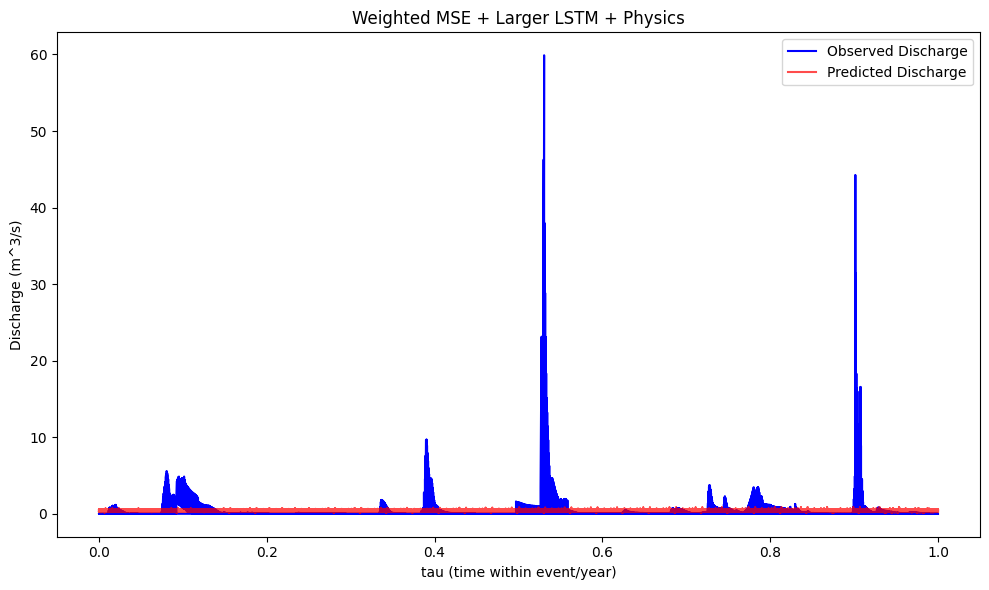

In [11]:
import os
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt

###############################################################################
# 1. Hyperparameters & File Paths
###############################################################################
DATA_DIR = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/merged/nov2apr/event_base_dfs/remapping time dfs/DEEP_RESEARCH/"

csv_files = [
    "Merged_North_Dead_Sea_2012_remapped.csv",
    "Merged_North_Dead_Sea_2013_remapped.csv",
    "Merged_North_Dead_Sea_2014_remapped.csv",
    "Merged_North_Dead_Sea_2015_remapped.csv",
    "Merged_North_Dead_Sea_2016_remapped.csv",
    "Merged_North_Dead_Sea_2018_remapped.csv",
    "Merged_North_Dead_Sea_2019_remapped.csv",
    "Merged_North_Dead_Sea_2020_remapped.csv",
]

SEQ_LEN = 6
BATCH_SIZE = 32
# Larger LSTM
HIDDEN_SIZE = 64
NUM_LAYERS = 2
DROPOUT = 0.2

EPOCHS = 100
LR = 1e-3

# Hybrid loss weights
LAMBDA_DATA = 1.0
LAMBDA_PHYS = 0.1

# Weighted MSE params
BETA_WEIGHT = 5.0    # Increase to put more emphasis on high flows
GLOBAL_QMAX = 60.0   # Approx known max discharge for scaling in weighting

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

###############################################################################
# 2. Data Loading & Chronological Merging
###############################################################################
def load_and_merge_data(data_dir, file_list):
    merged_dfs = []
    for fname in file_list:
        fpath = os.path.join(data_dir, fname)
        if not os.path.exists(fpath):
            print(f"[WARNING] File not found: {fpath}")
            continue
        
        df = pd.read_csv(fpath)
        df = df[~df["rg_qms"].isna()].copy()
        df.sort_values(by="tau", ascending=True, inplace=True)
        merged_dfs.append(df)
    
    if len(merged_dfs) == 0:
        raise ValueError("No valid CSV files found. Check data paths/filenames.")
    station_df = pd.concat(merged_dfs, ignore_index=True)
    return station_df

def make_sequences(df, seq_len):
    feature_cols = ["rainrate", "elevation", "slope_calculated", "tau"]
    feats = df[feature_cols].values.astype(np.float32)
    
    discharge = df["rg_qms"].values.astype(np.float32)
    # Log1p transform
    log_q = np.log1p(discharge)
    
    tau_vals = df["tau"].values.astype(np.float32)
    
    X_all, y_all, tau_label = [], [], []
    N = len(df)
    for i in range(N - seq_len):
        X_all.append(feats[i : i+seq_len])
        y_all.append(log_q[i + seq_len])
        tau_label.append(tau_vals[i + seq_len])
    
    X_all = np.array(X_all, dtype=np.float32)
    y_all = np.array(y_all, dtype=np.float32).reshape(-1, 1)
    tau_label = np.array(tau_label, dtype=np.float32).reshape(-1, 1)
    return X_all, y_all, tau_label

class DischargeDataset(Dataset):
    def __init__(self, X, y, tau_label):
        super().__init__()
        self.X = X
        self.y = y
        self.tau_label = tau_label
    
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        return self.X[idx], self.y[idx], self.tau_label[idx]

###############################################################################
# 3. Model Definition (LSTM + alpha param)
###############################################################################
class LSTMDischargeModel(nn.Module):
    def __init__(self, input_size, hidden_size=64, num_layers=2, dropout=0.2):
        super().__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers=num_layers,
                            batch_first=True, dropout=dropout)
        self.fc = nn.Linear(hidden_size, 1)
        self.alpha = nn.Parameter(torch.tensor(0.01, dtype=torch.float32))  # naive runoff factor
    
    def forward(self, x):
        lstm_out, (h_n, c_n) = self.lstm(x)
        out = lstm_out[:, -1, :]
        log_q_pred = self.fc(out)  # predict log-discharge
        return log_q_pred

###############################################################################
# 4. Weighted MSE in log-space
###############################################################################
def weighted_mse_loss(log_q_pred, log_q_true, beta=5.0, global_qmax=60.0):
    """
    Weighted MSE in log space, weights based on linear discharge Q_true.
    w_i = 1 + beta*(Q_true / global_qmax)
    """
    # Convert from log->linear
    Q_true = torch.expm1(log_q_true)
    w = 1.0 + beta*(Q_true / global_qmax)
    
    diff = (log_q_pred - log_q_true)**2
    weighted_diff = w * diff
    return torch.mean(weighted_diff)

###############################################################################
# 5. Training Loop
###############################################################################
def train_model(model, train_loader, optimizer, scheduler, num_epochs,
                lambda_data=1.0, lambda_phys=0.1,
                beta_weight=5.0, global_qmax=60.0):
    """
    - Data loss: Weighted MSE in log space
    - Physics penalty: Q(t+1) - Q(t) = alpha * rain(t)
    """
    for epoch in range(num_epochs):
        model.train()
        epoch_data_loss = 0.0
        epoch_phys_loss = 0.0
        
        for X_batch, y_log_batch, _ in train_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            optimizer.zero_grad()
            
            # (A) Forward
            log_q_pred_final = model(X_batch)  # [B,1], log-space
            
            # (B) Weighted data loss
            data_loss_val = weighted_mse_loss(log_q_pred_final, y_log_batch, 
                                              beta=beta_weight, 
                                              global_qmax=global_qmax)
            data_loss_val = data_loss_val * lambda_data
            
            # (C) Physics penalty
            Q_preds = []
            hidden = None
            seq_len = X_batch.size(1)
            
            for t_idx in range(seq_len):
                x_t = X_batch[:, t_idx, :].unsqueeze(1)
                if hidden is None:
                    lstm_out, hidden = model.lstm(x_t)
                else:
                    lstm_out, hidden = model.lstm(x_t, hidden)
                
                log_q_t = model.fc(lstm_out[:, -1, :])
                Q_t = torch.expm1(log_q_t)
                Q_preds.append(Q_t)
            
            alpha = model.alpha
            rain_index = 0
            penalty = 0.0
            steps = seq_len - 1
            
            for t_idx in range(steps):
                Q_t1 = Q_preds[t_idx+1]
                Q_t = Q_preds[t_idx]
                rain_t = X_batch[:, t_idx, rain_index].unsqueeze(1)
                diff = Q_t1 - Q_t - alpha * rain_t
                penalty += torch.mean(diff**2)
            
            if steps > 0:
                penalty = penalty / steps
            
            phys_loss = penalty * lambda_phys
            
            total_loss = data_loss_val + phys_loss
            total_loss.backward()
            optimizer.step()
            
            epoch_data_loss += (data_loss_val.item() / max(lambda_data,1e-9))
            epoch_phys_loss += penalty.item()
        
        if scheduler is not None:
            scheduler.step()
        
        n_batches = len(train_loader)
        avg_data = epoch_data_loss / n_batches
        avg_phys = epoch_phys_loss / n_batches
        
        print(f"Epoch [{epoch+1}/{num_epochs}] - DataLoss: {avg_data:.4f}, PhysLoss: {avg_phys:.4f}")

###############################################################################
# 6. Evaluate & Plot
###############################################################################
def evaluate_and_plot(model, val_loader, title=""):
    model.eval()
    preds_list, truth_list, tau_list = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch in val_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true = torch.expm1(y_log_batch).cpu().numpy().flatten()
            
            preds_list.append(q_pred)
            truth_list.append(q_true)
            tau_list.append(tau_batch.cpu().numpy().flatten())
    
    preds = np.concatenate(preds_list)
    truth = np.concatenate(truth_list)
    taus = np.concatenate(tau_list)
    
    val_mse = np.mean((preds - truth)**2)
    print(f"{title} - Validation MSE (linear discharge): {val_mse:.4f}")
    
    plt.figure(figsize=(10,6))
    plt.plot(taus, truth, label='Observed Discharge', color='blue')
    plt.plot(taus, preds, label='Predicted Discharge', color='red', alpha=0.7)
    plt.xlabel("tau (time within event/year)")
    plt.ylabel("Discharge (m^3/s)")
    plt.title(title)
    plt.legend()
    plt.tight_layout()
    plt.show()

###############################################################################
# 7. Main
###############################################################################
def main():
    df = load_and_merge_data(DATA_DIR, csv_files)
    print("Loaded station data shape:", df.shape)
    
    X_all, y_all, tau_all = make_sequences(df, SEQ_LEN)
    print("X_all shape:", X_all.shape, "y_all shape:", y_all.shape)
    
    N = len(X_all)
    split_idx = int(0.8 * N)
    X_train, y_train, tau_train = X_all[:split_idx], y_all[:split_idx], tau_all[:split_idx]
    X_val, y_val, tau_val = X_all[split_idx:], y_all[split_idx:], tau_all[split_idx:]
    
    train_ds = DischargeDataset(X_train, y_train, tau_train)
    val_ds = DischargeDataset(X_val, y_val, tau_val)
    
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=False)
    val_loader = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False)
    
    # Initialize model with bigger LSTM
    input_size = X_all.shape[2]
    model = LSTMDischargeModel(
        input_size=input_size, 
        hidden_size=HIDDEN_SIZE, 
        num_layers=NUM_LAYERS, 
        dropout=DROPOUT
    ).to(device)
    
    optimizer = torch.optim.Adam(model.parameters(), lr=LR)
    # Example StepLR scheduler (decays LR by 0.5 every 30 epochs)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=30, gamma=0.5)
    
    print("\n=== Training: Weighted MSE (log) + Larger LSTM + Simple Physics ===")
    train_model(
        model=model,
        train_loader=train_loader,
        optimizer=optimizer,
        scheduler=scheduler,
        num_epochs=EPOCHS,
        lambda_data=LAMBDA_DATA,
        lambda_phys=LAMBDA_PHYS,
        beta_weight=BETA_WEIGHT,
        global_qmax=GLOBAL_QMAX
    )
    
    evaluate_and_plot(model, val_loader, title="Weighted MSE + Larger LSTM + Physics")

if __name__ == "__main__":
    main()


Using device: cuda
Loaded station data shape: (32301, 7)
X_all shape: (32295, 6, 4) y_all shape: (32295, 1)

=== Training: Weighted MSE + Larger LSTM + Normalized + PDE(Opt) ===
Epoch [1/100] - DataLoss: 0.5768, PhysLoss: 0.0023
Epoch [2/100] - DataLoss: 0.5634, PhysLoss: 0.0034
Epoch [3/100] - DataLoss: 0.5617, PhysLoss: 0.0036
Epoch [4/100] - DataLoss: 0.5601, PhysLoss: 0.0039
Epoch [5/100] - DataLoss: 0.5591, PhysLoss: 0.0044
Epoch [6/100] - DataLoss: 0.5579, PhysLoss: 0.0050
Epoch [7/100] - DataLoss: 0.5568, PhysLoss: 0.0058
Epoch [8/100] - DataLoss: 0.5562, PhysLoss: 0.0068
Epoch [9/100] - DataLoss: 0.5549, PhysLoss: 0.0079
Epoch [10/100] - DataLoss: 0.5539, PhysLoss: 0.0090
Epoch [11/100] - DataLoss: 0.5534, PhysLoss: 0.0100
Epoch [12/100] - DataLoss: 0.5522, PhysLoss: 0.0111
Epoch [13/100] - DataLoss: 0.5519, PhysLoss: 0.0119
Epoch [14/100] - DataLoss: 0.5514, PhysLoss: 0.0126
Epoch [15/100] - DataLoss: 0.5504, PhysLoss: 0.0132
Epoch [16/100] - DataLoss: 0.5496, PhysLoss: 0.0138

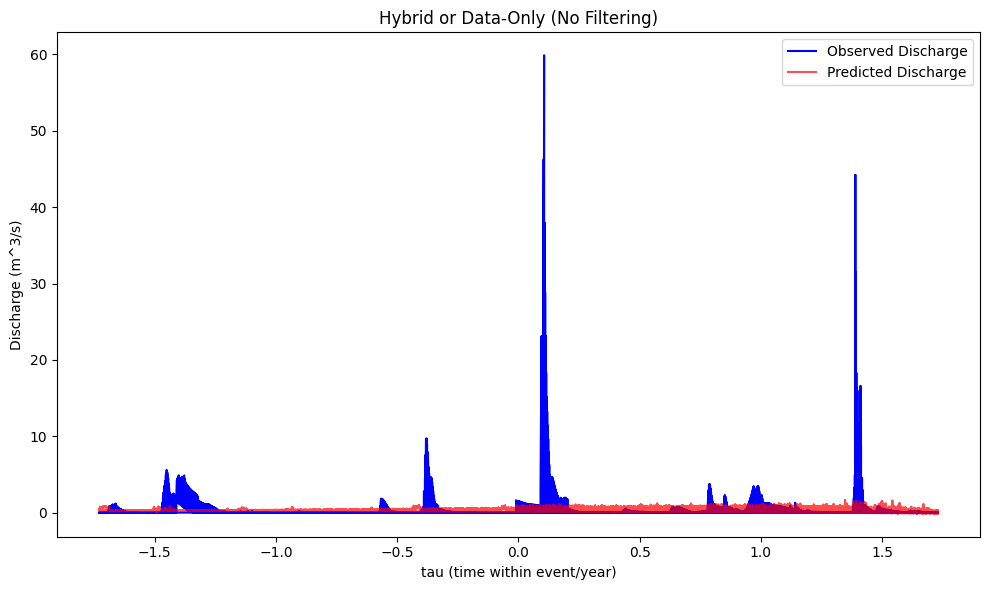

In [15]:
import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

###############################################################################
# 1. Hyperparameters & File Paths
###############################################################################
DATA_DIR = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/merged/nov2apr/event_base_dfs/remapping time dfs/DEEP_RESEARCH/"

csv_files = [
    "Merged_North_Dead_Sea_2012_remapped.csv",
    "Merged_North_Dead_Sea_2013_remapped.csv",
    "Merged_North_Dead_Sea_2014_remapped.csv",
    "Merged_North_Dead_Sea_2015_remapped.csv",
    "Merged_North_Dead_Sea_2016_remapped.csv",
    "Merged_North_Dead_Sea_2018_remapped.csv",
    "Merged_North_Dead_Sea_2019_remapped.csv",
    "Merged_North_Dead_Sea_2020_remapped.csv",
]

SEQ_LEN = 6

# Larger LSTM
HIDDEN_SIZE = 64
NUM_LAYERS = 2
DROPOUT = 0.2

# Training
BATCH_SIZE = 32
EPOCHS = 100
# Lower LR to help stable convergence
LR = 1e-4

# Weighted MSE in log space
BETA_WEIGHT = 5.0
GLOBAL_QMAX = 60.0

# Hybrid loss
LAMBDA_DATA = 1.0     # set 1.0 for normal data-driven
LAMBDA_PHYS = 0.1     # set 0.0 if you want purely data-driven

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

###############################################################################
# 2. Load & Merge Data (No Filtering, Keep Chronological tau)
###############################################################################
def load_and_merge_data(data_dir, file_list):
    merged_dfs = []
    for fname in file_list:
        fpath = os.path.join(data_dir, fname)
        if not os.path.exists(fpath):
            print(f"[WARNING] File not found: {fpath}")
            continue
        
        df = pd.read_csv(fpath)
        # keep only station pixels
        df = df[~df["rg_qms"].isna()].copy()
        # sort by tau
        df.sort_values("tau", ascending=True, inplace=True)
        # optionally store the filename/year if needed
        merged_dfs.append(df)
    if len(merged_dfs) == 0:
        raise ValueError("No valid CSV files found. Check paths.")
    
    station_df = pd.concat(merged_dfs, ignore_index=True)
    
    # Finally, sort again by (maybe a year or file index + tau) if needed:
    # station_df = station_df.sort_values(["year","tau"]) # if you had a 'year' col
    # For now we rely just on tau + file order
    return station_df

###############################################################################
# 3. Feature Normalization
###############################################################################
def normalize_features(df):
    """
    We'll standard-scale the columns [rainrate, elevation, slope_calculated, tau].
    This is crucial for stable LSTM training.
    """
    feature_cols = ["rainrate", "elevation", "slope_calculated", "tau"]
    scaler = StandardScaler()
    
    # Fit on the entire dataset (no train/val split yet)
    # If you want a strict practice, fit only on train portion, then transform val. 
    # But for demonstration, we'll scale all at once.
    df[feature_cols] = scaler.fit_transform(df[feature_cols])
    return df, scaler

###############################################################################
# 4. Make Sequences
###############################################################################
def make_sequences(df, seq_len=6):
    """
    We'll use [rainrate, elevation, slope_calculated, tau] as features
    and log1p(rg_qms) as label. No storm filtering, we keep everything.
    """
    feature_cols = ["rainrate", "elevation", "slope_calculated", "tau"]
    feats = df[feature_cols].values.astype(np.float32)
    
    discharge = df["rg_qms"].values.astype(np.float32)
    log_q = np.log1p(discharge)  # log transform
    tau_vals = df["tau"].values.astype(np.float32)
    
    X_list, y_list, tau_list = [], [], []
    N = len(df)
    for i in range(N - seq_len):
        X_list.append(feats[i : i+seq_len])
        y_list.append(log_q[i + seq_len])
        tau_list.append(tau_vals[i + seq_len])
    
    X_all = np.array(X_list, dtype=np.float32)
    y_all = np.array(y_list, dtype=np.float32).reshape(-1, 1)
    tau_all= np.array(tau_list, dtype=np.float32).reshape(-1, 1)
    return X_all, y_all, tau_all

class DischargeDataset(Dataset):
    def __init__(self, X, y, tau):
        super().__init__()
        self.X = X
        self.y = y
        self.tau = tau
    def __len__(self):
        return len(self.X)
    def __getitem__(self, idx):
        return self.X[idx], self.y[idx], self.tau[idx]

###############################################################################
# 5. Model with alpha(slope,elev) [Optional PDE]
###############################################################################
class LSTMSlopeElevModel(nn.Module):
    """
    LSTM predicts log(Q). PDE constraint: alpha depends on slope,elev:
       alpha_t = alpha0 + alphaSlope*slope + alphaElev*elev
    Q(t+1) - Q(t) = alpha_t * rain(t)
    """
    def __init__(self, input_size=4, hidden_size=64, num_layers=2, dropout=0.2):
        super().__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers=num_layers,
                            batch_first=True, dropout=dropout)
        self.fc = nn.Linear(hidden_size, 1)
        
        # PDE parameters
        self.alpha0 = nn.Parameter(torch.tensor(0.01, dtype=torch.float32))
        self.alphaSlope = nn.Parameter(torch.tensor(0.0, dtype=torch.float32))
        self.alphaElev  = nn.Parameter(torch.tensor(0.0, dtype=torch.float32))
    
    def forward(self, x):
        lstm_out, (h_n, c_n) = self.lstm(x)
        out = lstm_out[:, -1, :]
        log_q_pred = self.fc(out)  # logQ
        return log_q_pred
    
    def alpha_t(self, slope, elev):
        return self.alpha0 + self.alphaSlope*slope + self.alphaElev*elev

###############################################################################
# 6. Weighted MSE in Log Space
###############################################################################
def weighted_mse_loss(log_q_pred, log_q_true, beta=5.0, global_qmax=60.0):
    Q_true = torch.expm1(log_q_true)  # shape [B,1]
    w = 1.0 + beta*(Q_true / global_qmax)
    diff = (log_q_pred - log_q_true)**2
    weighted_diff = w * diff
    return torch.mean(weighted_diff)

###############################################################################
# 7. Training Loop
###############################################################################
def train_model(model, train_loader, optimizer, scheduler=None, 
                num_epochs=100, lambda_data=1.0, lambda_phys=0.1,
                beta_weight=5.0, global_qmax=60.0):
    """
    - data_loss: Weighted MSE in log space
    - physics: Q(t+1)-Q(t)= alpha_t * rain(t), alpha_t depends on slope,elev
    """
    for epoch in range(num_epochs):
        model.train()
        epoch_data_loss = 0.0
        epoch_phys_loss = 0.0
        
        for X_batch, y_log_batch, _ in train_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            optimizer.zero_grad()
            
            # (A) Data Loss
            log_q_pred_final = model(X_batch)  # [B,1]
            data_loss_val = weighted_mse_loss(log_q_pred_final, y_log_batch,
                                              beta=beta_weight,
                                              global_qmax=global_qmax)
            data_loss_val = data_loss_val * lambda_data
            
            # (B) Physics (optional). If you want purely data-driven, set lambda_phys=0
            # Step through sequence to get Q(t)
            Q_preds = []
            hidden = None
            seq_len = X_batch.size(1)
            for t_idx in range(seq_len):
                x_t = X_batch[:, t_idx, :].unsqueeze(1)
                if hidden is None:
                    lstm_out, hidden = model.lstm(x_t)
                else:
                    lstm_out, hidden = model.lstm(x_t, hidden)
                
                log_q_t = model.fc(lstm_out[:, -1, :]) 
                Q_t = torch.expm1(log_q_t)
                Q_preds.append(Q_t)
            
            penalty = 0.0
            for t_idx in range(seq_len-1):
                Q_t  = Q_preds[t_idx]
                Q_t1 = Q_preds[t_idx+1]
                
                # parse slope, elev, rain at time t
                # X_batch shape: [B,seq_len,4], columns: [rain, elev, slope, tau]
                rain_t = X_batch[:, t_idx, 0].unsqueeze(1)
                elev_t = X_batch[:, t_idx, 1].unsqueeze(1)
                slope_t= X_batch[:, t_idx, 2].unsqueeze(1)
                
                alpha_t = model.alpha_t(slope_t, elev_t)  # [B,1]
                diff = Q_t1 - Q_t - alpha_t*rain_t
                penalty += torch.mean(diff**2)
            
            if (seq_len-1) > 0:
                penalty = penalty / (seq_len-1)
            
            phys_loss = penalty * lambda_phys
            
            total_loss = data_loss_val + phys_loss
            total_loss.backward()
            optimizer.step()
            
            epoch_data_loss += data_loss_val.item() / max(lambda_data,1e-9)
            epoch_phys_loss += penalty.item()
        
        if scheduler is not None:
            scheduler.step()
        
        n_batches = len(train_loader)
        avg_data = epoch_data_loss / n_batches
        avg_phys = epoch_phys_loss / n_batches
        
        print(f"Epoch [{epoch+1}/{num_epochs}] - DataLoss: {avg_data:.4f}, PhysLoss: {avg_phys:.4f}")

###############################################################################
# 8. Evaluate & Plot
###############################################################################
def evaluate_and_plot(model, val_loader, title=""):
    model.eval()
    preds_list, truth_list, tau_list = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch in val_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true = torch.expm1(y_log_batch).cpu().numpy().flatten()
            
            preds_list.append(q_pred)
            truth_list.append(q_true)
            tau_list.append(tau_batch.cpu().numpy().flatten())
    
    preds = np.concatenate(preds_list)
    truth = np.concatenate(truth_list)
    taus = np.concatenate(tau_list)
    
    val_mse = np.mean((preds - truth)**2)
    print(f"{title} - Validation MSE (linear discharge): {val_mse:.4f}")
    
    plt.figure(figsize=(10,6))
    plt.plot(taus, truth, label='Observed Discharge', color='blue')
    plt.plot(taus, preds, label='Predicted Discharge', color='red', alpha=0.7)
    plt.xlabel("tau (time within event/year)")
    plt.ylabel("Discharge (m^3/s)")
    plt.title(title)
    plt.legend()
    plt.tight_layout()
    plt.show()

###############################################################################
# 9. Main
###############################################################################
def main():
    # 1) Load data
    df_merged = load_and_merge_data(DATA_DIR, csv_files)
    print("Loaded station data shape:", df_merged.shape)
    
    # 2) Feature Normalization
    df_norm, scaler = normalize_features(df_merged)
    
    # 3) Make sequences (no filtering, keep chronological)
    X_all, y_all, tau_all = make_sequences(df_norm, seq_len=SEQ_LEN)
    print("X_all shape:", X_all.shape, "y_all shape:", y_all.shape)
    
    # 4) Chronological split
    N = len(X_all)
    split_idx = int(0.8 * N)
    X_train, y_train, tau_train = X_all[:split_idx], y_all[:split_idx], tau_all[:split_idx]
    X_val,   y_val,   tau_val   = X_all[split_idx:], y_all[split_idx:], tau_all[split_idx:]
    
    train_ds = DischargeDataset(X_train, y_train, tau_train)
    val_ds   = DischargeDataset(X_val,   y_val,   tau_val)
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=False)
    val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False)
    
    # 5) Model
    model = LSTMSlopeElevModel(
        input_size=4,
        hidden_size=HIDDEN_SIZE,
        num_layers=NUM_LAYERS,
        dropout=DROPOUT
    ).to(device)
    
    optimizer = torch.optim.Adam(model.parameters(), lr=LR)
    
    # LR scheduling: reduce LR by factor 0.5 every 30 epochs
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=30, gamma=0.5)
    
    print("\n=== Training: Weighted MSE + Larger LSTM + Normalized + PDE(Opt) ===")
    train_model(
        model=model,
        train_loader=train_loader,
        optimizer=optimizer,
        scheduler=scheduler,
        num_epochs=EPOCHS,
        lambda_data=LAMBDA_DATA,
        lambda_phys=LAMBDA_PHYS,
        beta_weight=BETA_WEIGHT,
        global_qmax=GLOBAL_QMAX
    )
    
    # Evaluate
    evaluate_and_plot(model, val_loader, title="Hybrid or Data-Only (No Filtering)")

if __name__ == "__main__":
    main()


Using device: cuda
Loaded station data shape: (32301, 7)
X_all shape: (32295, 6, 4) y_all shape: (32295, 1)

=== Training: LSTM + Infiltration + Weighted MSE ===
Epoch [1/100] - DataLoss: 0.8379, PhysLoss: 0.0055
Epoch [2/100] - DataLoss: 0.8245, PhysLoss: 0.0064
Epoch [3/100] - DataLoss: 0.8200, PhysLoss: 0.0070
Epoch [4/100] - DataLoss: 0.8163, PhysLoss: 0.0085
Epoch [5/100] - DataLoss: 0.8128, PhysLoss: 0.0113
Epoch [6/100] - DataLoss: 0.8092, PhysLoss: 0.0148
Epoch [7/100] - DataLoss: 0.8060, PhysLoss: 0.0182
Epoch [8/100] - DataLoss: 0.8027, PhysLoss: 0.0218
Epoch [9/100] - DataLoss: 0.8009, PhysLoss: 0.0251
Epoch [10/100] - DataLoss: 0.7979, PhysLoss: 0.0282
Epoch [11/100] - DataLoss: 0.7962, PhysLoss: 0.0310
Epoch [12/100] - DataLoss: 0.7943, PhysLoss: 0.0333
Epoch [13/100] - DataLoss: 0.7927, PhysLoss: 0.0355
Epoch [14/100] - DataLoss: 0.7917, PhysLoss: 0.0373
Epoch [15/100] - DataLoss: 0.7910, PhysLoss: 0.0384
Epoch [16/100] - DataLoss: 0.7896, PhysLoss: 0.0400
Epoch [17/100] 

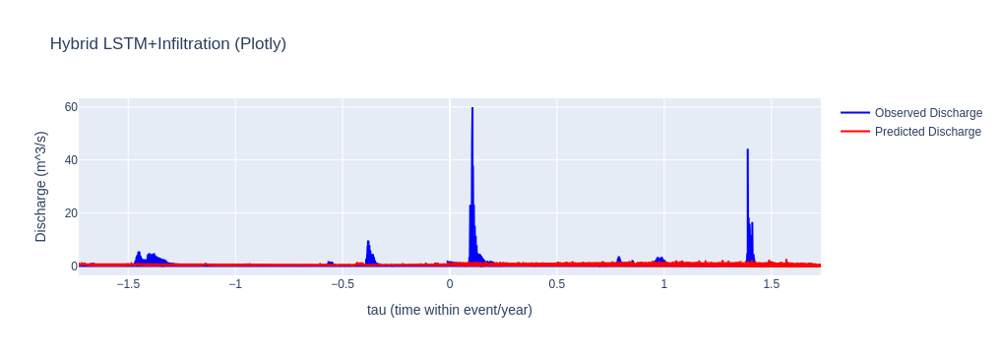

In [18]:
import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler

# For interactive plots
import plotly.graph_objects as go
from plotly.subplots import make_subplots

###############################################################################
# 1. Hyperparameters & File Paths
###############################################################################
DATA_DIR = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/merged/nov2apr/event_base_dfs/remapping time dfs/DEEP_RESEARCH/"

csv_files = [
    "Merged_North_Dead_Sea_2012_remapped.csv",
    "Merged_North_Dead_Sea_2013_remapped.csv",
    "Merged_North_Dead_Sea_2014_remapped.csv",
    "Merged_North_Dead_Sea_2015_remapped.csv",
    "Merged_North_Dead_Sea_2016_remapped.csv",
    "Merged_North_Dead_Sea_2018_remapped.csv",
    "Merged_North_Dead_Sea_2019_remapped.csv",
    "Merged_North_Dead_Sea_2020_remapped.csv",
]

# Larger LSTM + infiltration
HIDDEN_SIZE = 128
NUM_LAYERS = 2
DROPOUT = 0.2

# Training
BATCH_SIZE = 32
EPOCHS = 100
LR = 1e-4

# Weighted MSE in log space
BETA_WEIGHT = 10.0   # Emphasize big flows more
GLOBAL_QMAX = 60.0   # Approx max discharge for weighting

# Hybrid loss
LAMBDA_DATA = 1.0    # Weight for the data term
LAMBDA_PHYS = 0.1    # Weight for the physics infiltration term

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

###############################################################################
# 2. Load & Merge Data (No Filtering, Keep Chronological tau)
###############################################################################
def load_and_merge_data(data_dir, file_list):
    merged_dfs = []
    for fname in file_list:
        fpath = os.path.join(data_dir, fname)
        if not os.path.exists(fpath):
            print(f"[WARNING] File not found: {fpath}")
            continue
        
        df = pd.read_csv(fpath)
        # keep only station pixels
        df = df[~df["rg_qms"].isna()].copy()
        # sort by tau
        df.sort_values("tau", ascending=True, inplace=True)
        merged_dfs.append(df)
    
    if len(merged_dfs) == 0:
        raise ValueError("No valid CSV files found. Check paths.")
    
    station_df = pd.concat(merged_dfs, ignore_index=True)
    return station_df

###############################################################################
# 3. Feature Normalization
###############################################################################
def normalize_features(df):
    """
    We'll standard-scale the columns [rainrate, elevation, slope_calculated, tau].
    This often helps the LSTM converge.
    """
    feature_cols = ["rainrate", "elevation", "slope_calculated", "tau"]
    scaler = StandardScaler()
    df[feature_cols] = scaler.fit_transform(df[feature_cols])
    return df, scaler

###############################################################################
# 4. Make Sequences
###############################################################################
def make_sequences(df, seq_len=6):
    """
    We'll use [rainrate, elevation, slope_calculated, tau] as features,
    log1p(rg_qms) as the label (discharge).
    """
    feature_cols = ["rainrate", "elevation", "slope_calculated", "tau"]
    feats = df[feature_cols].values.astype(np.float32)
    
    discharge = df["rg_qms"].values.astype(np.float32)
    log_q = np.log1p(discharge)  # log-transform
    tau_vals = df["tau"].values.astype(np.float32)
    
    X_list, y_list, tau_list = [], [], []
    N = len(df)
    for i in range(N - seq_len):
        X_list.append(feats[i : i+seq_len])
        y_list.append(log_q[i + seq_len])
        tau_list.append(tau_vals[i + seq_len])
    
    X_all = np.array(X_list, dtype=np.float32)
    y_all = np.array(y_list, dtype=np.float32).reshape(-1,1)
    tau_all= np.array(tau_list, dtype=np.float32).reshape(-1,1)
    return X_all, y_all, tau_all

class DischargeDataset(Dataset):
    def __init__(self, X, y, tau):
        super().__init__()
        self.X = X
        self.y = y
        self.tau = tau
    def __len__(self):
        return len(self.X)
    def __getitem__(self, idx):
        return self.X[idx], self.y[idx], self.tau[idx]

###############################################################################
# 5. Model: LSTM + infiltration
###############################################################################
class LSTMInfiltrationModel(nn.Module):
    """
    LSTM predicts log(Q). PDE infiltration approach:
      infiltration(t) = i0 + iSlope*slope + iElev*elev
      effectiveRain = max(rain(t) - infiltration(t), 0)
      Q(t+1) - Q(t) = alpha * effectiveRain
    """
    def __init__(self, input_size=4, hidden_size=128, num_layers=2, dropout=0.2):
        super().__init__()
        self.lstm = nn.LSTM(input_size, hidden_size,
                            num_layers=num_layers,
                            batch_first=True,
                            dropout=dropout)
        self.fc = nn.Linear(hidden_size, 1)  # outputs log(Q)
        
        # alpha: master runoff factor
        self.alpha = nn.Parameter(torch.tensor(0.01, dtype=torch.float32))
        
        # infiltration params
        self.i0     = nn.Parameter(torch.tensor(0.1, dtype=torch.float32))
        self.iSlope = nn.Parameter(torch.tensor(0.0, dtype=torch.float32))
        self.iElev  = nn.Parameter(torch.tensor(0.0, dtype=torch.float32))
    
    def forward(self, x):
        lstm_out, (h_n, c_n) = self.lstm(x)
        out = lstm_out[:, -1, :]
        log_q_pred = self.fc(out)
        return log_q_pred
    
    def infiltration(self, slope, elev):
        return self.i0 + self.iSlope*slope + self.iElev*elev

###############################################################################
# 6. Weighted MSE in Log Space
###############################################################################
def weighted_mse_loss(log_q_pred, log_q_true, beta=10.0, global_qmax=60.0):
    Q_true = torch.expm1(log_q_true)
    w = 1.0 + beta*(Q_true / global_qmax)
    diff = (log_q_pred - log_q_true)**2
    weighted_diff = w * diff
    return torch.mean(weighted_diff)

###############################################################################
# 7. Training with Infiltration PDE
###############################################################################
def train_model(model, train_loader, optimizer, scheduler=None,
                num_epochs=100, lambda_data=1.0, lambda_phys=0.1,
                beta_weight=10.0, global_qmax=60.0):
    
    for epoch in range(num_epochs):
        model.train()
        epoch_data_loss = 0.0
        epoch_phys_loss = 0.0
        
        for X_batch, y_log_batch, _ in train_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            optimizer.zero_grad()
            
            # (A) Data Loss in log space, weighted
            log_q_pred_final = model(X_batch)  # [B,1]
            data_loss_val = weighted_mse_loss(
                log_q_pred_final, y_log_batch,
                beta=beta_weight, global_qmax=global_qmax
            )
            data_loss_val = data_loss_val * lambda_data
            
            # (B) Physics infiltration:
            # We'll do a single-step approach for each time in the seq
            # Q_t = exp(log_q_t)-1
            # infiltration(t) = i0 + iSlope*slope + iElev*elev
            # effRain = max(rain - infiltration, 0)
            # PDE: Q(t+1)-Q(t) = alpha * effRain
            Q_preds = []
            hidden = None
            seq_len = X_batch.size(1)
            
            for t_idx in range(seq_len):
                x_t = X_batch[:, t_idx, :].unsqueeze(1)
                if hidden is None:
                    lstm_out, hidden = model.lstm(x_t)
                else:
                    lstm_out, hidden = model.lstm(x_t, hidden)
                
                log_q_t = model.fc(lstm_out[:, -1, :])  # shape [B,1]
                Q_t = torch.expm1(log_q_t)
                Q_preds.append(Q_t)
            
            penalty = 0.0
            alpha = model.alpha
            
            for t_idx in range(seq_len-1):
                Q_t  = Q_preds[t_idx]
                Q_t1 = Q_preds[t_idx+1]
                
                rain_t  = X_batch[:, t_idx, 0].unsqueeze(1)  # scaled rain
                elev_t  = X_batch[:, t_idx, 1].unsqueeze(1)
                slope_t = X_batch[:, t_idx, 2].unsqueeze(1)
                
                infil_val    = model.infiltration(slope_t, elev_t)
                eff_rain_val = torch.clamp(rain_t - infil_val, min=0.0)
                
                diff = Q_t1 - Q_t - alpha*eff_rain_val
                penalty += torch.mean(diff**2)
            
            if (seq_len-1) > 0:
                penalty = penalty / (seq_len-1)
            
            phys_loss = penalty * lambda_phys
            
            total_loss = data_loss_val + phys_loss
            total_loss.backward()
            optimizer.step()
            
            epoch_data_loss += (data_loss_val.item() / max(lambda_data,1e-9))
            epoch_phys_loss += penalty.item()
        
        if scheduler is not None:
            scheduler.step()
        
        n_batches = len(train_loader)
        avg_data_loss = epoch_data_loss / n_batches
        avg_phys_loss = epoch_phys_loss / n_batches
        
        print(f"Epoch [{epoch+1}/{num_epochs}] - DataLoss: {avg_data_loss:.4f}, PhysLoss: {avg_phys_loss:.4f}")

###############################################################################
# 8. Evaluate & Plot (Plotly Interactive)
###############################################################################
def evaluate_and_plot_interactive(model, val_loader, title=""):
    model.eval()
    preds_list, truth_list, tau_list = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch in val_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true = torch.expm1(y_log_batch).cpu().numpy().flatten()
            
            preds_list.append(q_pred)
            truth_list.append(q_true)
            tau_list.append(tau_batch.cpu().numpy().flatten())
    
    preds = np.concatenate(preds_list)
    truth = np.concatenate(truth_list)
    taus = np.concatenate(tau_list)
    
    val_mse = np.mean((preds - truth)**2)
    print(f"{title} - Validation MSE (linear discharge): {val_mse:.4f}")
    
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=taus, y=truth,
                             mode='lines',
                             name='Observed Discharge',
                             line=dict(color='blue')))
    fig.add_trace(go.Scatter(x=taus, y=preds,
                             mode='lines',
                             name='Predicted Discharge',
                             line=dict(color='red')))
    
    fig.update_layout(
        title=title,
        xaxis_title="tau (time within event/year)",
        yaxis_title="Discharge (m^3/s)",
        hovermode="x"
    )
    fig.show()

###############################################################################
# 9. Main
###############################################################################
def main():
    # 1) Load data
    df_merged = load_and_merge_data(DATA_DIR, csv_files)
    print("Loaded station data shape:", df_merged.shape)
    
    # 2) Normalize features
    df_norm, scaler = normalize_features(df_merged)
    
    # 3) Create sequences (no filtering)
    X_all, y_all, tau_all = make_sequences(df_norm, seq_len=6)
    print("X_all shape:", X_all.shape, "y_all shape:", y_all.shape)
    
    # 4) Split train/val chronologically
    N = len(X_all)
    split_idx = int(0.8 * N)
    X_train, y_train, tau_train = X_all[:split_idx], y_all[:split_idx], tau_all[:split_idx]
    X_val,   y_val,   tau_val   = X_all[split_idx:], y_all[split_idx:], tau_all[split_idx:]
    
    train_ds = DischargeDataset(X_train, y_train, tau_train)
    val_ds   = DischargeDataset(X_val,   y_val,   tau_val)
    
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=False)
    val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False)
    
    # 5) Initialize infiltration model
    model = LSTMInfiltrationModel(
        input_size=4,
        hidden_size=HIDDEN_SIZE,
        num_layers=NUM_LAYERS,
        dropout=DROPOUT
    ).to(device)
    
    optimizer = torch.optim.Adam(model.parameters(), lr=LR)
    
    # Optional LR scheduler
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=30, gamma=0.5)
    
    # 6) Train
    print("\n=== Training: LSTM + Infiltration + Weighted MSE ===")
    train_model(
        model=model,
        train_loader=train_loader,
        optimizer=optimizer,
        scheduler=scheduler,
        num_epochs=EPOCHS,
        lambda_data=LAMBDA_DATA,
        lambda_phys=LAMBDA_PHYS,
        beta_weight=BETA_WEIGHT,
        global_qmax=GLOBAL_QMAX
    )
    
    # 7) Evaluate & Interactive Plot
    evaluate_and_plot_interactive(model, val_loader, title="Hybrid LSTM+Infiltration (Plotly)")

if __name__ == "__main__":
    main()


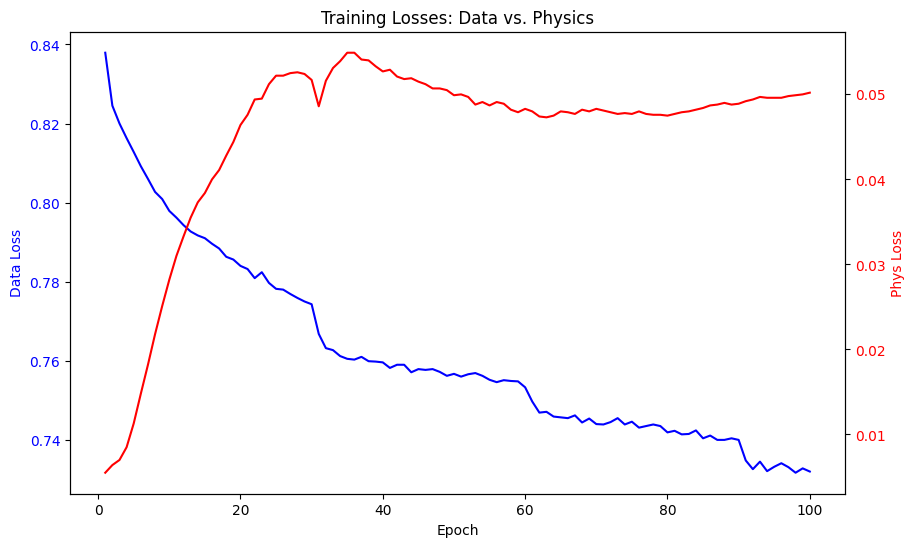

In [19]:
import matplotlib.pyplot as plt

# Arrays of recorded losses per epoch (extracted from your logs)
data_loss_values = [
    0.8379, 0.8245, 0.8200, 0.8163, 0.8128, 0.8092, 0.8060, 0.8027, 0.8009, 0.7979,
    0.7962, 0.7943, 0.7927, 0.7917, 0.7910, 0.7896, 0.7884, 0.7863, 0.7856, 0.7840,
    0.7832, 0.7809, 0.7824, 0.7797, 0.7782, 0.7780, 0.7769, 0.7759, 0.7750, 0.7743,
    0.7668, 0.7632, 0.7627, 0.7612, 0.7605, 0.7603, 0.7610, 0.7599, 0.7598, 0.7596,
    0.7582, 0.7590, 0.7590, 0.7571, 0.7579, 0.7577, 0.7579, 0.7572, 0.7562, 0.7567,
    0.7560, 0.7566, 0.7569, 0.7562, 0.7552, 0.7546, 0.7551, 0.7549, 0.7548, 0.7533,
    0.7497, 0.7469, 0.7471, 0.7459, 0.7457, 0.7455, 0.7462, 0.7444, 0.7454, 0.7440,
    0.7439, 0.7445, 0.7455, 0.7439, 0.7446, 0.7431, 0.7435, 0.7439, 0.7435, 0.7419,
    0.7423, 0.7414, 0.7415, 0.7424, 0.7404, 0.7411, 0.7400, 0.7400, 0.7404, 0.7400,
    0.7348, 0.7326, 0.7345, 0.7321, 0.7332, 0.7341, 0.7331, 0.7317, 0.7328, 0.7320
]

phys_loss_values = [
    0.0055, 0.0064, 0.0070, 0.0085, 0.0113, 0.0148, 0.0182, 0.0218, 0.0251, 0.0282,
    0.0310, 0.0333, 0.0355, 0.0373, 0.0384, 0.0400, 0.0411, 0.0428, 0.0444, 0.0464,
    0.0476, 0.0494, 0.0495, 0.0512, 0.0522, 0.0522, 0.0525, 0.0526, 0.0524, 0.0517,
    0.0486, 0.0516, 0.0531, 0.0539, 0.0549, 0.0549, 0.0541, 0.0540, 0.0533, 0.0527,
    0.0529, 0.0521, 0.0518, 0.0519, 0.0515, 0.0512, 0.0507, 0.0507, 0.0505, 0.0499,
    0.0500, 0.0497, 0.0488, 0.0491, 0.0487, 0.0491, 0.0489, 0.0482, 0.0479, 0.0483,
    0.0480, 0.0474, 0.0473, 0.0475, 0.0480, 0.0479, 0.0477, 0.0482, 0.0480, 0.0483,
    0.0481, 0.0479, 0.0477, 0.0478, 0.0477, 0.0480, 0.0477, 0.0476, 0.0476, 0.0475,
    0.0477, 0.0479, 0.0480, 0.0482, 0.0484, 0.0487, 0.0488, 0.0490, 0.0488, 0.0489,
    0.0492, 0.0494, 0.0497, 0.0496, 0.0496, 0.0496, 0.0498, 0.0499, 0.0500, 0.0502
]

epochs = range(1, 101)  # 1 through 100

plt.figure(figsize=(10, 6))

# Primary axis for Data Loss
ax1 = plt.gca()
ax1.plot(epochs, data_loss_values, color='blue', label='Data Loss')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Data Loss', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Secondary axis for Phys Loss
ax2 = ax1.twinx()
ax2.plot(epochs, phys_loss_values, color='red', label='Phys Loss')
ax2.set_ylabel('Phys Loss', color='red')
ax2.tick_params(axis='y', labelcolor='red')

plt.title("Training Losses: Data vs. Physics")
plt.show()


Using device: cuda
Loaded shape: (32301, 7)
X_all: (32295, 6, 4) y_all: (32295, 1)

=== Training: LSTM + ReLU infiltration + Weighted MSE ===
Epoch [1/120] - DataLoss: 1.0873, PhysLoss: 0.0095
Epoch [2/120] - DataLoss: 1.0688, PhysLoss: 0.0114
Epoch [3/120] - DataLoss: 1.0615, PhysLoss: 0.0126
Epoch [4/120] - DataLoss: 1.0555, PhysLoss: 0.0151
Epoch [5/120] - DataLoss: 1.0501, PhysLoss: 0.0189
Epoch [6/120] - DataLoss: 1.0447, PhysLoss: 0.0232
Epoch [7/120] - DataLoss: 1.0395, PhysLoss: 0.0277
Epoch [8/120] - DataLoss: 1.0345, PhysLoss: 0.0318
Epoch [9/120] - DataLoss: 1.0315, PhysLoss: 0.0348
Epoch [10/120] - DataLoss: 1.0276, PhysLoss: 0.0371
Epoch [11/120] - DataLoss: 1.0251, PhysLoss: 0.0389
Epoch [12/120] - DataLoss: 1.0234, PhysLoss: 0.0399
Epoch [13/120] - DataLoss: 1.0203, PhysLoss: 0.0414
Epoch [14/120] - DataLoss: 1.0178, PhysLoss: 0.0422
Epoch [15/120] - DataLoss: 1.0152, PhysLoss: 0.0428
Epoch [16/120] - DataLoss: 1.0169, PhysLoss: 0.0425
Epoch [17/120] - DataLoss: 1.0122, 

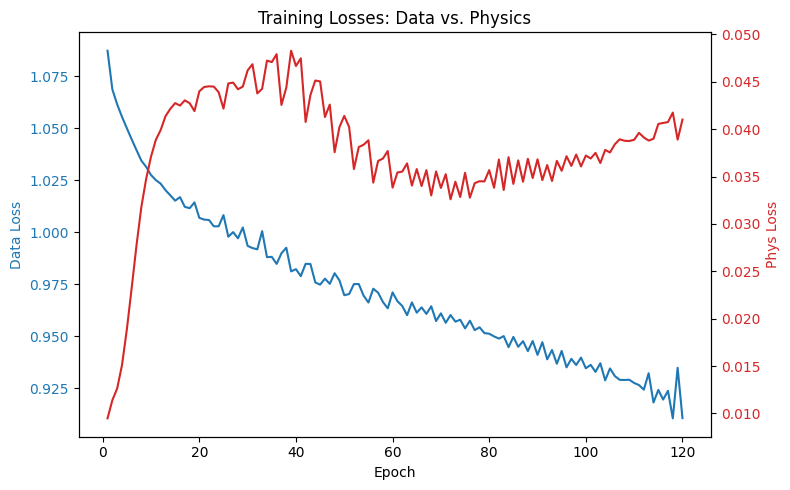

Hybrid LSTM + ReLU infiltration (Plotly) - Validation MSE (linear discharge): 3.1559


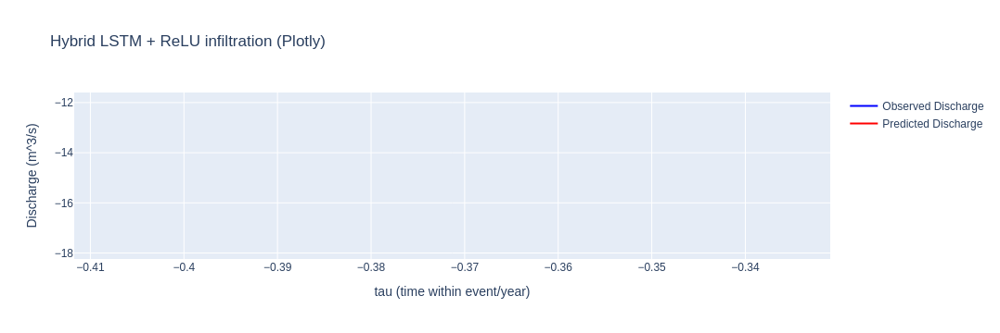

In [21]:
import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler

# For plotting
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

###############################################################################
# 1. Hyperparameters & File Paths
###############################################################################
DATA_DIR = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/merged/nov2apr/event_base_dfs/remapping time dfs/DEEP_RESEARCH/"

csv_files = [
    "Merged_North_Dead_Sea_2012_remapped.csv",
    "Merged_North_Dead_Sea_2013_remapped.csv",
    "Merged_North_Dead_Sea_2014_remapped.csv",
    "Merged_North_Dead_Sea_2015_remapped.csv",
    "Merged_North_Dead_Sea_2016_remapped.csv",
    "Merged_North_Dead_Sea_2018_remapped.csv",
    "Merged_North_Dead_Sea_2019_remapped.csv",
    "Merged_North_Dead_Sea_2020_remapped.csv",
]

# LSTM + infiltration PDE
HIDDEN_SIZE = 128
NUM_LAYERS = 2
DROPOUT = 0.2

BATCH_SIZE = 32
EPOCHS = 120
LR = 1e-4

# Weighted MSE emphasis on big flows
BETA_WEIGHT = 15.0
GLOBAL_QMAX = 60.0

# Hybrid loss weights
LAMBDA_DATA = 1.0     # data term
LAMBDA_PHYS = 0.2     # PDE infiltration term

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

###############################################################################
# 2. Data Loading & Merge (No Filtering, Just Chronological)
###############################################################################
def load_and_merge_data(data_dir, file_list):
    merged = []
    for fname in file_list:
        fpath = os.path.join(data_dir, fname)
        if not os.path.exists(fpath):
            print(f"[WARNING] Missing: {fpath}")
            continue
        df = pd.read_csv(fpath)
        # Keep station pixels
        df = df[~df["rg_qms"].isna()].copy()
        # Sort by tau
        df.sort_values("tau", ascending=True, inplace=True)
        merged.append(df)
    if not merged:
        raise ValueError("No valid CSV files found. Check paths.")
    
    df_merged = pd.concat(merged, ignore_index=True)
    return df_merged

###############################################################################
# 3. Normalize Features
###############################################################################
def normalize_features(df):
    feat_cols = ["rainrate", "elevation", "slope_calculated", "tau"]
    scaler = StandardScaler()
    df[feat_cols] = scaler.fit_transform(df[feat_cols])
    return df, scaler

###############################################################################
# 4. Make Sequences
###############################################################################
def make_sequences(df, seq_len=6):
    feat_cols = ["rainrate", "elevation", "slope_calculated", "tau"]
    feats = df[feat_cols].values.astype(np.float32)
    discharge = df["rg_qms"].values.astype(np.float32)
    log_q = np.log1p(discharge)
    tau_vals = df["tau"].values.astype(np.float32)
    
    X_list, y_list, tau_list = [], [], []
    N = len(df)
    for i in range(N - seq_len):
        X_list.append(feats[i : i+seq_len])
        y_list.append(log_q[i + seq_len])
        tau_list.append(tau_vals[i + seq_len])
    
    X_all = np.array(X_list, dtype=np.float32)
    y_all = np.array(y_list, dtype=np.float32).reshape(-1,1)
    tau_all= np.array(tau_list, dtype=np.float32).reshape(-1,1)
    return X_all, y_all, tau_all

class DischargeDataset(Dataset):
    def __init__(self, X, y, tau):
        super().__init__()
        self.X = X
        self.y = y
        self.tau = tau
    def __len__(self):
        return len(self.X)
    def __getitem__(self, idx):
        return self.X[idx], self.y[idx], self.tau[idx]

###############################################################################
# 5. LSTM + Infiltration PDE
###############################################################################
class LSTMInfiltrationReLU(nn.Module):
    """
    Q(t+1)-Q(t) = alpha * max(rain - infiltration, 0)
    infiltration = ReLU(i0 + iSlope*slope + iElev*elev)
    """
    def __init__(self, input_size=4, hidden_size=128, num_layers=2, dropout=0.2):
        super().__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, 
                            num_layers=num_layers,
                            batch_first=True,
                            dropout=dropout)
        self.fc = nn.Linear(hidden_size, 1)  # log(Q)
        
        self.alpha = nn.Parameter(torch.tensor(0.01, dtype=torch.float32))
        self.i0     = nn.Parameter(torch.tensor(0.1, dtype=torch.float32))
        self.iSlope = nn.Parameter(torch.tensor(0.0, dtype=torch.float32))
        self.iElev  = nn.Parameter(torch.tensor(0.0, dtype=torch.float32))
        
        # We use ReLU to ensure infiltration >= 0
        self.relu = nn.ReLU()
    
    def forward(self, x):
        lstm_out, (h_n, c_n) = self.lstm(x)
        out = lstm_out[:, -1, :]
        log_q_pred = self.fc(out)
        return log_q_pred
    
    def infiltration_fn(self, slope, elev):
        # infiltration = ReLU( i0 + iSlope*slope + iElev*elev )
        raw_infil = self.i0 + self.iSlope*slope + self.iElev*elev
        return self.relu(raw_infil)

###############################################################################
# 6. Weighted MSE
###############################################################################
def weighted_mse_loss(log_q_pred, log_q_true, beta=15.0, global_qmax=60.0):
    Q_true = torch.expm1(log_q_true)
    w = 1.0 + beta*(Q_true / global_qmax)
    diff = (log_q_pred - log_q_true)**2
    weighted_diff = w * diff
    return torch.mean(weighted_diff)

###############################################################################
# 7. Training Loop (Track data & physics loss each epoch)
###############################################################################
def train_model(
    model, train_loader, optimizer, 
    num_epochs=120, lambda_data=1.0, lambda_phys=0.2,
    beta_weight=15.0, global_qmax=60.0
):
    data_losses = []
    phys_losses = []
    
    for epoch in range(num_epochs):
        model.train()
        epoch_data_loss = 0.0
        epoch_phys_loss = 0.0
        n_batches = 0
        
        for X_batch, y_log_batch, _ in train_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            optimizer.zero_grad()
            
            # (A) Data Loss
            log_q_pred_final = model(X_batch)
            data_loss_val = weighted_mse_loss(
                log_q_pred_final, y_log_batch,
                beta=beta_weight, global_qmax=global_qmax
            )
            data_loss_val *= lambda_data
            
            # (B) PDE infiltration
            Q_preds = []
            hidden = None
            seq_len = X_batch.size(1)
            for t_idx in range(seq_len):
                x_t = X_batch[:, t_idx, :].unsqueeze(1)
                if hidden is None:
                    lstm_out, hidden = model.lstm(x_t)
                else:
                    lstm_out, hidden = model.lstm(x_t, hidden)
                
                log_q_t = model.fc(lstm_out[:, -1, :])
                Q_t = torch.expm1(log_q_t)
                Q_preds.append(Q_t)
            
            penalty = 0.0
            alpha = model.alpha
            for t_idx in range(seq_len-1):
                Q_t  = Q_preds[t_idx]
                Q_t1 = Q_preds[t_idx+1]
                
                # parse features
                rain_t  = X_batch[:, t_idx, 0].unsqueeze(1)  # scaled
                elev_t  = X_batch[:, t_idx, 1].unsqueeze(1)
                slope_t = X_batch[:, t_idx, 2].unsqueeze(1)
                
                infil_val = model.infiltration_fn(slope_t, elev_t)
                eff_rain  = torch.clamp(rain_t - infil_val, min=0.0)
                
                diff = Q_t1 - Q_t - alpha*eff_rain
                penalty += torch.mean(diff**2)
            
            if seq_len > 1:
                penalty = penalty / (seq_len-1)
            
            phys_loss = penalty * lambda_phys
            
            total_loss = data_loss_val + phys_loss
            total_loss.backward()
            optimizer.step()
            
            epoch_data_loss += data_loss_val.item() / max(lambda_data,1e-9)
            epoch_phys_loss += penalty.item()
            n_batches += 1
        
        if n_batches > 0:
            data_losses.append(epoch_data_loss / n_batches)
            phys_losses.append(epoch_phys_loss / n_batches)
        
        print(f"Epoch [{epoch+1}/{num_epochs}] - "
              f"DataLoss: {data_losses[-1]:.4f}, PhysLoss: {phys_losses[-1]:.4f}")
    
    return data_losses, phys_losses

###############################################################################
# 8. Plot Losses with Matplotlib & Evaluate with Plotly
###############################################################################
def plot_training_losses(data_losses, phys_losses):
    """
    Matplotlib plot: left y-axis for data loss, right y-axis for physics loss.
    """
    epochs = range(1, len(data_losses)+1)
    
    fig, ax1 = plt.subplots(figsize=(8,5))
    
    color_data = 'tab:blue'
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Data Loss", color=color_data)
    ax1.plot(epochs, data_losses, color=color_data)
    ax1.tick_params(axis='y', labelcolor=color_data)
    
    ax2 = ax1.twinx()
    color_phys = 'tab:red'
    ax2.set_ylabel("Phys Loss", color=color_phys)
    ax2.plot(epochs, phys_losses, color=color_phys)
    ax2.tick_params(axis='y', labelcolor=color_phys)
    
    plt.title("Training Losses: Data vs. Physics")
    plt.tight_layout()
    plt.show()

def evaluate_and_plotly(model, val_loader, title=""):
    model.eval()
    preds_list, truth_list, tau_list = [], [], []
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch in val_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true = torch.expm1(y_log_batch).cpu().numpy().flatten()
            
            preds_list.append(q_pred)
            truth_list.append(q_true)
            tau_list.append(tau_batch.cpu().numpy().flatten())
    
    preds = np.concatenate(preds_list)
    truth = np.concatenate(truth_list)
    taus = np.concatenate(tau_list)
    
    val_mse = np.mean((preds - truth)**2)
    print(f"{title} - Validation MSE (linear discharge): {val_mse:.4f}")
    
    fig = go.Figure()
    fig.add_trace(go.Scatter(
        x=taus, y=truth,
        mode='lines', name='Observed Discharge',
        line=dict(color='blue')
    ))
    fig.add_trace(go.Scatter(
        x=taus, y=preds,
        mode='lines', name='Predicted Discharge',
        line=dict(color='red')
    ))
    
    fig.update_layout(
        title=title,
        xaxis_title="tau (time within event/year)",
        yaxis_title="Discharge (m^3/s)",
        hovermode="x"
    )
    fig.show()

###############################################################################
# 9. Main
###############################################################################
def main():
    # 1) Load & Merge
    df_all = load_and_merge_data(DATA_DIR, csv_files)
    print("Loaded shape:", df_all.shape)
    
    # 2) Normalize
    df_norm, scaler = normalize_features(df_all)
    
    # 3) Sequences
    X_all, y_all, tau_all = make_sequences(df_norm, seq_len=6)
    print("X_all:", X_all.shape, "y_all:", y_all.shape)
    
    # 4) Train/Val Split
    N = len(X_all)
    split_idx = int(0.8 * N)
    X_train, y_train, tau_train = X_all[:split_idx], y_all[:split_idx], tau_all[:split_idx]
    X_val,   y_val,   tau_val   = X_all[split_idx:], y_all[split_idx:], tau_all[split_idx:]
    
    train_ds = DischargeDataset(X_train, y_train, tau_train)
    val_ds   = DischargeDataset(X_val,   y_val,   tau_val)
    
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=False)
    val_loader   = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False)
    
    # 5) Model
    model = LSTMInfiltrationReLU(
        input_size=4,
        hidden_size=HIDDEN_SIZE,
        num_layers=NUM_LAYERS,
        dropout=DROPOUT
    ).to(device)
    
    optimizer = torch.optim.Adam(model.parameters(), lr=LR)
    # Optional scheduler
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=40, gamma=0.5)
    
    # 6) Train
    print("\n=== Training: LSTM + ReLU infiltration + Weighted MSE ===")
    data_losses, phys_losses = train_model(
        model=model,
        train_loader=train_loader,
        optimizer=optimizer,
        num_epochs=EPOCHS,
        lambda_data=LAMBDA_DATA,
        lambda_phys=LAMBDA_PHYS,
        beta_weight=BETA_WEIGHT,
        global_qmax=GLOBAL_QMAX
    )
    
    # Optionally step the scheduler each epoch? (We used a separate approach above.)
    # for epoch in range(EPOCHS):
    #     ...
    #     scheduler.step()
    
    # 7) Plot losses with Matplotlib
    plot_training_losses(data_losses, phys_losses)
    
    # 8) Evaluate + Interactive Plotly
    evaluate_and_plotly(model, val_loader, title="Hybrid LSTM + ReLU infiltration (Plotly)")

if __name__ == "__main__":
    main()


Using device: cuda
Loaded shape: (32301, 7)
X_all: (32295, 6, 4) y_all: (32295, 1)

=== Training for 150 epochs, λ_phys=0.25, BETA_WEIGHT=15, hidden_size=128 ===
Epoch [1/150] - DataLoss: 1.0870, PhysLoss: 0.0069
Epoch [2/150] - DataLoss: 1.0678, PhysLoss: 0.0089
Epoch [3/150] - DataLoss: 1.0603, PhysLoss: 0.0100
Epoch [4/150] - DataLoss: 1.0540, PhysLoss: 0.0122
Epoch [5/150] - DataLoss: 1.0484, PhysLoss: 0.0154
Epoch [6/150] - DataLoss: 1.0430, PhysLoss: 0.0192
Epoch [7/150] - DataLoss: 1.0379, PhysLoss: 0.0227
Epoch [8/150] - DataLoss: 1.0336, PhysLoss: 0.0257
Epoch [9/150] - DataLoss: 1.0301, PhysLoss: 0.0279
Epoch [10/150] - DataLoss: 1.0264, PhysLoss: 0.0298
Epoch [11/150] - DataLoss: 1.0233, PhysLoss: 0.0311
Epoch [12/150] - DataLoss: 1.0231, PhysLoss: 0.0318
Epoch [13/150] - DataLoss: 1.0189, PhysLoss: 0.0329
Epoch [14/150] - DataLoss: 1.0185, PhysLoss: 0.0330
Epoch [15/150] - DataLoss: 1.0158, PhysLoss: 0.0330
Epoch [16/150] - DataLoss: 1.0166, PhysLoss: 0.0335
Epoch [17/150] 

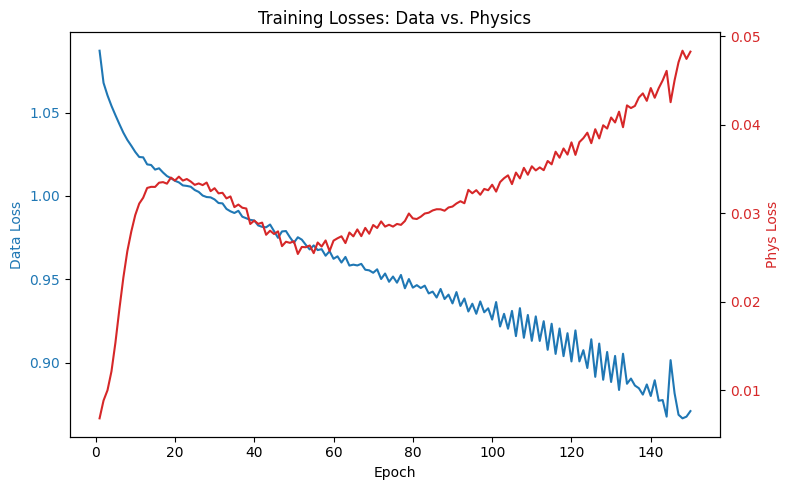

[Matplotlib] Overall Validation MSE: 3.2022


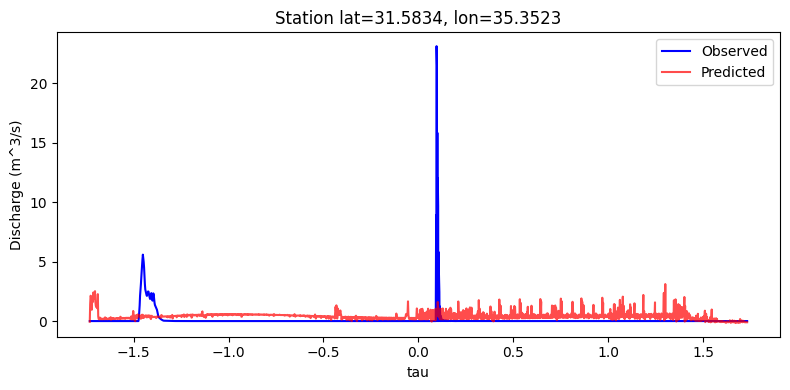

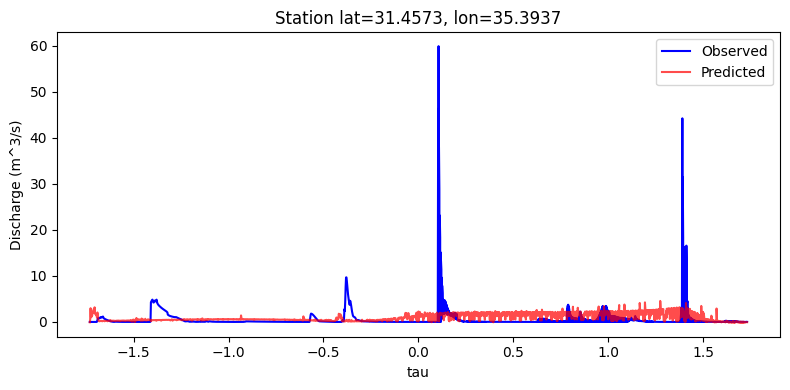

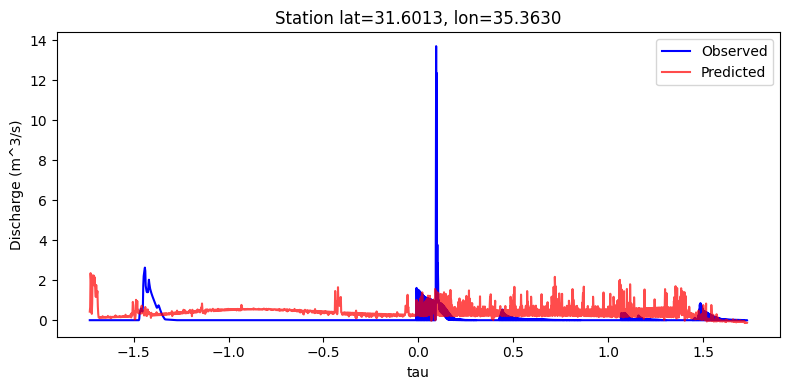

[Plotly] Overall Validation MSE: 3.2022


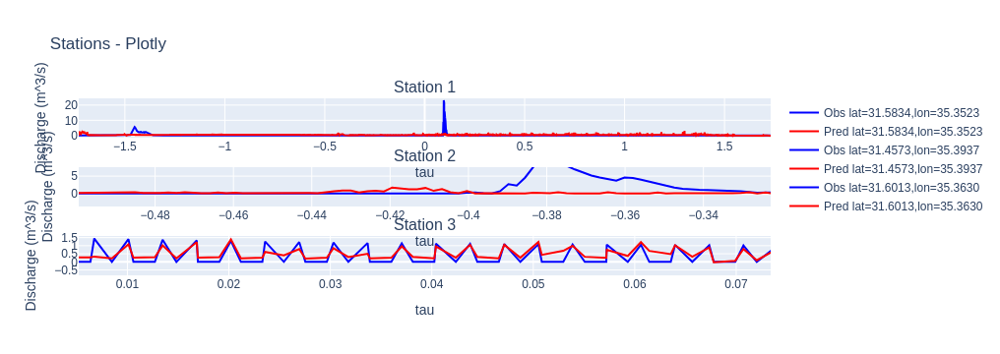

In [23]:
import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler

# For plotting
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

###############################################################################
# 1. Hyperparameters & File Paths
###############################################################################
DATA_DIR = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/merged/nov2apr/event_base_dfs/remapping time dfs/DEEP_RESEARCH/"

csv_files = [
    "Merged_North_Dead_Sea_2012_remapped.csv",
    "Merged_North_Dead_Sea_2013_remapped.csv",
    "Merged_North_Dead_Sea_2014_remapped.csv",
    "Merged_North_Dead_Sea_2015_remapped.csv",
    "Merged_North_Dead_Sea_2016_remapped.csv",
    "Merged_North_Dead_Sea_2018_remapped.csv",
    "Merged_North_Dead_Sea_2019_remapped.csv",
    "Merged_North_Dead_Sea_2020_remapped.csv",
]

# LSTM + infiltration PDE
HIDDEN_SIZE = 128
NUM_LAYERS = 2
DROPOUT = 0.2

BATCH_SIZE = 32
EPOCHS = 150             # increased from 120
LR = 1e-4

# Weighted MSE emphasis on big flows
BETA_WEIGHT = 15.0
GLOBAL_QMAX = 60.0

# Slightly increased lambda_phys
LAMBDA_DATA = 1.0     
LAMBDA_PHYS = 0.25    # was 0.2 before, now a small increase

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

###############################################################################
# 2. Data Loading & Merge (No Filtering)
###############################################################################
def load_and_merge_data(data_dir, file_list):
    merged = []
    for fname in file_list:
        fpath = os.path.join(data_dir, fname)
        if not os.path.exists(fpath):
            print(f"[WARNING] Missing: {fpath}")
            continue
        df = pd.read_csv(fpath)
        # Keep station pixels (where rg_qms not NaN)
        df = df[~df["rg_qms"].isna()].copy()
        # Sort by tau
        df.sort_values("tau", ascending=True, inplace=True)
        merged.append(df)
    if not merged:
        raise ValueError("No valid CSV files found. Check paths.")
    
    df_merged = pd.concat(merged, ignore_index=True)
    return df_merged

###############################################################################
# 3. Normalize Features
###############################################################################
def normalize_features(df):
    feat_cols = ["rainrate", "elevation", "slope_calculated", "tau"]
    scaler = StandardScaler()
    df[feat_cols] = scaler.fit_transform(df[feat_cols])
    return df, scaler

###############################################################################
# 4. Make Sequences + Keep lat/lon
###############################################################################
def make_sequences(df, seq_len=6):
    """
    We'll keep lat/lon so we know which station each row belongs to.
    That means each 'sample' also needs the lat/lon of the *final* step 
    for plotting station-based results.
    """
    feature_cols = ["rainrate", "elevation", "slope_calculated", "tau"]
    feats = df[feature_cols].values.astype(np.float32)
    
    discharge = df["rg_qms"].values.astype(np.float32)
    log_q = np.log1p(discharge)
    tau_vals = df["tau"].values.astype(np.float32)
    
    lat_vals = df["latitude"].values.astype(np.float32)
    lon_vals = df["longitude"].values.astype(np.float32)
    
    X_list, y_list = [], []
    tau_list, lat_list, lon_list = [], [], []
    N = len(df)
    for i in range(N - seq_len):
        X_list.append(feats[i : i+seq_len])
        y_list.append(log_q[i + seq_len])
        tau_list.append(tau_vals[i + seq_len])
        lat_list.append(lat_vals[i + seq_len])
        lon_list.append(lon_vals[i + seq_len])
    
    X_all = np.array(X_list, dtype=np.float32)
    y_all = np.array(y_list, dtype=np.float32).reshape(-1,1)
    tau_all= np.array(tau_list, dtype=np.float32).reshape(-1,1)
    lat_all= np.array(lat_list, dtype=np.float32).reshape(-1,1)
    lon_all= np.array(lon_list, dtype=np.float32).reshape(-1,1)
    
    return X_all, y_all, tau_all, lat_all, lon_all

class DischargeDataset(Dataset):
    def __init__(self, X, y, tau, lat, lon):
        super().__init__()
        self.X = X
        self.y = y
        self.tau = tau
        self.lat = lat
        self.lon = lon
    def __len__(self):
        return len(self.X)
    def __getitem__(self, idx):
        return self.X[idx], self.y[idx], self.tau[idx], self.lat[idx], self.lon[idx]

###############################################################################
# 5. LSTM + Infiltration PDE
###############################################################################
class LSTMInfiltrationReLU(nn.Module):
    def __init__(self, input_size=4, hidden_size=128, num_layers=2, dropout=0.2):
        super().__init__()
        self.lstm = nn.LSTM(input_size, hidden_size,
                            num_layers=num_layers,
                            batch_first=True,
                            dropout=dropout)
        self.fc = nn.Linear(hidden_size, 1)  # outputs log(Q)
        
        self.alpha = nn.Parameter(torch.tensor(0.01, dtype=torch.float32))
        self.i0     = nn.Parameter(torch.tensor(0.1, dtype=torch.float32))
        self.iSlope = nn.Parameter(torch.tensor(0.0, dtype=torch.float32))
        self.iElev  = nn.Parameter(torch.tensor(0.0, dtype=torch.float32))
        
        self.relu = nn.ReLU()
    
    def forward(self, x):
        lstm_out, (h_n, c_n) = self.lstm(x)
        out = lstm_out[:, -1, :]
        log_q_pred = self.fc(out)
        return log_q_pred
    
    def infiltration_fn(self, slope, elev):
        raw_infil = self.i0 + self.iSlope*slope + self.iElev*elev
        return self.relu(raw_infil)

###############################################################################
# 6. Weighted MSE
###############################################################################
def weighted_mse_loss(log_q_pred, log_q_true, beta=15.0, global_qmax=60.0):
    Q_true = torch.expm1(log_q_true)
    w = 1.0 + beta*(Q_true / global_qmax)
    diff = (log_q_pred - log_q_true)**2
    return torch.mean(w * diff)

###############################################################################
# 7. Training Loop
###############################################################################
def train_model(
    model, train_loader, optimizer, 
    num_epochs=150, lambda_data=1.0, lambda_phys=0.25,
    beta_weight=15.0, global_qmax=60.0
):
    data_losses = []
    phys_losses = []
    
    for epoch in range(num_epochs):
        model.train()
        epoch_data_loss = 0.0
        epoch_phys_loss = 0.0
        n_batches = 0
        
        for X_batch, y_log_batch, _, _, _ in train_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            optimizer.zero_grad()
            
            # (A) Data Loss
            log_q_pred = model(X_batch)
            data_loss_val = weighted_mse_loss(
                log_q_pred, y_log_batch,
                beta=beta_weight, global_qmax=global_qmax
            ) * lambda_data
            
            # (B) PDE infiltration
            Q_preds = []
            hidden = None
            seq_len = X_batch.size(1)
            for t_idx in range(seq_len):
                x_t = X_batch[:, t_idx, :].unsqueeze(1)
                if hidden is None:
                    lstm_out, hidden = model.lstm(x_t)
                else:
                    lstm_out, hidden = model.lstm(x_t, hidden)
                
                log_q_t = model.fc(lstm_out[:, -1, :])
                Q_t = torch.expm1(log_q_t)
                Q_preds.append(Q_t)
            
            penalty = 0.0
            alpha = model.alpha
            for t_idx in range(seq_len-1):
                Q_t  = Q_preds[t_idx]
                Q_t1 = Q_preds[t_idx+1]
                
                # parse features
                rain_t  = X_batch[:, t_idx, 0].unsqueeze(1)
                elev_t  = X_batch[:, t_idx, 1].unsqueeze(1)
                slope_t = X_batch[:, t_idx, 2].unsqueeze(1)
                
                infil_val = model.infiltration_fn(slope_t, elev_t)
                eff_rain  = torch.clamp(rain_t - infil_val, min=0.0)
                
                diff = Q_t1 - Q_t - alpha*eff_rain
                penalty += torch.mean(diff**2)
            
            if seq_len > 1:
                penalty = penalty / (seq_len-1)
            
            phys_loss = penalty * lambda_phys
            
            total_loss = data_loss_val + phys_loss
            total_loss.backward()
            optimizer.step()
            
            epoch_data_loss += data_loss_val.item() / max(lambda_data,1e-9)
            epoch_phys_loss += penalty.item()
            n_batches += 1
        
        if n_batches > 0:
            data_losses.append(epoch_data_loss / n_batches)
            phys_losses.append(epoch_phys_loss / n_batches)
        
        print(f"Epoch [{epoch+1}/{num_epochs}] - "
              f"DataLoss: {data_losses[-1]:.4f}, PhysLoss: {phys_losses[-1]:.4f}")
    
    return data_losses, phys_losses

###############################################################################
# 8. Plot Losses (Matplotlib), Evaluate Per Station, Plot Interactive (Plotly)
###############################################################################
def plot_training_losses(data_losses, phys_losses):
    epochs = range(1, len(data_losses)+1)
    
    fig, ax1 = plt.subplots(figsize=(8,5))
    
    color_data = 'tab:blue'
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Data Loss", color=color_data)
    ax1.plot(epochs, data_losses, color=color_data)
    ax1.tick_params(axis='y', labelcolor=color_data)
    
    ax2 = ax1.twinx()
    color_phys = 'tab:red'
    ax2.set_ylabel("Phys Loss", color=color_phys)
    ax2.plot(epochs, phys_losses, color=color_phys)
    ax2.tick_params(axis='y', labelcolor=color_phys)
    
    plt.title("Training Losses: Data vs. Physics")
    plt.tight_layout()
    plt.show()

def evaluate_per_station_matplotlib(model, val_loader):
    """
    Evaluate predictions, then separate them by lat/lon station
    and plot each station with Matplotlib.
    """
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in val_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true = torch.expm1(y_log_batch).cpu().numpy().flatten()
            tau_np = tau_batch.cpu().numpy().flatten()
            lat_np = lat_batch.numpy().flatten()
            lon_np = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    # Concatenate
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Matplotlib] Overall Validation MSE: {val_mse:.4f}")
    
    # Identify unique stations by lat/lon
    station_coords = {}
    for (lat, lon) in zip(all_lat, all_lon):
        station_coords[(lat, lon)] = True
    unique_stations = list(station_coords.keys())
    
    # For each station, filter data + plot
    for st in unique_stations:
        lat_st, lon_st = st
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        
        tau_st = all_tau[mask]
        obs_st = all_truth[mask]
        pred_st= all_preds[mask]
        
        # Sort by tau if needed
        idx_sort = np.argsort(tau_st)
        tau_st = tau_st[idx_sort]
        obs_st = obs_st[idx_sort]
        pred_st= pred_st[idx_sort]
        
        # Plot
        plt.figure(figsize=(8,4))
        plt.plot(tau_st, obs_st, label='Observed', color='blue')
        plt.plot(tau_st, pred_st, label='Predicted', color='red', alpha=0.7)
        plt.xlabel("tau")
        plt.ylabel("Discharge (m^3/s)")
        plt.title(f"Station lat={lat_st:.4f}, lon={lon_st:.4f}")
        plt.legend()
        plt.tight_layout()
        plt.show()

def evaluate_per_station_plotly(model, val_loader, title="Stations - Plotly"):
    """
    Similar approach, but build a multi-subplot Plotly figure 
    with one subplot per station.
    """
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in val_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true = torch.expm1(y_log_batch).cpu().numpy().flatten()
            tau_np = tau_batch.cpu().numpy().flatten()
            lat_np = lat_batch.numpy().flatten()
            lon_np = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Plotly] Overall Validation MSE: {val_mse:.4f}")
    
    # Identify unique stations
    stations_map = {}
    for (lat, lon) in zip(all_lat, all_lon):
        stations_map[(lat, lon)] = True
    unique_stations = list(stations_map.keys())
    n_stations = len(unique_stations)
    
    # Make a subplot with #rows = #stations (1 column for simplicity)
    fig = make_subplots(rows=n_stations, cols=1, 
                        subplot_titles=[f"Station {i+1}" for i in range(n_stations)])
    
    row_idx = 1
    for st in unique_stations:
        lat_st, lon_st = st
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        
        tau_st = all_tau[mask]
        obs_st = all_truth[mask]
        pred_st= all_preds[mask]
        
        # Sort by tau for nice plotting
        idx_sort = np.argsort(tau_st)
        tau_st = tau_st[idx_sort]
        obs_st = obs_st[idx_sort]
        pred_st= pred_st[idx_sort]
        
        fig.add_trace(
            go.Scatter(x=tau_st, y=obs_st, mode='lines', name=f"Obs lat={lat_st:.4f},lon={lon_st:.4f}",
                       line=dict(color='blue')),
            row=row_idx, col=1
        )
        fig.add_trace(
            go.Scatter(x=tau_st, y=pred_st, mode='lines', name=f"Pred lat={lat_st:.4f},lon={lon_st:.4f}",
                       line=dict(color='red')),
            row=row_idx, col=1
        )
        
        row_idx += 1
    
    fig.update_layout(
        title=title,
        hovermode='x',
        showlegend=True,
        height=300*n_stations,  # to give each subplot decent vertical space
    )
    fig.update_xaxes(title_text='tau')
    fig.update_yaxes(title_text='Discharge (m^3/s)')
    
    fig.show()


###############################################################################
# 9. Main
###############################################################################
def main():
    # 1) Load & Merge
    df_all = load_and_merge_data(DATA_DIR, csv_files)
    print("Loaded shape:", df_all.shape)
    
    # 2) Normalize
    df_norm, scaler = normalize_features(df_all)
    
    # 3) Sequences
    X_all, y_all, tau_all, lat_all, lon_all = make_sequences(df_norm, seq_len=6)
    print("X_all:", X_all.shape, "y_all:", y_all.shape)
    
    # 4) Train/Val Split
    N = len(X_all)
    split_idx = int(0.8 * N)
    
    X_train, y_train   = X_all[:split_idx], y_all[:split_idx]
    tau_train, lat_train, lon_train = tau_all[:split_idx], lat_all[:split_idx], lon_all[:split_idx]
    
    X_val,   y_val     = X_all[split_idx:], y_all[split_idx:]
    tau_val, lat_val, lon_val = tau_all[split_idx:], lat_all[split_idx:], lon_all[split_idx:]
    
    train_ds = DischargeDataset(X_train, y_train, tau_train, lat_train, lon_train)
    val_ds   = DischargeDataset(X_val,   y_val,   tau_val,   lat_val,   lon_val)
    
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=False)
    val_loader   = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False)
    
    # 5) Model
    model = LSTMInfiltrationReLU(
        input_size=4,
        hidden_size=HIDDEN_SIZE,
        num_layers=NUM_LAYERS,
        dropout=DROPOUT
    ).to(device)
    
    optimizer = torch.optim.Adam(model.parameters(), lr=LR)
    
    # 6) Train
    print("\n=== Training for 150 epochs, λ_phys=0.25, BETA_WEIGHT=15, hidden_size=128 ===")
    data_losses, phys_losses = train_model(
        model=model,
        train_loader=train_loader,
        optimizer=optimizer,
        num_epochs=EPOCHS,
        lambda_data=LAMBDA_DATA,
        lambda_phys=LAMBDA_PHYS,
        beta_weight=BETA_WEIGHT,
        global_qmax=GLOBAL_QMAX
    )
    
    # 7) Plot Training Losses (Matplotlib)
    plot_training_losses(data_losses, phys_losses)
    
    # 8) Evaluate per station in Matplotlib
    evaluate_per_station_matplotlib(model, val_loader)
    
    # 9) Evaluate per station in Plotly (interactive)
    evaluate_per_station_plotly(model, val_loader, title="Stations - Plotly")

if __name__ == "__main__":
    main()


Using device: cuda
Loaded shape: (32301, 7)
X_all: (32295, 6, 4) y_all: (32295, 1)

=== Training for 150 epochs, λ_phys=0.25, BETA_WEIGHT=15, hidden_size=128 ===
Epoch [1/40] - DataLoss: 1.0873, PhysLoss: 0.0102
Epoch [2/40] - DataLoss: 1.0702, PhysLoss: 0.0114
Epoch [3/40] - DataLoss: 1.0644, PhysLoss: 0.0116
Epoch [4/40] - DataLoss: 1.0596, PhysLoss: 0.0122
Epoch [5/40] - DataLoss: 1.0556, PhysLoss: 0.0130
Epoch [6/40] - DataLoss: 1.0519, PhysLoss: 0.0137
Epoch [7/40] - DataLoss: 1.0488, PhysLoss: 0.0143
Epoch [8/40] - DataLoss: 1.0454, PhysLoss: 0.0146
Epoch [9/40] - DataLoss: 1.0419, PhysLoss: 0.0150
Epoch [10/40] - DataLoss: 1.0389, PhysLoss: 0.0152
Epoch [11/40] - DataLoss: 1.0360, PhysLoss: 0.0152
Epoch [12/40] - DataLoss: 1.0337, PhysLoss: 0.0148
Epoch [13/40] - DataLoss: 1.0348, PhysLoss: 0.0152
Epoch [14/40] - DataLoss: 1.0276, PhysLoss: 0.0150
Epoch [15/40] - DataLoss: 1.0268, PhysLoss: 0.0149
Epoch [16/40] - DataLoss: 1.0252, PhysLoss: 0.0147
Epoch [17/40] - DataLoss: 1.022

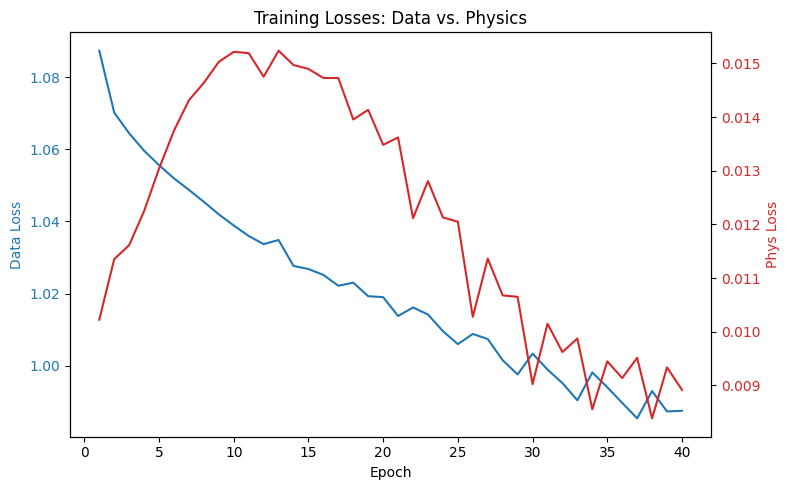

[Matplotlib] Overall Validation MSE: 2.9751


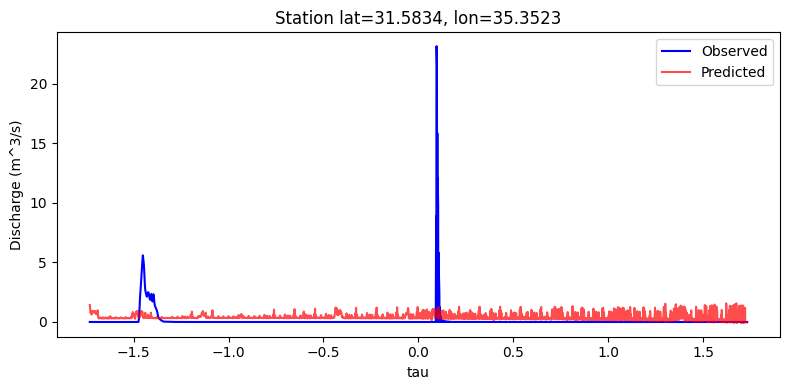

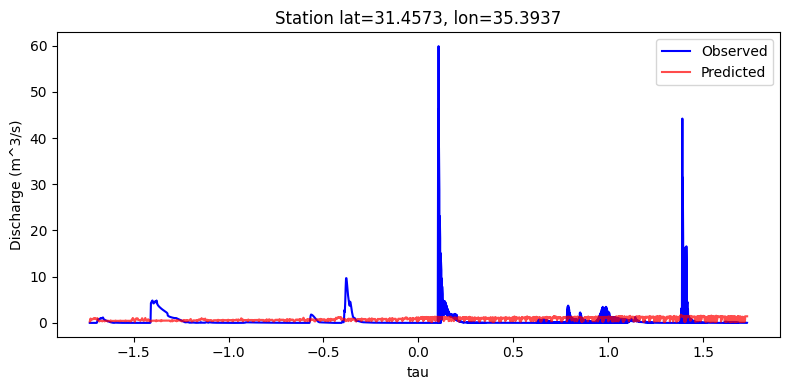

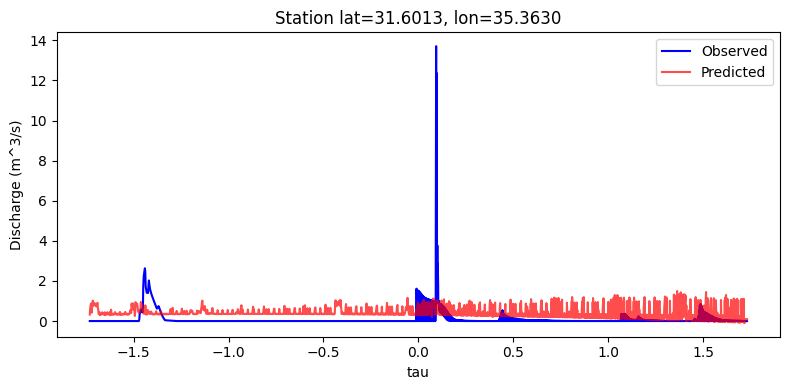

[Plotly] Overall Validation MSE: 2.9751


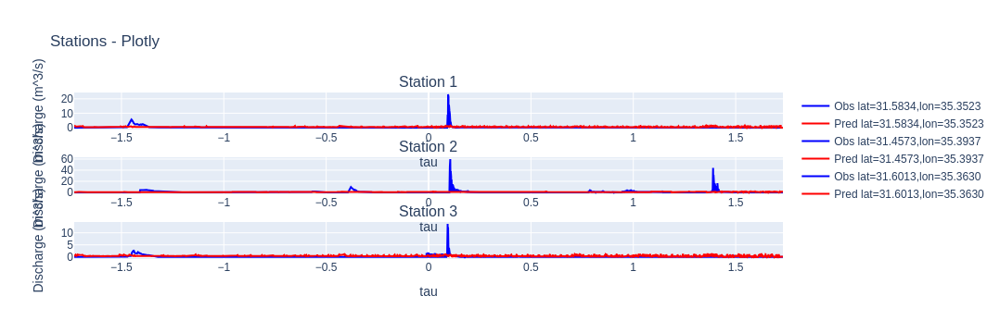

In [2]:
import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler

# For plotting
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

###############################################################################
# 1. Hyperparameters & File Paths
###############################################################################
DATA_DIR = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/merged/nov2apr/event_base_dfs/remapping time dfs/DEEP_RESEARCH/"

csv_files = [
    "Merged_North_Dead_Sea_2012_remapped.csv",
    "Merged_North_Dead_Sea_2013_remapped.csv",
    "Merged_North_Dead_Sea_2014_remapped.csv",
    "Merged_North_Dead_Sea_2015_remapped.csv",
    "Merged_North_Dead_Sea_2016_remapped.csv",
    "Merged_North_Dead_Sea_2018_remapped.csv",
    "Merged_North_Dead_Sea_2019_remapped.csv",
    "Merged_North_Dead_Sea_2020_remapped.csv",
]

# LSTM + infiltration PDE
HIDDEN_SIZE = 128
NUM_LAYERS = 2
DROPOUT = 0.2

BATCH_SIZE = 32
EPOCHS = 40             # increased from 120
LR = 1e-4

# Weighted MSE emphasis on big flows
BETA_WEIGHT = 15.0
GLOBAL_QMAX = 60.0

# Slightly increased lambda_phys
LAMBDA_DATA = 1.0     
LAMBDA_PHYS = 0.8    # was 0.2 before, now a small increase

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

###############################################################################
# 2. Data Loading & Merge (No Filtering)
###############################################################################
def load_and_merge_data(data_dir, file_list):
    merged = []
    for fname in file_list:
        fpath = os.path.join(data_dir, fname)
        if not os.path.exists(fpath):
            print(f"[WARNING] Missing: {fpath}")
            continue
        df = pd.read_csv(fpath)
        # Keep station pixels (where rg_qms not NaN)
        df = df[~df["rg_qms"].isna()].copy()
        # Sort by tau
        df.sort_values("tau", ascending=True, inplace=True)
        merged.append(df)
    if not merged:
        raise ValueError("No valid CSV files found. Check paths.")
    
    df_merged = pd.concat(merged, ignore_index=True)
    return df_merged

###############################################################################
# 3. Normalize Features
###############################################################################
def normalize_features(df):
    feat_cols = ["rainrate", "elevation", "slope_calculated", "tau"]
    scaler = StandardScaler()
    df[feat_cols] = scaler.fit_transform(df[feat_cols])
    return df, scaler

###############################################################################
# 4. Make Sequences + Keep lat/lon
###############################################################################
def make_sequences(df, seq_len=6):
    """
    We'll keep lat/lon so we know which station each row belongs to.
    That means each 'sample' also needs the lat/lon of the *final* step 
    for plotting station-based results.
    """
    feature_cols = ["rainrate", "elevation", "slope_calculated", "tau"]
    feats = df[feature_cols].values.astype(np.float32)
    
    discharge = df["rg_qms"].values.astype(np.float32)
    log_q = np.log1p(discharge)
    tau_vals = df["tau"].values.astype(np.float32)
    
    lat_vals = df["latitude"].values.astype(np.float32)
    lon_vals = df["longitude"].values.astype(np.float32)
    
    X_list, y_list = [], []
    tau_list, lat_list, lon_list = [], [], []
    N = len(df)
    for i in range(N - seq_len):
        X_list.append(feats[i : i+seq_len])
        y_list.append(log_q[i + seq_len])
        tau_list.append(tau_vals[i + seq_len])
        lat_list.append(lat_vals[i + seq_len])
        lon_list.append(lon_vals[i + seq_len])
    
    X_all = np.array(X_list, dtype=np.float32)
    y_all = np.array(y_list, dtype=np.float32).reshape(-1,1)
    tau_all= np.array(tau_list, dtype=np.float32).reshape(-1,1)
    lat_all= np.array(lat_list, dtype=np.float32).reshape(-1,1)
    lon_all= np.array(lon_list, dtype=np.float32).reshape(-1,1)
    
    return X_all, y_all, tau_all, lat_all, lon_all

class DischargeDataset(Dataset):
    def __init__(self, X, y, tau, lat, lon):
        super().__init__()
        self.X = X
        self.y = y
        self.tau = tau
        self.lat = lat
        self.lon = lon
    def __len__(self):
        return len(self.X)
    def __getitem__(self, idx):
        return self.X[idx], self.y[idx], self.tau[idx], self.lat[idx], self.lon[idx]

###############################################################################
# 5. LSTM + Infiltration PDE
###############################################################################
class LSTMInfiltrationReLU(nn.Module):
    def __init__(self, input_size=4, hidden_size=128, num_layers=2, dropout=0.2):
        super().__init__()
        self.lstm = nn.LSTM(input_size, hidden_size,
                            num_layers=num_layers,
                            batch_first=True,
                            dropout=dropout)
        self.fc = nn.Linear(hidden_size, 1)  # outputs log(Q)
        
        self.alpha = nn.Parameter(torch.tensor(0.01, dtype=torch.float32))
        self.i0     = nn.Parameter(torch.tensor(0.1, dtype=torch.float32))
        self.iSlope = nn.Parameter(torch.tensor(0.0, dtype=torch.float32))
        self.iElev  = nn.Parameter(torch.tensor(0.0, dtype=torch.float32))
        
        self.relu = nn.ReLU()
    
    def forward(self, x):
        lstm_out, (h_n, c_n) = self.lstm(x)
        out = lstm_out[:, -1, :]
        log_q_pred = self.fc(out)
        return log_q_pred
    
    def infiltration_fn(self, slope, elev):
        raw_infil = self.i0 + self.iSlope*slope + self.iElev*elev
        return self.relu(raw_infil)

###############################################################################
# 6. Weighted MSE
###############################################################################
def weighted_mse_loss(log_q_pred, log_q_true, beta=15.0, global_qmax=60.0):
    Q_true = torch.expm1(log_q_true)
    w = 1.0 + beta*(Q_true / global_qmax)
    diff = (log_q_pred - log_q_true)**2
    return torch.mean(w * diff)

###############################################################################
# 7. Training Loop
###############################################################################
def train_model(
    model, train_loader, optimizer, 
    num_epochs=150, lambda_data=1.0, lambda_phys=0.25,
    beta_weight=15.0, global_qmax=60.0
):
    data_losses = []
    phys_losses = []
    
    for epoch in range(num_epochs):
        model.train()
        epoch_data_loss = 0.0
        epoch_phys_loss = 0.0
        n_batches = 0
        
        for X_batch, y_log_batch, _, _, _ in train_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            optimizer.zero_grad()
            
            # (A) Data Loss
            log_q_pred = model(X_batch)
            data_loss_val = weighted_mse_loss(
                log_q_pred, y_log_batch,
                beta=beta_weight, global_qmax=global_qmax
            ) * lambda_data
            
            # (B) PDE infiltration
            Q_preds = []
            hidden = None
            seq_len = X_batch.size(1)
            for t_idx in range(seq_len):
                x_t = X_batch[:, t_idx, :].unsqueeze(1)
                if hidden is None:
                    lstm_out, hidden = model.lstm(x_t)
                else:
                    lstm_out, hidden = model.lstm(x_t, hidden)
                
                log_q_t = model.fc(lstm_out[:, -1, :])
                Q_t = torch.expm1(log_q_t)
                Q_preds.append(Q_t)
            
            penalty = 0.0
            alpha = model.alpha
            for t_idx in range(seq_len-1):
                Q_t  = Q_preds[t_idx]
                Q_t1 = Q_preds[t_idx+1]
                
                # parse features
                rain_t  = X_batch[:, t_idx, 0].unsqueeze(1)
                elev_t  = X_batch[:, t_idx, 1].unsqueeze(1)
                slope_t = X_batch[:, t_idx, 2].unsqueeze(1)
                
                infil_val = model.infiltration_fn(slope_t, elev_t)
                eff_rain  = torch.clamp(rain_t - infil_val, min=0.0)
                
                diff = Q_t1 - Q_t - alpha*eff_rain
                penalty += torch.mean(diff**2)
            
            if seq_len > 1:
                penalty = penalty / (seq_len-1)
            
            phys_loss = penalty * lambda_phys
            
            total_loss = data_loss_val + phys_loss
            total_loss.backward()
            optimizer.step()
            
            epoch_data_loss += data_loss_val.item() / max(lambda_data,1e-9)
            epoch_phys_loss += penalty.item()
            n_batches += 1
        
        if n_batches > 0:
            data_losses.append(epoch_data_loss / n_batches)
            phys_losses.append(epoch_phys_loss / n_batches)
        
        print(f"Epoch [{epoch+1}/{num_epochs}] - "
              f"DataLoss: {data_losses[-1]:.4f}, PhysLoss: {phys_losses[-1]:.4f}")
    
    return data_losses, phys_losses

###############################################################################
# 8. Plot Losses (Matplotlib), Evaluate Per Station, Plot Interactive (Plotly)
###############################################################################
def plot_training_losses(data_losses, phys_losses):
    epochs = range(1, len(data_losses)+1)
    
    fig, ax1 = plt.subplots(figsize=(8,5))
    
    color_data = 'tab:blue'
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Data Loss", color=color_data)
    ax1.plot(epochs, data_losses, color=color_data)
    ax1.tick_params(axis='y', labelcolor=color_data)
    
    ax2 = ax1.twinx()
    color_phys = 'tab:red'
    ax2.set_ylabel("Phys Loss", color=color_phys)
    ax2.plot(epochs, phys_losses, color=color_phys)
    ax2.tick_params(axis='y', labelcolor=color_phys)
    
    plt.title("Training Losses: Data vs. Physics")
    plt.tight_layout()
    plt.show()

def evaluate_per_station_matplotlib(model, val_loader):
    """
    Evaluate predictions, then separate them by lat/lon station
    and plot each station with Matplotlib.
    """
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in val_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true = torch.expm1(y_log_batch).cpu().numpy().flatten()
            tau_np = tau_batch.cpu().numpy().flatten()
            lat_np = lat_batch.numpy().flatten()
            lon_np = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    # Concatenate
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Matplotlib] Overall Validation MSE: {val_mse:.4f}")
    
    # Identify unique stations by lat/lon
    station_coords = {}
    for (lat, lon) in zip(all_lat, all_lon):
        station_coords[(lat, lon)] = True
    unique_stations = list(station_coords.keys())
    
    # For each station, filter data + plot
    for st in unique_stations:
        lat_st, lon_st = st
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        
        tau_st = all_tau[mask]
        obs_st = all_truth[mask]
        pred_st= all_preds[mask]
        
        # Sort by tau if needed
        idx_sort = np.argsort(tau_st)
        tau_st = tau_st[idx_sort]
        obs_st = obs_st[idx_sort]
        pred_st= pred_st[idx_sort]
        
        # Plot
        plt.figure(figsize=(8,4))
        plt.plot(tau_st, obs_st, label='Observed', color='blue')
        plt.plot(tau_st, pred_st, label='Predicted', color='red', alpha=0.7)
        plt.xlabel("tau")
        plt.ylabel("Discharge (m^3/s)")
        plt.title(f"Station lat={lat_st:.4f}, lon={lon_st:.4f}")
        plt.legend()
        plt.tight_layout()
        plt.show()

def evaluate_per_station_plotly(model, val_loader, title="Stations - Plotly"):
    """
    Similar approach, but build a multi-subplot Plotly figure 
    with one subplot per station.
    """
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in val_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true = torch.expm1(y_log_batch).cpu().numpy().flatten()
            tau_np = tau_batch.cpu().numpy().flatten()
            lat_np = lat_batch.numpy().flatten()
            lon_np = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Plotly] Overall Validation MSE: {val_mse:.4f}")
    
    # Identify unique stations
    stations_map = {}
    for (lat, lon) in zip(all_lat, all_lon):
        stations_map[(lat, lon)] = True
    unique_stations = list(stations_map.keys())
    n_stations = len(unique_stations)
    
    # Make a subplot with #rows = #stations (1 column for simplicity)
    fig = make_subplots(rows=n_stations, cols=1, 
                        subplot_titles=[f"Station {i+1}" for i in range(n_stations)])
    
    row_idx = 1
    for st in unique_stations:
        lat_st, lon_st = st
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        
        tau_st = all_tau[mask]
        obs_st = all_truth[mask]
        pred_st= all_preds[mask]
        
        # Sort by tau for nice plotting
        idx_sort = np.argsort(tau_st)
        tau_st = tau_st[idx_sort]
        obs_st = obs_st[idx_sort]
        pred_st= pred_st[idx_sort]
        
        fig.add_trace(
            go.Scatter(x=tau_st, y=obs_st, mode='lines', name=f"Obs lat={lat_st:.4f},lon={lon_st:.4f}",
                       line=dict(color='blue')),
            row=row_idx, col=1
        )
        fig.add_trace(
            go.Scatter(x=tau_st, y=pred_st, mode='lines', name=f"Pred lat={lat_st:.4f},lon={lon_st:.4f}",
                       line=dict(color='red')),
            row=row_idx, col=1
        )
        
        row_idx += 1
    
    fig.update_layout(
        title=title,
        hovermode='x',
        showlegend=True,
        height=300*n_stations,  # to give each subplot decent vertical space
    )
    fig.update_xaxes(title_text='tau')
    fig.update_yaxes(title_text='Discharge (m^3/s)')
    
    fig.show()


###############################################################################
# 9. Main
###############################################################################
def main():
    # 1) Load & Merge
    df_all = load_and_merge_data(DATA_DIR, csv_files)
    print("Loaded shape:", df_all.shape)
    
    # 2) Normalize
    df_norm, scaler = normalize_features(df_all)
    
    # 3) Sequences
    X_all, y_all, tau_all, lat_all, lon_all = make_sequences(df_norm, seq_len=6)
    print("X_all:", X_all.shape, "y_all:", y_all.shape)
    
    # 4) Train/Val Split
    N = len(X_all)
    split_idx = int(0.8 * N)
    
    X_train, y_train   = X_all[:split_idx], y_all[:split_idx]
    tau_train, lat_train, lon_train = tau_all[:split_idx], lat_all[:split_idx], lon_all[:split_idx]
    
    X_val,   y_val     = X_all[split_idx:], y_all[split_idx:]
    tau_val, lat_val, lon_val = tau_all[split_idx:], lat_all[split_idx:], lon_all[split_idx:]
    
    train_ds = DischargeDataset(X_train, y_train, tau_train, lat_train, lon_train)
    val_ds   = DischargeDataset(X_val,   y_val,   tau_val,   lat_val,   lon_val)
    
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=False)
    val_loader   = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False)
    
    # 5) Model
    model = LSTMInfiltrationReLU(
        input_size=4,
        hidden_size=HIDDEN_SIZE,
        num_layers=NUM_LAYERS,
        dropout=DROPOUT
    ).to(device)
    
    optimizer = torch.optim.Adam(model.parameters(), lr=LR)
    
    # 6) Train
    print("\n=== Training for 150 epochs, λ_phys=0.25, BETA_WEIGHT=15, hidden_size=128 ===")
    data_losses, phys_losses = train_model(
        model=model,
        train_loader=train_loader,
        optimizer=optimizer,
        num_epochs=EPOCHS,
        lambda_data=LAMBDA_DATA,
        lambda_phys=LAMBDA_PHYS,
        beta_weight=BETA_WEIGHT,
        global_qmax=GLOBAL_QMAX
    )
    
    # 7) Plot Training Losses (Matplotlib)
    plot_training_losses(data_losses, phys_losses)
    
    # 8) Evaluate per station in Matplotlib
    evaluate_per_station_matplotlib(model, val_loader)
    
    # 9) Evaluate per station in Plotly (interactive)
    evaluate_per_station_plotly(model, val_loader, title="Stations - Plotly")

if __name__ == "__main__":
    main()


In [ ]:
#I have changed the loss function to log^(my_loss) , and lamdda_physics is - 0.25

Using device: cuda
Loaded shape: (32301, 7)
X_all: (32295, 6, 4) y_all: (32295, 1)

=== Training for 150 epochs, λ_phys=0.25, BETA_WEIGHT=15, hidden_size=128 ===
Epoch [1/300] - DataLoss: 1.0818, PhysLoss: 0.0062
Epoch [2/300] - DataLoss: 1.0649, PhysLoss: 0.0078
Epoch [3/300] - DataLoss: 1.0589, PhysLoss: 0.0084
Epoch [4/300] - DataLoss: 1.0543, PhysLoss: 0.0091
Epoch [5/300] - DataLoss: 1.0503, PhysLoss: 0.0100
Epoch [6/300] - DataLoss: 1.0473, PhysLoss: 0.0108
Epoch [7/300] - DataLoss: 1.0437, PhysLoss: 0.0115
Epoch [8/300] - DataLoss: 1.0405, PhysLoss: 0.0120
Epoch [9/300] - DataLoss: 1.0376, PhysLoss: 0.0122
Epoch [10/300] - DataLoss: 1.0356, PhysLoss: 0.0124
Epoch [11/300] - DataLoss: 1.0315, PhysLoss: 0.0127
Epoch [12/300] - DataLoss: 1.0287, PhysLoss: 0.0127
Epoch [13/300] - DataLoss: 1.0275, PhysLoss: 0.0124
Epoch [14/300] - DataLoss: 1.0279, PhysLoss: 0.0126
Epoch [15/300] - DataLoss: 1.0229, PhysLoss: 0.0124
Epoch [16/300] - DataLoss: 1.0206, PhysLoss: 0.0124
Epoch [17/300] 

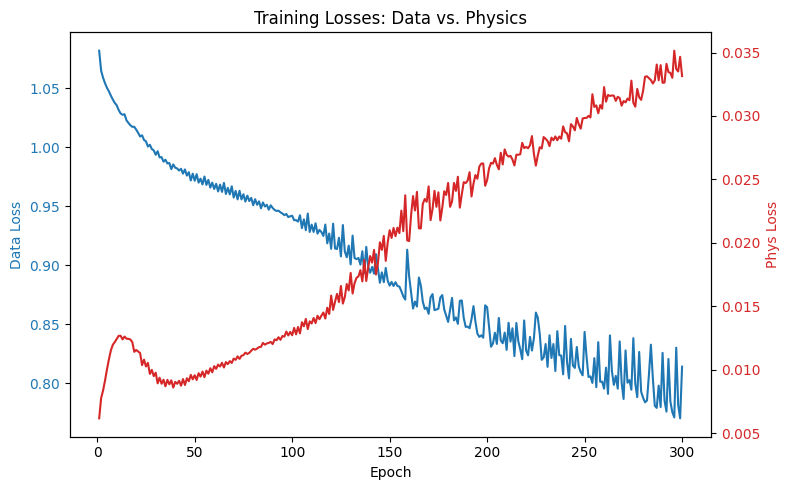

[Matplotlib] Overall Validation MSE: 3.3991


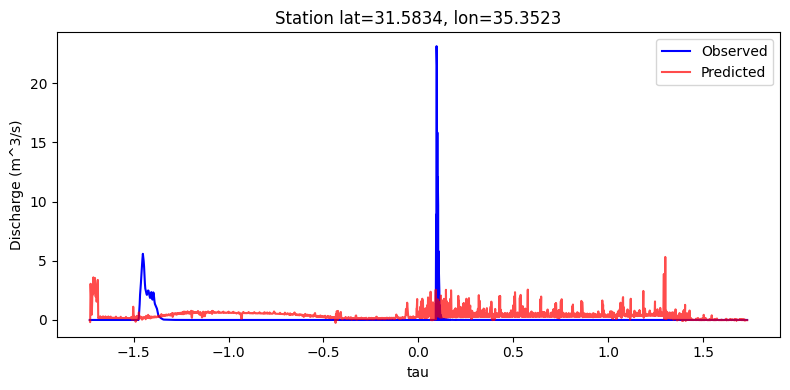

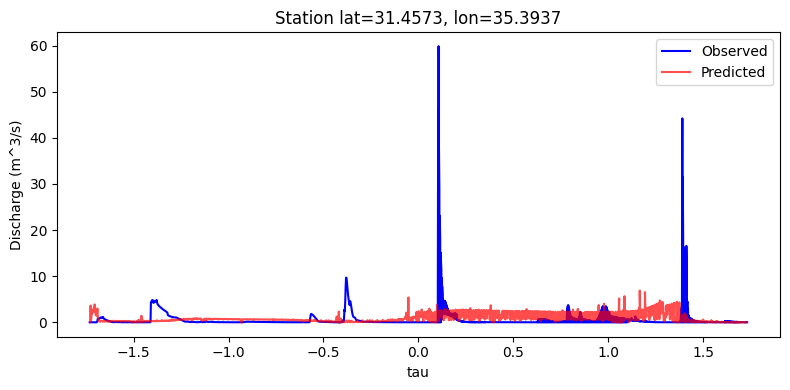

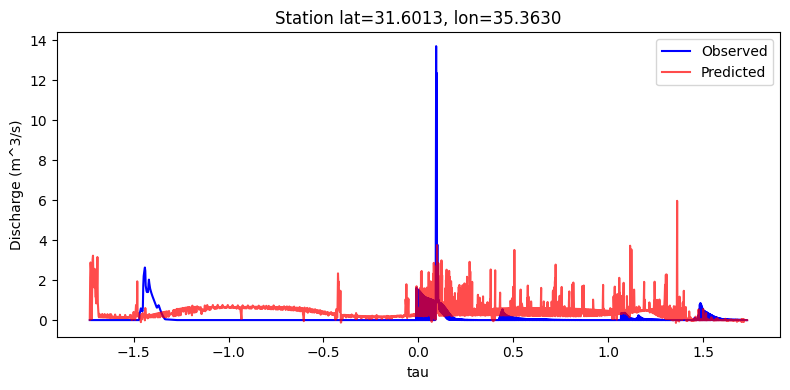

[Plotly] Overall Validation MSE: 3.3991


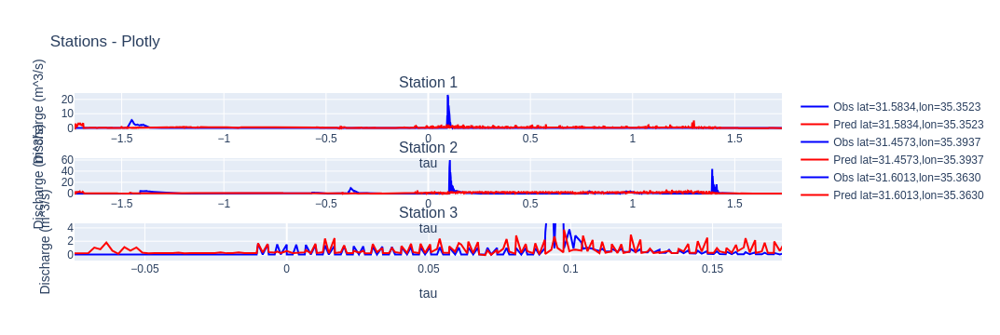

In [1]:
import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler

# For plotting
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

###############################################################################
# 1. Hyperparameters & File Paths
###############################################################################
DATA_DIR = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/merged/nov2apr/event_base_dfs/remapping time dfs/DEEP_RESEARCH/"

csv_files = [
    "Merged_North_Dead_Sea_2012_remapped.csv",
    "Merged_North_Dead_Sea_2013_remapped.csv",
    "Merged_North_Dead_Sea_2014_remapped.csv",
    "Merged_North_Dead_Sea_2015_remapped.csv",
    "Merged_North_Dead_Sea_2016_remapped.csv",
    "Merged_North_Dead_Sea_2018_remapped.csv",
    "Merged_North_Dead_Sea_2019_remapped.csv",
    "Merged_North_Dead_Sea_2020_remapped.csv",
]

# LSTM + infiltration PDE
HIDDEN_SIZE = 128
NUM_LAYERS = 2
DROPOUT = 0.2

BATCH_SIZE = 32
EPOCHS = 300             # increased from 120
LR = 1e-4

# Weighted MSE emphasis on big flows
BETA_WEIGHT = 15.0
GLOBAL_QMAX = 60.0

# Slightly increased lambda_phys
LAMBDA_DATA = 1.0     
LAMBDA_PHYS = 0.8    # was 0.2 before, now a small increase

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

###############################################################################
# 2. Data Loading & Merge (No Filtering)
###############################################################################
def load_and_merge_data(data_dir, file_list):
    merged = []
    for fname in file_list:
        fpath = os.path.join(data_dir, fname)
        if not os.path.exists(fpath):
            print(f"[WARNING] Missing: {fpath}")
            continue
        df = pd.read_csv(fpath)
        # Keep station pixels (where rg_qms not NaN)
        df = df[~df["rg_qms"].isna()].copy()
        # Sort by tau
        df.sort_values("tau", ascending=True, inplace=True)
        merged.append(df)
    if not merged:
        raise ValueError("No valid CSV files found. Check paths.")
    
    df_merged = pd.concat(merged, ignore_index=True)
    return df_merged

###############################################################################
# 3. Normalize Features
###############################################################################
def normalize_features(df):
    feat_cols = ["rainrate", "elevation", "slope_calculated", "tau"]
    scaler = StandardScaler()
    df[feat_cols] = scaler.fit_transform(df[feat_cols])
    return df, scaler

###############################################################################
# 4. Make Sequences + Keep lat/lon
###############################################################################
def make_sequences(df, seq_len=6):
    """
    We'll keep lat/lon so we know which station each row belongs to.
    That means each 'sample' also needs the lat/lon of the *final* step 
    for plotting station-based results.
    """
    feature_cols = ["rainrate", "elevation", "slope_calculated", "tau"]
    feats = df[feature_cols].values.astype(np.float32)
    
    discharge = df["rg_qms"].values.astype(np.float32)
    log_q = np.log1p(discharge)
    tau_vals = df["tau"].values.astype(np.float32)
    
    lat_vals = df["latitude"].values.astype(np.float32)
    lon_vals = df["longitude"].values.astype(np.float32)
    
    X_list, y_list = [], []
    tau_list, lat_list, lon_list = [], [], []
    N = len(df)
    for i in range(N - seq_len):
        X_list.append(feats[i : i+seq_len])
        y_list.append(log_q[i + seq_len])
        tau_list.append(tau_vals[i + seq_len])
        lat_list.append(lat_vals[i + seq_len])
        lon_list.append(lon_vals[i + seq_len])
    
    X_all = np.array(X_list, dtype=np.float32)
    y_all = np.array(y_list, dtype=np.float32).reshape(-1,1)
    tau_all= np.array(tau_list, dtype=np.float32).reshape(-1,1)
    lat_all= np.array(lat_list, dtype=np.float32).reshape(-1,1)
    lon_all= np.array(lon_list, dtype=np.float32).reshape(-1,1)
    
    return X_all, y_all, tau_all, lat_all, lon_all

class DischargeDataset(Dataset):
    def __init__(self, X, y, tau, lat, lon):
        super().__init__()
        self.X = X
        self.y = y
        self.tau = tau
        self.lat = lat
        self.lon = lon
    def __len__(self):
        return len(self.X)
    def __getitem__(self, idx):
        return self.X[idx], self.y[idx], self.tau[idx], self.lat[idx], self.lon[idx]

###############################################################################
# 5. LSTM + Infiltration PDE
###############################################################################
class LSTMInfiltrationReLU(nn.Module):
    def __init__(self, input_size=4, hidden_size=128, num_layers=2, dropout=0.2):
        super().__init__()
        self.lstm = nn.LSTM(input_size, hidden_size,
                            num_layers=num_layers,
                            batch_first=True,
                            dropout=dropout)
        self.fc = nn.Linear(hidden_size, 1)  # outputs log(Q)
        
        self.alpha = nn.Parameter(torch.tensor(0.01, dtype=torch.float32))
        self.i0     = nn.Parameter(torch.tensor(0.1, dtype=torch.float32))
        self.iSlope = nn.Parameter(torch.tensor(0.0, dtype=torch.float32))
        self.iElev  = nn.Parameter(torch.tensor(0.0, dtype=torch.float32))
        
        self.relu = nn.ReLU()
    
    def forward(self, x):
        lstm_out, (h_n, c_n) = self.lstm(x)
        out = lstm_out[:, -1, :]
        log_q_pred = self.fc(out)
        return log_q_pred
    
    def infiltration_fn(self, slope, elev):
        raw_infil = self.i0 + self.iSlope*slope + self.iElev*elev
        return self.relu(raw_infil)

###############################################################################
# 6. Weighted MSE
###############################################################################
def weighted_mse_loss(log_q_pred, log_q_true, beta=15.0, global_qmax=60.0):
    Q_true = torch.expm1(log_q_true)
    w = 1.0 + beta*(Q_true / global_qmax)
    diff = (log_q_pred - log_q_true)**2
    return torch.mean(w * diff)

###############################################################################
# 7. Training Loop
###############################################################################
def train_model(
    model, train_loader, optimizer, 
    num_epochs=150, lambda_data=1.0, lambda_phys=0.25,
    beta_weight=15.0, global_qmax=60.0
):
    data_losses = []
    phys_losses = []
    
    for epoch in range(num_epochs):
        model.train()
        epoch_data_loss = 0.0
        epoch_phys_loss = 0.0
        n_batches = 0
        
        for X_batch, y_log_batch, _, _, _ in train_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            optimizer.zero_grad()
            
            # (A) Data Loss
            log_q_pred = model(X_batch)
            data_loss_val = weighted_mse_loss(
                log_q_pred, y_log_batch,
                beta=beta_weight, global_qmax=global_qmax
            ) * lambda_data
            
            # (B) PDE infiltration
            Q_preds = []
            hidden = None
            seq_len = X_batch.size(1)
            for t_idx in range(seq_len):
                x_t = X_batch[:, t_idx, :].unsqueeze(1)
                if hidden is None:
                    lstm_out, hidden = model.lstm(x_t)
                else:
                    lstm_out, hidden = model.lstm(x_t, hidden)
                
                log_q_t = model.fc(lstm_out[:, -1, :])
                Q_t = torch.expm1(log_q_t)
                Q_preds.append(Q_t)
            
            penalty = 0.0
            alpha = model.alpha
            for t_idx in range(seq_len-1):
                Q_t  = Q_preds[t_idx]
                Q_t1 = Q_preds[t_idx+1]
                
                # parse features
                rain_t  = X_batch[:, t_idx, 0].unsqueeze(1)
                elev_t  = X_batch[:, t_idx, 1].unsqueeze(1)
                slope_t = X_batch[:, t_idx, 2].unsqueeze(1)
                
                infil_val = model.infiltration_fn(slope_t, elev_t)
                eff_rain  = torch.clamp(rain_t - infil_val, min=0.0)
                
                diff = Q_t1 - Q_t - alpha*eff_rain
                penalty += torch.mean(diff**2)
            
            if seq_len > 1:
                penalty = penalty / (seq_len-1)
            
            phys_loss = penalty * lambda_phys
            
            total_loss = data_loss_val + phys_loss
            total_loss.backward()
            optimizer.step()
            
            epoch_data_loss += data_loss_val.item() / max(lambda_data,1e-9)
            epoch_phys_loss += penalty.item()
            n_batches += 1
        
        if n_batches > 0:
            data_losses.append(epoch_data_loss / n_batches)
            phys_losses.append(epoch_phys_loss / n_batches)
        
        print(f"Epoch [{epoch+1}/{num_epochs}] - "
              f"DataLoss: {data_losses[-1]:.4f}, PhysLoss: {phys_losses[-1]:.4f}")
    
    return data_losses, phys_losses

###############################################################################
# 8. Plot Losses (Matplotlib), Evaluate Per Station, Plot Interactive (Plotly)
###############################################################################
def plot_training_losses(data_losses, phys_losses):
    epochs = range(1, len(data_losses)+1)
    
    fig, ax1 = plt.subplots(figsize=(8,5))
    
    color_data = 'tab:blue'
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Data Loss", color=color_data)
    ax1.plot(epochs, data_losses, color=color_data)
    ax1.tick_params(axis='y', labelcolor=color_data)
    
    ax2 = ax1.twinx()
    color_phys = 'tab:red'
    ax2.set_ylabel("Phys Loss", color=color_phys)
    ax2.plot(epochs, phys_losses, color=color_phys)
    ax2.tick_params(axis='y', labelcolor=color_phys)
    
    plt.title("Training Losses: Data vs. Physics")
    plt.tight_layout()
    plt.show()

def evaluate_per_station_matplotlib(model, val_loader):
    """
    Evaluate predictions, then separate them by lat/lon station
    and plot each station with Matplotlib.
    """
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in val_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true = torch.expm1(y_log_batch).cpu().numpy().flatten()
            tau_np = tau_batch.cpu().numpy().flatten()
            lat_np = lat_batch.numpy().flatten()
            lon_np = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    # Concatenate
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Matplotlib] Overall Validation MSE: {val_mse:.4f}")
    
    # Identify unique stations by lat/lon
    station_coords = {}
    for (lat, lon) in zip(all_lat, all_lon):
        station_coords[(lat, lon)] = True
    unique_stations = list(station_coords.keys())
    
    # For each station, filter data + plot
    for st in unique_stations:
        lat_st, lon_st = st
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        
        tau_st = all_tau[mask]
        obs_st = all_truth[mask]
        pred_st= all_preds[mask]
        
        # Sort by tau if needed
        idx_sort = np.argsort(tau_st)
        tau_st = tau_st[idx_sort]
        obs_st = obs_st[idx_sort]
        pred_st= pred_st[idx_sort]
        
        # Plot
        plt.figure(figsize=(8,4))
        plt.plot(tau_st, obs_st, label='Observed', color='blue')
        plt.plot(tau_st, pred_st, label='Predicted', color='red', alpha=0.7)
        plt.xlabel("tau")
        plt.ylabel("Discharge (m^3/s)")
        plt.title(f"Station lat={lat_st:.4f}, lon={lon_st:.4f}")
        plt.legend()
        plt.tight_layout()
        plt.show()

def evaluate_per_station_plotly(model, val_loader, title="Stations - Plotly"):
    """
    Similar approach, but build a multi-subplot Plotly figure 
    with one subplot per station.
    """
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in val_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true = torch.expm1(y_log_batch).cpu().numpy().flatten()
            tau_np = tau_batch.cpu().numpy().flatten()
            lat_np = lat_batch.numpy().flatten()
            lon_np = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Plotly] Overall Validation MSE: {val_mse:.4f}")
    
    # Identify unique stations
    stations_map = {}
    for (lat, lon) in zip(all_lat, all_lon):
        stations_map[(lat, lon)] = True
    unique_stations = list(stations_map.keys())
    n_stations = len(unique_stations)
    
    # Make a subplot with #rows = #stations (1 column for simplicity)
    fig = make_subplots(rows=n_stations, cols=1, 
                        subplot_titles=[f"Station {i+1}" for i in range(n_stations)])
    
    row_idx = 1
    for st in unique_stations:
        lat_st, lon_st = st
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        
        tau_st = all_tau[mask]
        obs_st = all_truth[mask]
        pred_st= all_preds[mask]
        
        # Sort by tau for nice plotting
        idx_sort = np.argsort(tau_st)
        tau_st = tau_st[idx_sort]
        obs_st = obs_st[idx_sort]
        pred_st= pred_st[idx_sort]
        
        fig.add_trace(
            go.Scatter(x=tau_st, y=obs_st, mode='lines', name=f"Obs lat={lat_st:.4f},lon={lon_st:.4f}",
                       line=dict(color='blue')),
            row=row_idx, col=1
        )
        fig.add_trace(
            go.Scatter(x=tau_st, y=pred_st, mode='lines', name=f"Pred lat={lat_st:.4f},lon={lon_st:.4f}",
                       line=dict(color='red')),
            row=row_idx, col=1
        )
        
        row_idx += 1
    
    fig.update_layout(
        title=title,
        hovermode='x',
        showlegend=True,
        height=300*n_stations,  # to give each subplot decent vertical space
    )
    fig.update_xaxes(title_text='tau')
    fig.update_yaxes(title_text='Discharge (m^3/s)')
    
    fig.show()


###############################################################################
# 9. Main
###############################################################################
def main():
    # 1) Load & Merge
    df_all = load_and_merge_data(DATA_DIR, csv_files)
    print("Loaded shape:", df_all.shape)
    
    # 2) Normalize
    df_norm, scaler = normalize_features(df_all)
    
    # 3) Sequences
    X_all, y_all, tau_all, lat_all, lon_all = make_sequences(df_norm, seq_len=6)
    print("X_all:", X_all.shape, "y_all:", y_all.shape)
    
    # 4) Train/Val Split
    N = len(X_all)
    split_idx = int(0.8 * N)
    
    X_train, y_train   = X_all[:split_idx], y_all[:split_idx]
    tau_train, lat_train, lon_train = tau_all[:split_idx], lat_all[:split_idx], lon_all[:split_idx]
    
    X_val,   y_val     = X_all[split_idx:], y_all[split_idx:]
    tau_val, lat_val, lon_val = tau_all[split_idx:], lat_all[split_idx:], lon_all[split_idx:]
    
    train_ds = DischargeDataset(X_train, y_train, tau_train, lat_train, lon_train)
    val_ds   = DischargeDataset(X_val,   y_val,   tau_val,   lat_val,   lon_val)
    
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=False)
    val_loader   = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False)
    
    # 5) Model
    model = LSTMInfiltrationReLU(
        input_size=4,
        hidden_size=HIDDEN_SIZE,
        num_layers=NUM_LAYERS,
        dropout=DROPOUT
    ).to(device)
    
    optimizer = torch.optim.Adam(model.parameters(), lr=LR)
    
    # 6) Train
    print("\n=== Training for 150 epochs, λ_phys=0.25, BETA_WEIGHT=15, hidden_size=128 ===")
    data_losses, phys_losses = train_model(
        model=model,
        train_loader=train_loader,
        optimizer=optimizer,
        num_epochs=EPOCHS,
        lambda_data=LAMBDA_DATA,
        lambda_phys=LAMBDA_PHYS,
        beta_weight=BETA_WEIGHT,
        global_qmax=GLOBAL_QMAX
    )
    
    # 7) Plot Training Losses (Matplotlib)
    plot_training_losses(data_losses, phys_losses)
    
    # 8) Evaluate per station in Matplotlib
    evaluate_per_station_matplotlib(model, val_loader)
    
    # 9) Evaluate per station in Plotly (interactive)
    evaluate_per_station_plotly(model, val_loader, title="Stations - Plotly")

if __name__ == "__main__":
    main()


Using device: cuda
Loaded shape: (32301, 7)
X_all: (32295, 6, 4) y_all: (32295, 1)

=== Training for 150 epochs, λ_phys=0.25, BETA_WEIGHT=15, hidden_size=128 ===
Epoch [1/1000] - DataLoss: 1.0940, PhysLoss: 0.0088
Epoch [2/1000] - DataLoss: 1.0707, PhysLoss: 0.0102
Epoch [3/1000] - DataLoss: 1.0643, PhysLoss: 0.0107
Epoch [4/1000] - DataLoss: 1.0593, PhysLoss: 0.0115
Epoch [5/1000] - DataLoss: 1.0545, PhysLoss: 0.0124
Epoch [6/1000] - DataLoss: 1.0505, PhysLoss: 0.0133
Epoch [7/1000] - DataLoss: 1.0459, PhysLoss: 0.0141
Epoch [8/1000] - DataLoss: 1.0427, PhysLoss: 0.0145
Epoch [9/1000] - DataLoss: 1.0402, PhysLoss: 0.0148
Epoch [10/1000] - DataLoss: 1.0364, PhysLoss: 0.0150
Epoch [11/1000] - DataLoss: 1.0330, PhysLoss: 0.0151
Epoch [12/1000] - DataLoss: 1.0310, PhysLoss: 0.0151
Epoch [13/1000] - DataLoss: 1.0287, PhysLoss: 0.0153
Epoch [14/1000] - DataLoss: 1.0257, PhysLoss: 0.0153
Epoch [15/1000] - DataLoss: 1.0251, PhysLoss: 0.0150
Epoch [16/1000] - DataLoss: 1.0224, PhysLoss: 0.0147

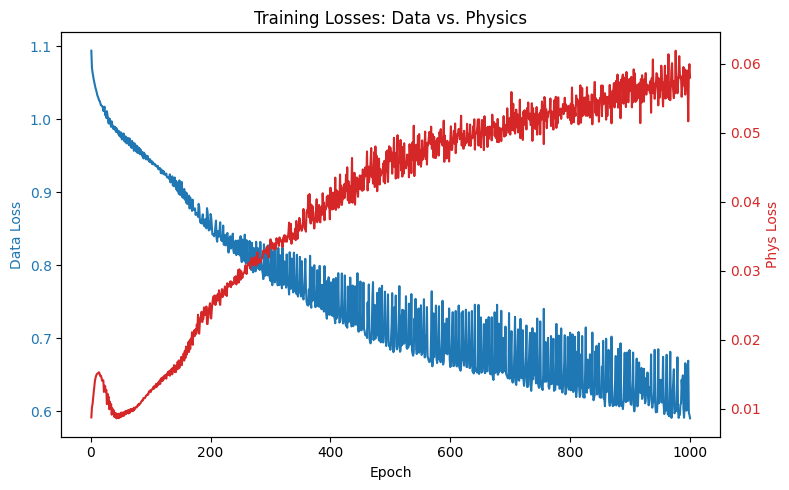

[Matplotlib] Overall Validation MSE: 4.0175


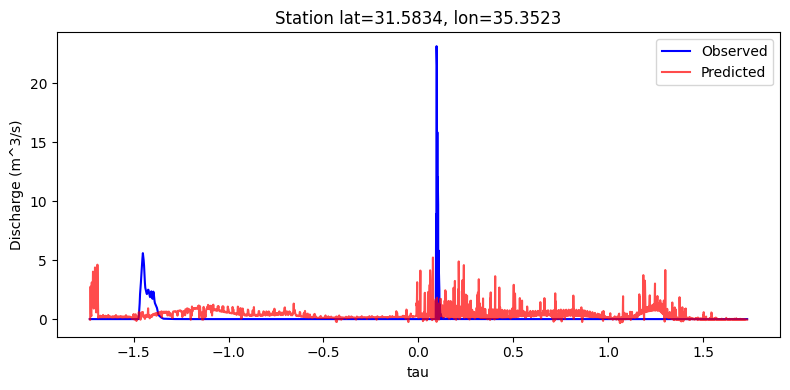

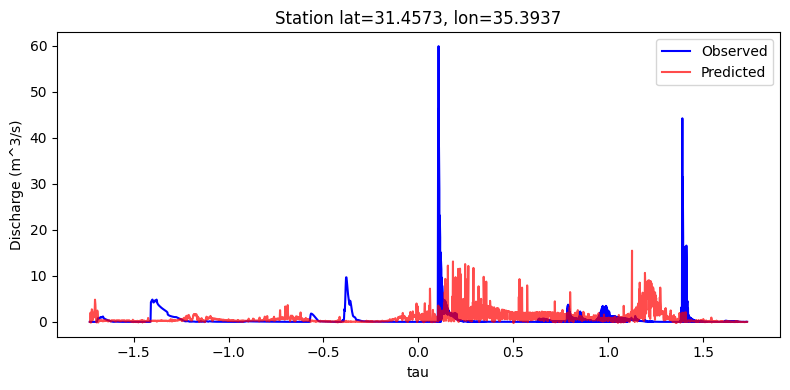

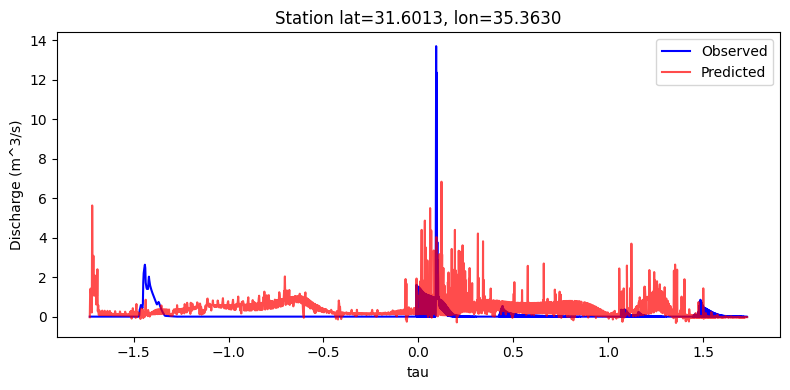

[Plotly] Overall Validation MSE: 4.0175


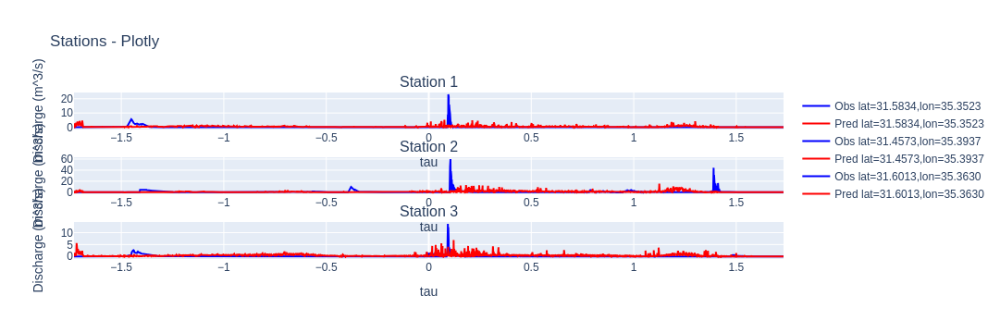

In [2]:
import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler

# For plotting
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

###############################################################################
# 1. Hyperparameters & File Paths
###############################################################################
DATA_DIR = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/merged/nov2apr/event_base_dfs/remapping time dfs/DEEP_RESEARCH/"

csv_files = [
    "Merged_North_Dead_Sea_2012_remapped.csv",
    "Merged_North_Dead_Sea_2013_remapped.csv",
    "Merged_North_Dead_Sea_2014_remapped.csv",
    "Merged_North_Dead_Sea_2015_remapped.csv",
    "Merged_North_Dead_Sea_2016_remapped.csv",
    "Merged_North_Dead_Sea_2018_remapped.csv",
    "Merged_North_Dead_Sea_2019_remapped.csv",
    "Merged_North_Dead_Sea_2020_remapped.csv",
]

# LSTM + infiltration PDE
HIDDEN_SIZE = 128
NUM_LAYERS = 2
DROPOUT = 0.2

BATCH_SIZE = 32
EPOCHS = 120            
LR = 1e-4

# Weighted MSE emphasis on big flows
BETA_WEIGHT = 15.0
GLOBAL_QMAX = 60.0

# Slightly increased lambda_phys
LAMBDA_DATA = 1.0     
LAMBDA_PHYS = 0.8    # was 0.2 before, now a small increase

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

###############################################################################
# 2. Data Loading & Merge (No Filtering)
###############################################################################
def load_and_merge_data(data_dir, file_list):
    merged = []
    for fname in file_list:
        fpath = os.path.join(data_dir, fname)
        if not os.path.exists(fpath):
            print(f"[WARNING] Missing: {fpath}")
            continue
        df = pd.read_csv(fpath)
        # Keep station pixels (where rg_qms not NaN)
        df = df[~df["rg_qms"].isna()].copy()
        # Sort by tau
        df.sort_values("tau", ascending=True, inplace=True)
        merged.append(df)
    if not merged:
        raise ValueError("No valid CSV files found. Check paths.")
    
    df_merged = pd.concat(merged, ignore_index=True)
    return df_merged

###############################################################################
# 3. Normalize Features
###############################################################################
def normalize_features(df):
    feat_cols = ["rainrate", "elevation", "slope_calculated", "tau"]
    scaler = StandardScaler()
    df[feat_cols] = scaler.fit_transform(df[feat_cols])
    return df, scaler

###############################################################################
# 4. Make Sequences + Keep lat/lon
###############################################################################
def make_sequences(df, seq_len=6):
    """
    We'll keep lat/lon so we know which station each row belongs to.
    That means each 'sample' also needs the lat/lon of the *final* step 
    for plotting station-based results.
    """
    feature_cols = ["rainrate", "elevation", "slope_calculated", "tau"]
    feats = df[feature_cols].values.astype(np.float32)
    
    discharge = df["rg_qms"].values.astype(np.float32)
    log_q = np.log1p(discharge)
    tau_vals = df["tau"].values.astype(np.float32)
    
    lat_vals = df["latitude"].values.astype(np.float32)
    lon_vals = df["longitude"].values.astype(np.float32)
    
    X_list, y_list = [], []
    tau_list, lat_list, lon_list = [], [], []
    N = len(df)
    for i in range(N - seq_len):
        X_list.append(feats[i : i+seq_len])
        y_list.append(log_q[i + seq_len])
        tau_list.append(tau_vals[i + seq_len])
        lat_list.append(lat_vals[i + seq_len])
        lon_list.append(lon_vals[i + seq_len])
    
    X_all = np.array(X_list, dtype=np.float32)
    y_all = np.array(y_list, dtype=np.float32).reshape(-1,1)
    tau_all= np.array(tau_list, dtype=np.float32).reshape(-1,1)
    lat_all= np.array(lat_list, dtype=np.float32).reshape(-1,1)
    lon_all= np.array(lon_list, dtype=np.float32).reshape(-1,1)
    
    return X_all, y_all, tau_all, lat_all, lon_all

class DischargeDataset(Dataset):
    def __init__(self, X, y, tau, lat, lon):
        super().__init__()
        self.X = X
        self.y = y
        self.tau = tau
        self.lat = lat
        self.lon = lon
    def __len__(self):
        return len(self.X)
    def __getitem__(self, idx):
        return self.X[idx], self.y[idx], self.tau[idx], self.lat[idx], self.lon[idx]

###############################################################################
# 5. LSTM + Infiltration PDE
###############################################################################
class LSTMInfiltrationReLU(nn.Module):
    def __init__(self, input_size=4, hidden_size=128, num_layers=2, dropout=0.2):
        super().__init__()
        self.lstm = nn.LSTM(input_size, hidden_size,
                            num_layers=num_layers,
                            batch_first=True,
                            dropout=dropout)
        self.fc = nn.Linear(hidden_size, 1)  # outputs log(Q)
        
        self.alpha = nn.Parameter(torch.tensor(0.01, dtype=torch.float32))
        self.i0     = nn.Parameter(torch.tensor(0.1, dtype=torch.float32))
        self.iSlope = nn.Parameter(torch.tensor(0.0, dtype=torch.float32))
        self.iElev  = nn.Parameter(torch.tensor(0.0, dtype=torch.float32))
        
        self.relu = nn.ReLU()
    
    def forward(self, x):
        lstm_out, (h_n, c_n) = self.lstm(x)
        out = lstm_out[:, -1, :]
        log_q_pred = self.fc(out)
        return log_q_pred
    
    def infiltration_fn(self, slope, elev):
        raw_infil = self.i0 + self.iSlope*slope + self.iElev*elev
        return self.relu(raw_infil)

###############################################################################
# 6. Weighted MSE
###############################################################################
def weighted_mse_loss(log_q_pred, log_q_true, beta=15.0, global_qmax=60.0):
    Q_true = torch.expm1(log_q_true)
    w = 1.0 + beta*(Q_true / global_qmax)
    diff = (log_q_pred - log_q_true)**2
    return torch.mean(w * diff)

###############################################################################
# 7. Training Loop
###############################################################################
def train_model(
    model, train_loader, optimizer, 
    num_epochs=150, lambda_data=1.0, lambda_phys=0.25,
    beta_weight=15.0, global_qmax=60.0
):
    data_losses = []
    phys_losses = []
    
    for epoch in range(num_epochs):
        model.train()
        epoch_data_loss = 0.0
        epoch_phys_loss = 0.0
        n_batches = 0
        
        for X_batch, y_log_batch, _, _, _ in train_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            optimizer.zero_grad()
            
            # (A) Data Loss
            log_q_pred = model(X_batch)
            data_loss_val = weighted_mse_loss(
                log_q_pred, y_log_batch,
                beta=beta_weight, global_qmax=global_qmax
            ) * lambda_data
            
            # (B) PDE infiltration
            Q_preds = []
            hidden = None
            seq_len = X_batch.size(1)
            for t_idx in range(seq_len):
                x_t = X_batch[:, t_idx, :].unsqueeze(1)
                if hidden is None:
                    lstm_out, hidden = model.lstm(x_t)
                else:
                    lstm_out, hidden = model.lstm(x_t, hidden)
                
                log_q_t = model.fc(lstm_out[:, -1, :])
                Q_t = torch.expm1(log_q_t)
                Q_preds.append(Q_t)
            
            penalty = 0.0
            alpha = model.alpha
            for t_idx in range(seq_len-1):
                Q_t  = Q_preds[t_idx]
                Q_t1 = Q_preds[t_idx+1]
                
                # parse features
                rain_t  = X_batch[:, t_idx, 0].unsqueeze(1)
                elev_t  = X_batch[:, t_idx, 1].unsqueeze(1)
                slope_t = X_batch[:, t_idx, 2].unsqueeze(1)
                
                infil_val = model.infiltration_fn(slope_t, elev_t)
                eff_rain  = torch.clamp(rain_t - infil_val, min=0.0)
                
                diff = Q_t1 - Q_t - alpha*eff_rain
                penalty += torch.mean(diff**2)
            
            if seq_len > 1:
                penalty = penalty / (seq_len-1)
            
            phys_loss = penalty * lambda_phys
            
            total_loss = data_loss_val + phys_loss
            total_loss.backward()
            optimizer.step()
            
            epoch_data_loss += data_loss_val.item() / max(lambda_data,1e-9)
            epoch_phys_loss += penalty.item()
            n_batches += 1
        
        if n_batches > 0:
            data_losses.append(epoch_data_loss / n_batches)
            phys_losses.append(epoch_phys_loss / n_batches)
        
        print(f"Epoch [{epoch+1}/{num_epochs}] - "
              f"DataLoss: {data_losses[-1]:.4f}, PhysLoss: {phys_losses[-1]:.4f}")
    
    return data_losses, phys_losses

###############################################################################
# 8. Plot Losses (Matplotlib), Evaluate Per Station, Plot Interactive (Plotly)
###############################################################################
def plot_training_losses(data_losses, phys_losses):
    epochs = range(1, len(data_losses)+1)
    
    fig, ax1 = plt.subplots(figsize=(8,5))
    
    color_data = 'tab:blue'
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Data Loss", color=color_data)
    ax1.plot(epochs, data_losses, color=color_data)
    ax1.tick_params(axis='y', labelcolor=color_data)
    
    ax2 = ax1.twinx()
    color_phys = 'tab:red'
    ax2.set_ylabel("Phys Loss", color=color_phys)
    ax2.plot(epochs, phys_losses, color=color_phys)
    ax2.tick_params(axis='y', labelcolor=color_phys)
    
    plt.title("Training Losses: Data vs. Physics")
    plt.tight_layout()
    plt.show()

def evaluate_per_station_matplotlib(model, val_loader):
    """
    Evaluate predictions, then separate them by lat/lon station
    and plot each station with Matplotlib.
    """
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in val_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true = torch.expm1(y_log_batch).cpu().numpy().flatten()
            tau_np = tau_batch.cpu().numpy().flatten()
            lat_np = lat_batch.numpy().flatten()
            lon_np = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    # Concatenate
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Matplotlib] Overall Validation MSE: {val_mse:.4f}")
    
    # Identify unique stations by lat/lon
    station_coords = {}
    for (lat, lon) in zip(all_lat, all_lon):
        station_coords[(lat, lon)] = True
    unique_stations = list(station_coords.keys())
    
    # For each station, filter data + plot
    for st in unique_stations:
        lat_st, lon_st = st
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        
        tau_st = all_tau[mask]
        obs_st = all_truth[mask]
        pred_st= all_preds[mask]
        
        # Sort by tau if needed
        idx_sort = np.argsort(tau_st)
        tau_st = tau_st[idx_sort]
        obs_st = obs_st[idx_sort]
        pred_st= pred_st[idx_sort]
        
        # Plot
        plt.figure(figsize=(8,4))
        plt.plot(tau_st, obs_st, label='Observed', color='blue')
        plt.plot(tau_st, pred_st, label='Predicted', color='red', alpha=0.7)
        plt.xlabel("tau")
        plt.ylabel("Discharge (m^3/s)")
        plt.title(f"Station lat={lat_st:.4f}, lon={lon_st:.4f}")
        plt.legend()
        plt.tight_layout()
        plt.show()

def evaluate_per_station_plotly(model, val_loader, title="Stations - Plotly"):
    """
    Similar approach, but build a multi-subplot Plotly figure 
    with one subplot per station.
    """
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in val_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true = torch.expm1(y_log_batch).cpu().numpy().flatten()
            tau_np = tau_batch.cpu().numpy().flatten()
            lat_np = lat_batch.numpy().flatten()
            lon_np = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Plotly] Overall Validation MSE: {val_mse:.4f}")
    
    # Identify unique stations
    stations_map = {}
    for (lat, lon) in zip(all_lat, all_lon):
        stations_map[(lat, lon)] = True
    unique_stations = list(stations_map.keys())
    n_stations = len(unique_stations)
    
    # Make a subplot with #rows = #stations (1 column for simplicity)
    fig = make_subplots(rows=n_stations, cols=1, 
                        subplot_titles=[f"Station {i+1}" for i in range(n_stations)])
    
    row_idx = 1
    for st in unique_stations:
        lat_st, lon_st = st
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        
        tau_st = all_tau[mask]
        obs_st = all_truth[mask]
        pred_st= all_preds[mask]
        
        # Sort by tau for nice plotting
        idx_sort = np.argsort(tau_st)
        tau_st = tau_st[idx_sort]
        obs_st = obs_st[idx_sort]
        pred_st= pred_st[idx_sort]
        
        fig.add_trace(
            go.Scatter(x=tau_st, y=obs_st, mode='lines', name=f"Obs lat={lat_st:.4f},lon={lon_st:.4f}",
                       line=dict(color='blue')),
            row=row_idx, col=1
        )
        fig.add_trace(
            go.Scatter(x=tau_st, y=pred_st, mode='lines', name=f"Pred lat={lat_st:.4f},lon={lon_st:.4f}",
                       line=dict(color='red')),
            row=row_idx, col=1
        )
        
        row_idx += 1
    
    fig.update_layout(
        title=title,
        hovermode='x',
        showlegend=True,
        height=300*n_stations,  # to give each subplot decent vertical space
    )
    fig.update_xaxes(title_text='tau')
    fig.update_yaxes(title_text='Discharge (m^3/s)')
    
    fig.show()


###############################################################################
# 9. Main
###############################################################################
def main():
    # 1) Load & Merge
    df_all = load_and_merge_data(DATA_DIR, csv_files)
    print("Loaded shape:", df_all.shape)
    
    # 2) Normalize
    df_norm, scaler = normalize_features(df_all)
    
    # 3) Sequences
    X_all, y_all, tau_all, lat_all, lon_all = make_sequences(df_norm, seq_len=6)
    print("X_all:", X_all.shape, "y_all:", y_all.shape)
    
    # 4) Train/Val Split
    N = len(X_all)
    split_idx = int(0.8 * N)
    
    X_train, y_train   = X_all[:split_idx], y_all[:split_idx]
    tau_train, lat_train, lon_train = tau_all[:split_idx], lat_all[:split_idx], lon_all[:split_idx]
    
    X_val,   y_val     = X_all[split_idx:], y_all[split_idx:]
    tau_val, lat_val, lon_val = tau_all[split_idx:], lat_all[split_idx:], lon_all[split_idx:]
    
    train_ds = DischargeDataset(X_train, y_train, tau_train, lat_train, lon_train)
    val_ds   = DischargeDataset(X_val,   y_val,   tau_val,   lat_val,   lon_val)
    
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=False)
    val_loader   = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False)
    
    # 5) Model
    model = LSTMInfiltrationReLU(
        input_size=4,
        hidden_size=HIDDEN_SIZE,
        num_layers=NUM_LAYERS,
        dropout=DROPOUT
    ).to(device)
    
    optimizer = torch.optim.Adam(model.parameters(), lr=LR)
    
    # 6) Train
    print("\n=== Training for 150 epochs, λ_phys=0.25, BETA_WEIGHT=15, hidden_size=128 ===")
    data_losses, phys_losses = train_model(
        model=model,
        train_loader=train_loader,
        optimizer=optimizer,
        num_epochs=EPOCHS,
        lambda_data=LAMBDA_DATA,
        lambda_phys=LAMBDA_PHYS,
        beta_weight=BETA_WEIGHT,
        global_qmax=GLOBAL_QMAX
    )
    
    # 7) Plot Training Losses (Matplotlib)
    plot_training_losses(data_losses, phys_losses)
    
    # 8) Evaluate per station in Matplotlib
    evaluate_per_station_matplotlib(model, val_loader)
    
    # 9) Evaluate per station in Plotly (interactive)
    evaluate_per_station_plotly(model, val_loader, title="Stations - Plotly")

if __name__ == "__main__":
    main()


Using device: cuda
Loaded shape: (32301, 7)
X_all: (32295, 6, 4) y_all: (32295, 1)
Epoch [1/150] - TrainData: 1.0558, TrainPhys: 0.0145 - ValData: 0.5256, ValPhys: 0.0252
Epoch [2/150] - TrainData: 1.0090, TrainPhys: 0.0205 - ValData: 0.4740, ValPhys: 0.0231
Epoch [3/150] - TrainData: 0.9965, TrainPhys: 0.0279 - ValData: 0.4435, ValPhys: 0.0236
Epoch [4/150] - TrainData: 0.9848, TrainPhys: 0.0325 - ValData: 0.5058, ValPhys: 0.0450
Epoch [5/150] - TrainData: 0.9828, TrainPhys: 0.0346 - ValData: 0.5345, ValPhys: 0.0583
Epoch [6/150] - TrainData: 0.9758, TrainPhys: 0.0394 - ValData: 0.4973, ValPhys: 0.0489
Epoch [7/150] - TrainData: 0.9716, TrainPhys: 0.0418 - ValData: 0.4480, ValPhys: 0.0377
Epoch [8/150] - TrainData: 0.9643, TrainPhys: 0.0423 - ValData: 0.4803, ValPhys: 0.0514
Epoch [9/150] - TrainData: 0.9655, TrainPhys: 0.0451 - ValData: 0.4612, ValPhys: 0.0437
Epoch [10/150] - TrainData: 0.9624, TrainPhys: 0.0432 - ValData: 0.5744, ValPhys: 0.0902
Epoch [11/150] - TrainData: 0.9543, 

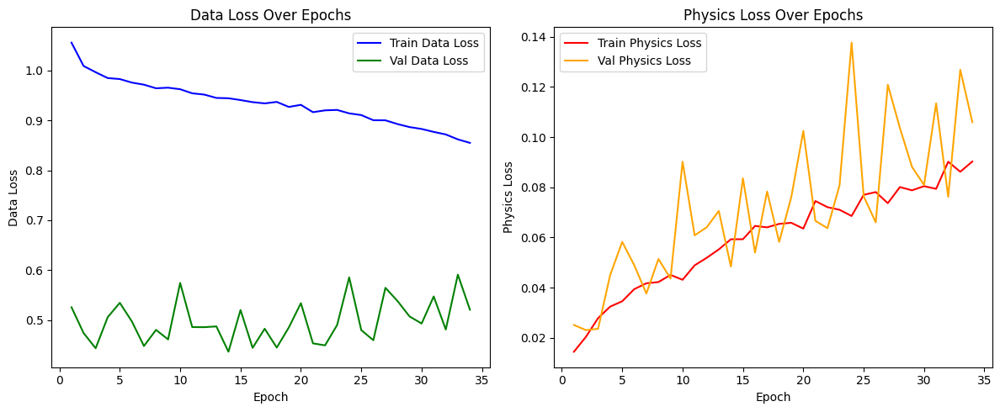

Loading best model from checkpoint...

[Validation Set Results - Matplotlib]
[Matplotlib] Overall Validation MSE: 2.9782


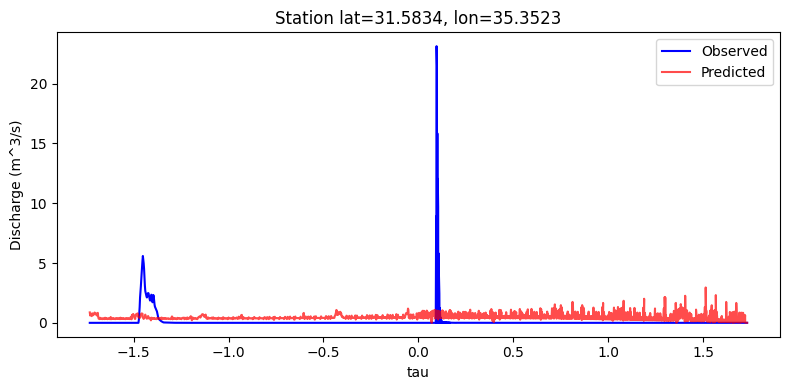

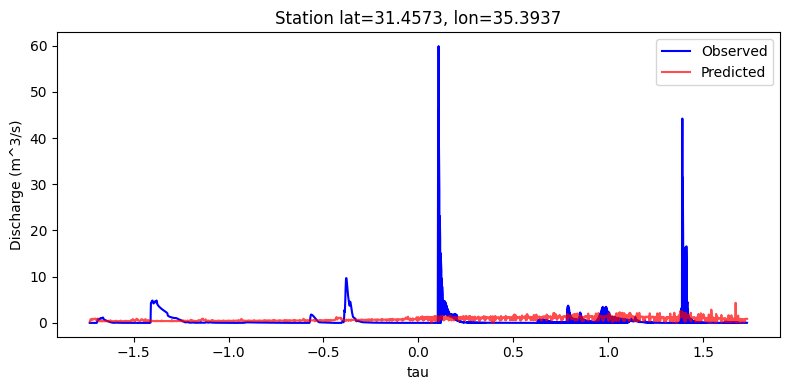

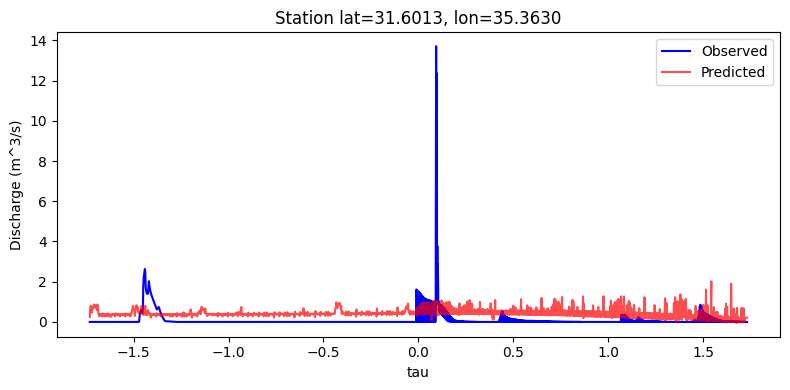


[Validation Set Results - Plotly]
[Plotly] Overall Validation MSE: 2.9782


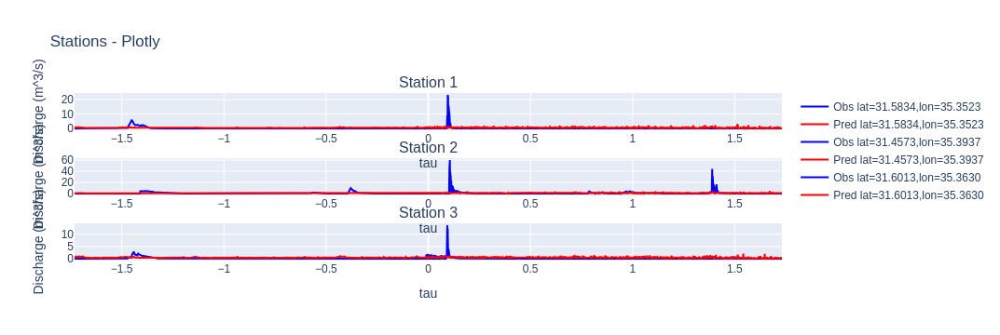

In [5]:
import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler

import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

###############################################################################
# 1. Hyperparameters & File Paths
###############################################################################
DATA_DIR = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/merged/nov2apr/event_base_dfs/remapping time dfs/DEEP_RESEARCH/"

csv_files = [
    "Merged_North_Dead_Sea_2012_remapped.csv",
    "Merged_North_Dead_Sea_2013_remapped.csv",
    "Merged_North_Dead_Sea_2014_remapped.csv",
    "Merged_North_Dead_Sea_2015_remapped.csv",
    "Merged_North_Dead_Sea_2016_remapped.csv",
    "Merged_North_Dead_Sea_2018_remapped.csv",
    "Merged_North_Dead_Sea_2019_remapped.csv",
    "Merged_North_Dead_Sea_2020_remapped.csv",
]

# LSTM + infiltration PDE
HIDDEN_SIZE = 128
NUM_LAYERS = 2
DROPOUT = 0.2

BATCH_SIZE = 32
EPOCHS = 150             # we allow up to 300 epochs
LR = 1e-4                # can be adjusted

# Weighted MSE emphasis on big flows
BETA_WEIGHT = 15.0
GLOBAL_QMAX = 60.0

# Increased lambda_phys -> stronger PDE penalty
LAMBDA_DATA = 1.0     
LAMBDA_PHYS = 0.2   

# Early Stopping Hyperparams
PATIENCE = 20   # if val data-loss doesn't improve for 20 epochs, stop
SAVE_BEST_MODEL = True
BEST_MODEL_PATH = "best_lstm_infil.pth"

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)


###############################################################################
# 2. Data Loading & Merge
###############################################################################
def load_and_merge_data(data_dir, file_list):
    merged = []
    for fname in file_list:
        fpath = os.path.join(data_dir, fname)
        if not os.path.exists(fpath):
            print(f"[WARNING] Missing: {fpath}")
            continue
        
        df = pd.read_csv(fpath)
        # Keep station pixels (where rg_qms not NaN)
        df = df[~df["rg_qms"].isna()].copy()
        # Sort by tau
        df.sort_values("tau", ascending=True, inplace=True)
        merged.append(df)
    if not merged:
        raise ValueError("No valid CSV files found. Check paths.")
    
    df_merged = pd.concat(merged, ignore_index=True)
    return df_merged

###############################################################################
# 3. Normalize Features
###############################################################################
def normalize_features(df):
    feat_cols = ["rainrate", "elevation", "slope_calculated", "tau"]
    scaler = StandardScaler()
    df[feat_cols] = scaler.fit_transform(df[feat_cols])
    return df, scaler

###############################################################################
# 4. Make Sequences + Keep lat/lon
###############################################################################
def make_sequences(df, seq_len=6):
    feature_cols = ["rainrate", "elevation", "slope_calculated", "tau"]
    feats = df[feature_cols].values.astype(np.float32)
    
    discharge = df["rg_qms"].values.astype(np.float32)
    log_q = np.log1p(discharge)  # log-transform for stable MSE
    tau_vals = df["tau"].values.astype(np.float32)
    
    lat_vals = df["latitude"].values.astype(np.float32)
    lon_vals = df["longitude"].values.astype(np.float32)
    
    X_list, y_list = [], []
    tau_list, lat_list, lon_list = [], [], []
    N = len(df)
    for i in range(N - seq_len):
        X_list.append(feats[i : i+seq_len])
        y_list.append(log_q[i + seq_len])
        tau_list.append(tau_vals[i + seq_len])
        lat_list.append(lat_vals[i + seq_len])
        lon_list.append(lon_vals[i + seq_len])
    
    X_all = np.array(X_list, dtype=np.float32)
    y_all = np.array(y_list, dtype=np.float32).reshape(-1,1)
    tau_all= np.array(tau_list, dtype=np.float32).reshape(-1,1)
    lat_all= np.array(lat_list, dtype=np.float32).reshape(-1,1)
    lon_all= np.array(lon_list, dtype=np.float32).reshape(-1,1)
    
    return X_all, y_all, tau_all, lat_all, lon_all

class DischargeDataset(Dataset):
    def __init__(self, X, y, tau, lat, lon):
        super().__init__()
        self.X = X
        self.y = y
        self.tau = tau
        self.lat = lat
        self.lon = lon
    def __len__(self):
        return len(self.X)
    def __getitem__(self, idx):
        return self.X[idx], self.y[idx], self.tau[idx], self.lat[idx], self.lon[idx]


###############################################################################
# 5. Model Definition (LSTM + infiltration PDE)
###############################################################################
class LSTMInfiltrationReLU(nn.Module):
    """
    Q(t+1)-Q(t) = alpha * max(rain - infiltration, 0)
    infiltration = ReLU(i0 + iSlope*slope + iElev*elev)
    """
    def __init__(self, input_size=4, hidden_size=128, num_layers=2, dropout=0.2):
        super().__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, 
                            num_layers=num_layers,
                            batch_first=True,
                            dropout=dropout)
        self.fc = nn.Linear(hidden_size, 1)  # outputs log(Q)
        
        self.alpha = nn.Parameter(torch.tensor(0.01, dtype=torch.float32))
        self.i0     = nn.Parameter(torch.tensor(0.1, dtype=torch.float32))
        self.iSlope = nn.Parameter(torch.tensor(0.0, dtype=torch.float32))
        self.iElev  = nn.Parameter(torch.tensor(0.0, dtype=torch.float32))
        
        self.relu = nn.ReLU()
    
    def forward(self, x):
        lstm_out, (h_n, c_n) = self.lstm(x)
        out = lstm_out[:, -1, :]
        log_q_pred = self.fc(out)
        return log_q_pred
    
    def infiltration_fn(self, slope, elev):
        raw_infil = self.i0 + self.iSlope*slope + self.iElev*elev
        return self.relu(raw_infil)


###############################################################################
# 6. Loss Functions
###############################################################################
def weighted_mse_loss(log_q_pred, log_q_true, beta=15.0, global_qmax=60.0):
    Q_true = torch.expm1(log_q_true)
    w = 1.0 + beta*(Q_true / global_qmax)
    diff = (log_q_pred - log_q_true)**2
    return torch.mean(w * diff)

def compute_pde_penalty(model, X_batch):
    """
    Step-by-step infiltration PDE penalty for a single batch (like in training).
    Returns the PDE penalty (not multiplied by lambda_phys).
    """
    seq_len = X_batch.size(1)
    Q_preds = []
    hidden = None
    
    # Unroll the LSTM manually to get Q(t) for each time step
    for t_idx in range(seq_len):
        x_t = X_batch[:, t_idx, :].unsqueeze(1)
        if hidden is None:
            lstm_out, hidden = model.lstm(x_t)
        else:
            lstm_out, hidden = model.lstm(x_t, hidden)
        
        log_q_t = model.fc(lstm_out[:, -1, :])
        Q_t = torch.expm1(log_q_t)
        Q_preds.append(Q_t)
    
    penalty = 0.0
    alpha = model.alpha
    for t_idx in range(seq_len-1):
        Q_t  = Q_preds[t_idx]
        Q_t1 = Q_preds[t_idx+1]
        
        # parse features from X_batch
        rain_t  = X_batch[:, t_idx, 0].unsqueeze(1)
        elev_t  = X_batch[:, t_idx, 1].unsqueeze(1)
        slope_t = X_batch[:, t_idx, 2].unsqueeze(1)
        
        infil_val = model.infiltration_fn(slope_t, elev_t)
        eff_rain  = torch.clamp(rain_t - infil_val, min=0.0)
        
        diff = Q_t1 - Q_t - alpha*eff_rain
        penalty += torch.mean(diff**2)
    
    if seq_len>1:
        penalty /= (seq_len-1)
    
    return penalty


###############################################################################
# 7. Train & Validate Function (with Early Stopping)
###############################################################################
def train_and_validate_model(
    model, 
    train_loader, 
    val_loader, 
    optimizer,
    num_epochs=300, 
    lambda_data=1.0, 
    lambda_phys=0.8,
    beta_weight=15.0, 
    global_qmax=60.0,
    patience=20,
    save_best_model=True,
    best_model_path="best_lstm_infil.pth"
):
    """
    Trains the model, does a validation pass each epoch, 
    implements early stopping if val_data_loss doesn't improve for 'patience' epochs.
    Returns:
      - data_losses, phys_losses: lists of train data loss / phys loss per epoch
      - val_data_losses, val_phys_losses: lists of val data / phys loss
    """
    best_val_data_loss = float('inf')
    epochs_no_improve = 0
    
    data_losses = []
    phys_losses = []
    val_data_losses = []
    val_phys_losses = []
    
    for epoch in range(num_epochs):
        ###############
        # Training Step
        ###############
        model.train()
        train_data_loss_epoch = 0.0
        train_phys_loss_epoch = 0.0
        n_train_batches = 0
        
        for X_batch, y_log_batch, _, _, _ in train_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            optimizer.zero_grad()
            
            # Data loss
            log_q_pred = model(X_batch)  # shape [B,1]
            data_loss_val = weighted_mse_loss(
                log_q_pred, y_log_batch, 
                beta=beta_weight, global_qmax=global_qmax
            ) * lambda_data
            
            # PDE penalty
            pde_penalty = compute_pde_penalty(model, X_batch)
            phys_loss_val = pde_penalty * lambda_phys
            
            total_loss = data_loss_val + phys_loss_val
            total_loss.backward()
            optimizer.step()
            
            train_data_loss_epoch += data_loss_val.item() / max(lambda_data,1e-9)
            train_phys_loss_epoch += pde_penalty.item()
            n_train_batches += 1
        
        if n_train_batches>0:
            train_data_loss_epoch /= n_train_batches
            train_phys_loss_epoch /= n_train_batches
        
        data_losses.append(train_data_loss_epoch)
        phys_losses.append(train_phys_loss_epoch)
        
        ####################
        # Validation Step
        ####################
        model.eval()
        val_data_loss_epoch = 0.0
        val_phys_loss_epoch = 0.0
        n_val_batches = 0
        
        with torch.no_grad():
            for X_batch_val, y_log_batch_val, _, _, _ in val_loader:
                X_batch_val = X_batch_val.to(device)
                y_log_batch_val = y_log_batch_val.to(device)
                
                # data loss
                log_q_pred_val = model(X_batch_val)
                val_data_loss_val = weighted_mse_loss(
                    log_q_pred_val, y_log_batch_val,
                    beta=beta_weight, global_qmax=global_qmax
                )
                val_data_loss_epoch += val_data_loss_val.item()
                
                # pde penalty
                val_pde_penalty = compute_pde_penalty(model, X_batch_val)
                val_phys_loss_epoch += val_pde_penalty.item()
                
                n_val_batches += 1
        
        if n_val_batches>0:
            val_data_loss_epoch /= n_val_batches
            val_phys_loss_epoch /= n_val_batches
        
        val_data_losses.append(val_data_loss_epoch)
        val_phys_losses.append(val_phys_loss_epoch)
        
        print(f"Epoch [{epoch+1}/{num_epochs}] "
              f"- TrainData: {train_data_loss_epoch:.4f}, TrainPhys: {train_phys_loss_epoch:.4f} "
              f"- ValData: {val_data_loss_epoch:.4f}, ValPhys: {val_phys_loss_epoch:.4f}")
        
        # Early Stopping Check (based on val_data_loss)
        if val_data_loss_epoch < best_val_data_loss:
            best_val_data_loss = val_data_loss_epoch
            epochs_no_improve = 0
            # save best model
            if save_best_model:
                torch.save(model.state_dict(), best_model_path)
        else:
            epochs_no_improve += 1
        
        if epochs_no_improve >= patience:
            print(f">>> Early stopping at epoch {epoch+1}, no improvement in {patience} epochs")
            break
    
    return (data_losses, phys_losses, val_data_losses, val_phys_losses)


###############################################################################
# 8. Plotting Helpers
###############################################################################
def plot_training_losses(data_losses, phys_losses, val_data_losses, val_phys_losses):
    """
    Plots train data/phys vs val data/phys on separate subplots.
    """
    epochs = range(1, len(data_losses)+1)
    
    fig, axes = plt.subplots(1, 2, figsize=(12,5), sharex=True)
    
    # Left subplot: data loss
    axes[0].plot(epochs, data_losses, label='Train Data Loss', color='blue')
    axes[0].plot(epochs, val_data_losses[:len(epochs)], label='Val Data Loss', color='green')
    axes[0].set_xlabel("Epoch")
    axes[0].set_ylabel("Data Loss")
    axes[0].legend()
    axes[0].set_title("Data Loss Over Epochs")
    
    # Right subplot: physics loss
    axes[1].plot(epochs, phys_losses, label='Train Physics Loss', color='red')
    axes[1].plot(epochs, val_phys_losses[:len(epochs)], label='Val Physics Loss', color='orange')
    axes[1].set_xlabel("Epoch")
    axes[1].set_ylabel("Physics Loss")
    axes[1].legend()
    axes[1].set_title("Physics Loss Over Epochs")
    
    plt.tight_layout()
    plt.show()


def evaluate_per_station_matplotlib(model, val_loader):
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in val_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true = torch.expm1(y_log_batch).cpu().numpy().flatten()
            tau_np = tau_batch.cpu().numpy().flatten()
            lat_np = lat_batch.numpy().flatten()
            lon_np = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    # Concatenate
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Matplotlib] Overall Validation MSE: {val_mse:.4f}")
    
    # Identify unique stations by lat/lon
    station_coords = {}
    for (lat, lon) in zip(all_lat, all_lon):
        station_coords[(lat, lon)] = True
    unique_stations = list(station_coords.keys())
    
    # For each station, filter data + plot
    for st in unique_stations:
        lat_st, lon_st = st
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        
        tau_st = all_tau[mask]
        obs_st = all_truth[mask]
        pred_st= all_preds[mask]
        
        # Sort by tau if needed
        idx_sort = np.argsort(tau_st)
        tau_st = tau_st[idx_sort]
        obs_st = obs_st[idx_sort]
        pred_st= pred_st[idx_sort]
        
        plt.figure(figsize=(8,4))
        plt.plot(tau_st, obs_st, label='Observed', color='blue')
        plt.plot(tau_st, pred_st, label='Predicted', color='red', alpha=0.7)
        plt.xlabel("tau")
        plt.ylabel("Discharge (m^3/s)")
        plt.title(f"Station lat={lat_st:.4f}, lon={lon_st:.4f}")
        plt.legend()
        plt.tight_layout()
        plt.show()

def evaluate_per_station_plotly(model, val_loader, title="Stations - Plotly"):
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in val_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true = torch.expm1(y_log_batch).cpu().numpy().flatten()
            tau_np = tau_batch.cpu().numpy().flatten()
            lat_np = lat_batch.numpy().flatten()
            lon_np = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Plotly] Overall Validation MSE: {val_mse:.4f}")
    
    # Identify unique stations
    stations_map = {}
    for (lat, lon) in zip(all_lat, all_lon):
        stations_map[(lat, lon)] = True
    unique_stations = list(stations_map.keys())
    n_stations = len(unique_stations)
    
    fig = make_subplots(rows=n_stations, cols=1, 
                        subplot_titles=[f"Station {i+1}" for i in range(n_stations)])
    
    row_idx = 1
    for st in unique_stations:
        lat_st, lon_st = st
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        
        tau_st = all_tau[mask]
        obs_st = all_truth[mask]
        pred_st= all_preds[mask]
        
        idx_sort = np.argsort(tau_st)
        tau_st = tau_st[idx_sort]
        obs_st = obs_st[idx_sort]
        pred_st= pred_st[idx_sort]
        
        fig.add_trace(
            go.Scatter(x=tau_st, y=obs_st, mode='lines', 
                       name=f"Obs lat={lat_st:.4f},lon={lon_st:.4f}",
                       line=dict(color='blue')),
            row=row_idx, col=1
        )
        fig.add_trace(
            go.Scatter(x=tau_st, y=pred_st, mode='lines',
                       name=f"Pred lat={lat_st:.4f},lon={lon_st:.4f}",
                       line=dict(color='red')),
            row=row_idx, col=1
        )
        
        row_idx += 1
    
    fig.update_layout(
        title=title,
        hovermode='x',
        showlegend=True,
        height=300*n_stations,
    )
    fig.update_xaxes(title_text='tau')
    fig.update_yaxes(title_text='Discharge (m^3/s)')
    
    fig.show()


###############################################################################
# 9. Main
###############################################################################
def main():
    # 1) Load & Merge
    df_all = load_and_merge_data(DATA_DIR, csv_files)
    print("Loaded shape:", df_all.shape)
    
    # 2) Normalize
    df_norm, scaler = normalize_features(df_all)
    
    # 3) Create sequences
    X_all, y_all, tau_all, lat_all, lon_all = make_sequences(df_norm, seq_len=6)
    print("X_all:", X_all.shape, "y_all:", y_all.shape)
    
    # 4) Train/Val Split (80%/20%)
    N = len(X_all)
    split_idx = int(0.8 * N)
    
    X_train, y_train   = X_all[:split_idx], y_all[:split_idx]
    tau_train, lat_train, lon_train = tau_all[:split_idx], lat_all[:split_idx], lon_all[:split_idx]
    
    X_val,   y_val     = X_all[split_idx:], y_all[split_idx:]
    tau_val, lat_val, lon_val = tau_all[split_idx:], lat_all[split_idx:], lon_all[split_idx:]
    
    train_ds = DischargeDataset(X_train, y_train, tau_train, lat_train, lon_train)
    val_ds   = DischargeDataset(X_val,   y_val,   tau_val,   lat_val,   lon_val)
    
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True)
    val_loader   = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False)
    
    # 5) Model
    model = LSTMInfiltrationReLU(
        input_size=4,
        hidden_size=HIDDEN_SIZE,
        num_layers=NUM_LAYERS,
        dropout=DROPOUT
    ).to(device)
    
    optimizer = torch.optim.Adam(model.parameters(), lr=LR)
    
    # Optional: LR Scheduler
    # scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=50, gamma=0.5)
    # We'll skip it for now, or you can enable it in train loop.
    
    # 6) Train & Validate (Early Stopping)
    (train_data_losses, train_phys_losses, 
     val_data_losses, val_phys_losses
    ) = train_and_validate_model(
        model=model,
        train_loader=train_loader,
        val_loader=val_loader,
        optimizer=optimizer,
        num_epochs=EPOCHS,
        lambda_data=LAMBDA_DATA,
        lambda_phys=LAMBDA_PHYS,
        beta_weight=BETA_WEIGHT,
        global_qmax=GLOBAL_QMAX,
        patience=PATIENCE,
        save_best_model=SAVE_BEST_MODEL,
        best_model_path=BEST_MODEL_PATH
    )
    
    # 7) Plot Train vs. Val Losses
    plot_training_losses(train_data_losses, train_phys_losses, 
                         val_data_losses, val_phys_losses)
    
    # (Optional) Load best model if early stopping occurred
    if SAVE_BEST_MODEL and os.path.exists(BEST_MODEL_PATH):
        print("Loading best model from checkpoint...")
        model.load_state_dict(torch.load(BEST_MODEL_PATH))
    
    # 8) Evaluate per station (Matplotlib)
    print("\n[Validation Set Results - Matplotlib]")
    evaluate_per_station_matplotlib(model, val_loader)
    
    # 9) Evaluate per station (Plotly)
    print("\n[Validation Set Results - Plotly]")
    evaluate_per_station_plotly(model, val_loader, title="Stations - Plotly")


if __name__ == "__main__":
    main()


Total loaded rows: 32301
Loaded model checkpoint from best_lstm_infil.pth

=== Evaluation Metrics ===
MSE : 8.9035
RMSE: 2.9839
MAE : 0.9233

=== PDE Residual Stats ===
Mean Residual: 0.098270
Std Residual : 0.178578
Median |res| : 0.132441


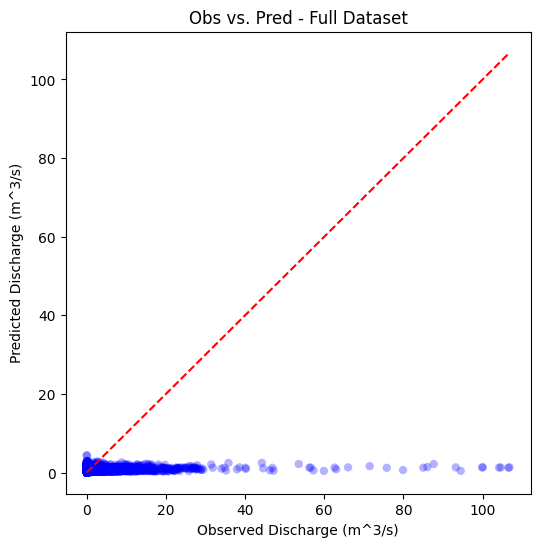

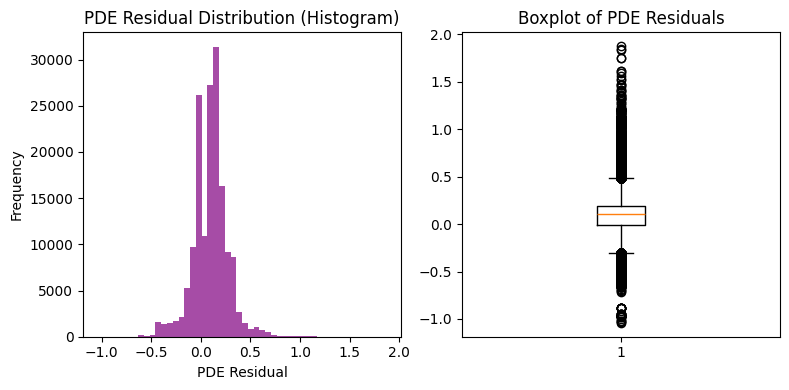

In [6]:
import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
import plotly.graph_objects as go

###############################################################################
# 1. Define: load model, PDE residual, metrics
###############################################################################

def compute_pde_residuals(model, X_batch):
    """
    For each time step in X_batch, compute residual = Q(t+1) - Q(t) - alpha*effRain
    Returns array of residuals shape [batch, seq_len-1].
    """
    model.eval()
    seq_len = X_batch.size(1)
    with torch.no_grad():
        Q_preds = []
        hidden = None
        for t_idx in range(seq_len):
            x_t = X_batch[:, t_idx, :].unsqueeze(1)
            if hidden is None:
                lstm_out, hidden = model.lstm(x_t)
            else:
                lstm_out, hidden = model.lstm(x_t, hidden)
            
            log_q_t = model.fc(lstm_out[:, -1, :])
            Q_t = torch.expm1(log_q_t)
            Q_preds.append(Q_t)
        
        alpha = model.alpha
        residuals = []
        for t_idx in range(seq_len - 1):
            Q_t  = Q_preds[t_idx]
            Q_t1 = Q_preds[t_idx+1]
            rain_t  = X_batch[:, t_idx, 0].unsqueeze(1)
            elev_t  = X_batch[:, t_idx, 1].unsqueeze(1)
            slope_t = X_batch[:, t_idx, 2].unsqueeze(1)
            
            infil_val = model.infiltration_fn(slope_t, elev_t)
            eff_rain  = torch.clamp(rain_t - infil_val, min=0.0)
            diff = Q_t1 - Q_t - alpha*eff_rain
            residuals.append(diff.cpu().numpy())  # shape [batch,1]
        
        # residuals is a list of length (seq_len-1),
        # each element is shape [batch, 1].
        # We'll stack along time dim
        residuals_np = np.stack(residuals, axis=1)  # shape [batch, seq_len-1, 1]
        residuals_np = residuals_np.squeeze(-1)     # shape [batch, seq_len-1]
        return residuals_np


def evaluate_model_performance(model, loader, device="cpu"):
    """
    1. Gather all predictions vs. obs
    2. Compute MSE, RMSE, PDE residual stats
    3. Return a dict of results plus arrays for plotting
    """
    model.eval()
    all_preds, all_truth = [], []
    pde_residuals_all = []
    
    with torch.no_grad():
        for X_batch, y_log_batch, _, _, _ in loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            # Discharge predictions
            log_q_pred = model(X_batch)  # [batch,1]
            q_pred = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true = torch.expm1(y_log_batch).cpu().numpy().flatten()
            all_preds.append(q_pred)
            all_truth.append(q_true)
            
            # PDE residuals
            residuals_np = compute_pde_residuals(model, X_batch)
            pde_residuals_all.append(residuals_np)
    
    all_preds = np.concatenate(all_preds, axis=0)
    all_truth = np.concatenate(all_truth, axis=0)
    pde_residuals_all = np.concatenate(pde_residuals_all, axis=0)  # shape [N, seq_len-1]
    
    # Basic metrics
    mse  = np.mean((all_preds - all_truth)**2)
    rmse = np.sqrt(mse)
    mae  = np.mean(np.abs(all_preds - all_truth))
    
    # PDE residual stats
    # Flatten time dimension as well
    pde_residuals_flat = pde_residuals_all.flatten()
    pde_mean   = np.mean(pde_residuals_flat)
    pde_std    = np.std(pde_residuals_flat)
    pde_absmed = np.median(np.abs(pde_residuals_flat))
    
    results = {
        "mse": mse,
        "rmse": rmse,
        "mae": mae,
        "pde_mean": pde_mean,
        "pde_std": pde_std,
        "pde_abs_median": pde_absmed
    }
    return results, all_preds, all_truth, pde_residuals_all


def plot_discharge_scatter(all_truth, all_preds, title="Obs vs Pred Discharge"):
    plt.figure(figsize=(6,6))
    plt.scatter(all_truth, all_preds, alpha=0.3, color='blue', edgecolors='none')
    plt.xlabel("Observed Discharge (m^3/s)")
    plt.ylabel("Predicted Discharge (m^3/s)")
    plt.title(title)
    max_val = max(np.max(all_truth), np.max(all_preds))
    plt.plot([0, max_val], [0, max_val], color='red', linestyle='--')
    plt.show()


def plot_pde_residual_distribution(pde_residuals_all, title="PDE Residual Distribution"):
    """
    pde_residuals_all shape [N, seq_len-1].
    We'll flatten it and plot a histogram + maybe boxplot or so.
    """
    res_flat = pde_residuals_all.flatten()
    plt.figure(figsize=(8,4))
    
    plt.subplot(1,2,1)
    plt.hist(res_flat, bins=50, color='purple', alpha=0.7)
    plt.xlabel("PDE Residual")
    plt.ylabel("Frequency")
    plt.title(title+" (Histogram)")
    
    plt.subplot(1,2,2)
    plt.boxplot(res_flat, vert=True)
    plt.title("Boxplot of PDE Residuals")
    plt.tight_layout()
    plt.show()


###############################################################################
# 2. Main Follow-up Script
###############################################################################
def main_follow_up_evaluation(
    model_path="best_lstm_infil.pth",
    data_dir="...",
    csv_files=(),
    batch_size=32,
    device="cpu"
):
    """
    1) Load data
    2) Construct dataset (val or test)
    3) Load best model
    4) Evaluate metrics & PDE residual
    5) Plot results
    """
    # 1) Load & Merge
    df_all = load_and_merge_data(data_dir, csv_files)
    print(f"Total loaded rows: {df_all.shape[0]}")
    
    # 2) Normalize
    df_norm, _ = normalize_features(df_all)
    
    # 3) Make sequences
    X_all, y_all, tau_all, lat_all, lon_all = make_sequences(df_norm, seq_len=6)
    dataset = DischargeDataset(X_all, y_all, tau_all, lat_all, lon_all)
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)
    
    # 4) Build the same model architecture & load checkpoint
    model = LSTMInfiltrationReLU(input_size=4, hidden_size=128, num_layers=2, dropout=0.2).to(device)
    if os.path.exists(model_path):
        model.load_state_dict(torch.load(model_path, map_location=device))
        print(f"Loaded model checkpoint from {model_path}")
    else:
        print(f"Warning: {model_path} not found. Evaluate with random init model.")
    
    # 5) Evaluate
    results, all_preds, all_truth, pde_residuals_all = evaluate_model_performance(model, loader, device=device)
    
    # Print stats
    print("\n=== Evaluation Metrics ===")
    print(f"MSE : {results['mse']:.4f}")
    print(f"RMSE: {results['rmse']:.4f}")
    print(f"MAE : {results['mae']:.4f}")
    print("\n=== PDE Residual Stats ===")
    print(f"Mean Residual: {results['pde_mean']:.6f}")
    print(f"Std Residual : {results['pde_std']:.6f}")
    print(f"Median |res| : {results['pde_abs_median']:.6f}")
    
    # 6) Plot results
    # a) Observed vs Pred scatter
    plot_discharge_scatter(all_truth, all_preds, title="Obs vs. Pred - Full Dataset")
    
    # b) PDE Residual distribution
    plot_pde_residual_distribution(pde_residuals_all, title="PDE Residual Distribution")


###############################################################################
# Example Usage (you can run it as a separate script or function)
###############################################################################
if __name__ == "__main__":
    # Adjust parameters as needed
    main_follow_up_evaluation(
        model_path="best_lstm_infil.pth",
        data_dir="/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/merged/nov2apr/event_base_dfs/remapping time dfs/DEEP_RESEARCH/",
        csv_files=[
            "Merged_North_Dead_Sea_2012_remapped.csv",
            "Merged_North_Dead_Sea_2013_remapped.csv",
            "Merged_North_Dead_Sea_2014_remapped.csv",
            "Merged_North_Dead_Sea_2015_remapped.csv",
            "Merged_North_Dead_Sea_2016_remapped.csv",
            "Merged_North_Dead_Sea_2018_remapped.csv",
            "Merged_North_Dead_Sea_2019_remapped.csv",
            "Merged_North_Dead_Sea_2020_remapped.csv",
        ],
        batch_size=32,
        device=device
    )


Using device: cuda
Loaded shape: (32301, 7)
X_all: (32295, 6, 4) y_all: (32295, 1)

=== Training for 150 epochs, λ_phys=0.25, BETA_WEIGHT=15, hidden_size=128 ===
Epoch [1/150] - DataLoss: 1.0837, PhysLoss: 0.0080
Epoch [2/150] - DataLoss: 1.0669, PhysLoss: 0.0097
Epoch [3/150] - DataLoss: 1.0604, PhysLoss: 0.0106
Epoch [4/150] - DataLoss: 1.0549, PhysLoss: 0.0125
Epoch [5/150] - DataLoss: 1.0494, PhysLoss: 0.0155
Epoch [6/150] - DataLoss: 1.0438, PhysLoss: 0.0193
Epoch [7/150] - DataLoss: 1.0399, PhysLoss: 0.0230
Epoch [8/150] - DataLoss: 1.0341, PhysLoss: 0.0265
Epoch [9/150] - DataLoss: 1.0311, PhysLoss: 0.0291
Epoch [10/150] - DataLoss: 1.0275, PhysLoss: 0.0312
Epoch [11/150] - DataLoss: 1.0235, PhysLoss: 0.0327
Epoch [12/150] - DataLoss: 1.0238, PhysLoss: 0.0328
Epoch [13/150] - DataLoss: 1.0207, PhysLoss: 0.0334
Epoch [14/150] - DataLoss: 1.0176, PhysLoss: 0.0339
Epoch [15/150] - DataLoss: 1.0157, PhysLoss: 0.0342
Epoch [16/150] - DataLoss: 1.0161, PhysLoss: 0.0341
Epoch [17/150] 

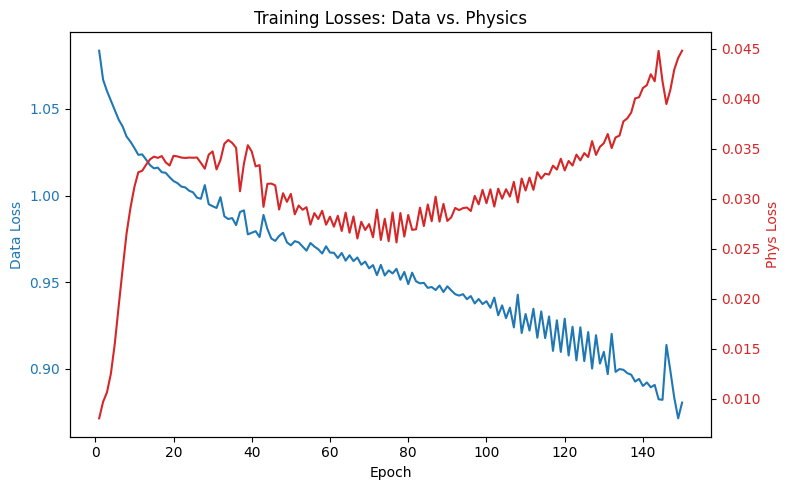

[Matplotlib] Overall Validation MSE: 3.1890


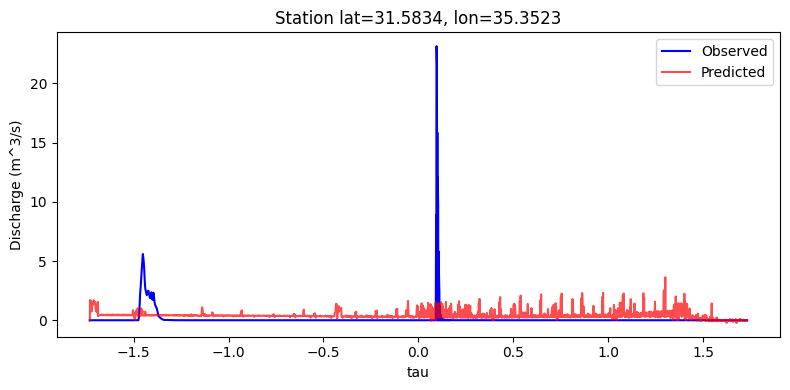

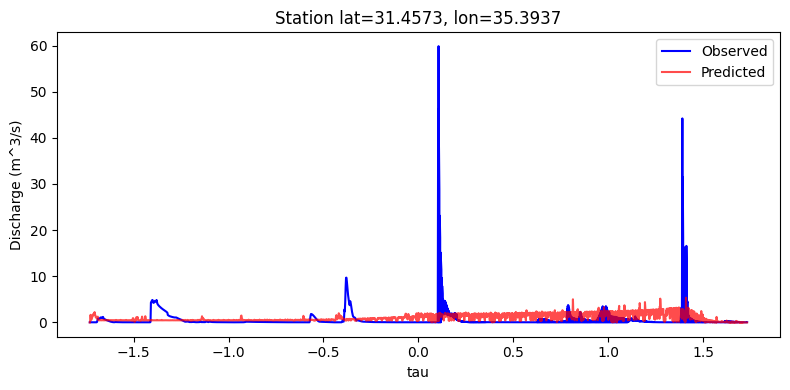

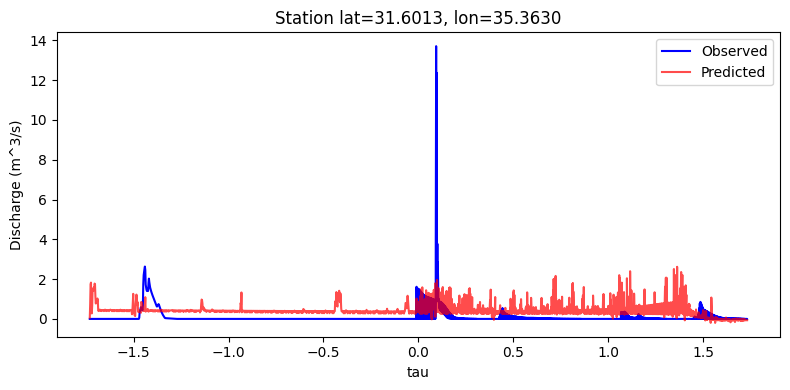

[Plotly] Overall Validation MSE: 3.1890


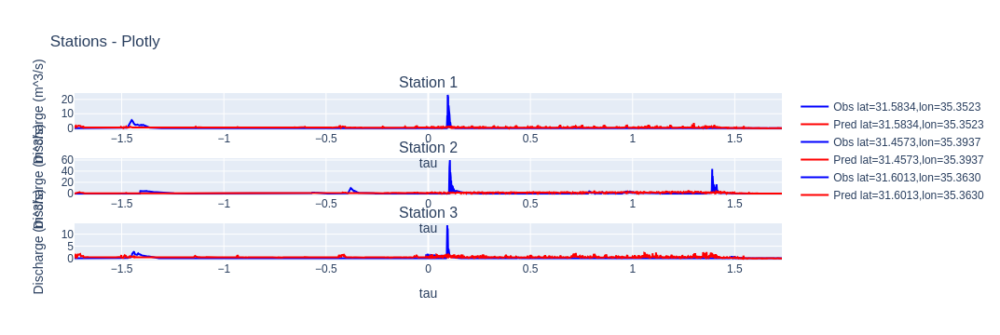

In [7]:
import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler

# For plotting
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

###############################################################################
# 1. Hyperparameters & File Paths
###############################################################################
DATA_DIR = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/merged/nov2apr/event_base_dfs/remapping time dfs/DEEP_RESEARCH/"

csv_files = [
    "Merged_North_Dead_Sea_2012_remapped.csv",
    "Merged_North_Dead_Sea_2013_remapped.csv",
    "Merged_North_Dead_Sea_2014_remapped.csv",
    "Merged_North_Dead_Sea_2015_remapped.csv",
    "Merged_North_Dead_Sea_2016_remapped.csv",
    "Merged_North_Dead_Sea_2018_remapped.csv",
    "Merged_North_Dead_Sea_2019_remapped.csv",
    "Merged_North_Dead_Sea_2020_remapped.csv",
]

# LSTM + infiltration PDE
HIDDEN_SIZE = 128
NUM_LAYERS = 2
DROPOUT = 0.2

BATCH_SIZE = 32
EPOCHS = 150             # increased from 120
LR = 1e-4

# Weighted MSE emphasis on big flows
BETA_WEIGHT = 15.0
GLOBAL_QMAX = 60.0

# Slightly increased lambda_phys
LAMBDA_DATA = 1.0     
LAMBDA_PHYS = 0.25    # was 0.2 before, now a small increase

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

###############################################################################
# 2. Data Loading & Merge (No Filtering)
###############################################################################
def load_and_merge_data(data_dir, file_list):
    merged = []
    for fname in file_list:
        fpath = os.path.join(data_dir, fname)
        if not os.path.exists(fpath):
            print(f"[WARNING] Missing: {fpath}")
            continue
        df = pd.read_csv(fpath)
        # Keep station pixels (where rg_qms not NaN)
        df = df[~df["rg_qms"].isna()].copy()
        # Sort by tau
        df.sort_values("tau", ascending=True, inplace=True)
        merged.append(df)
    if not merged:
        raise ValueError("No valid CSV files found. Check paths.")
    
    df_merged = pd.concat(merged, ignore_index=True)
    return df_merged

###############################################################################
# 3. Normalize Features
###############################################################################
def normalize_features(df):
    feat_cols = ["rainrate", "elevation", "slope_calculated", "tau"]
    scaler = StandardScaler()
    df[feat_cols] = scaler.fit_transform(df[feat_cols])
    return df, scaler

###############################################################################
# 4. Make Sequences + Keep lat/lon
###############################################################################
def make_sequences(df, seq_len=6):
    """
    We'll keep lat/lon so we know which station each row belongs to.
    That means each 'sample' also needs the lat/lon of the *final* step 
    for plotting station-based results.
    """
    feature_cols = ["rainrate", "elevation", "slope_calculated", "tau"]
    feats = df[feature_cols].values.astype(np.float32)
    
    discharge = df["rg_qms"].values.astype(np.float32)
    log_q = np.log1p(discharge)
    tau_vals = df["tau"].values.astype(np.float32)
    
    lat_vals = df["latitude"].values.astype(np.float32)
    lon_vals = df["longitude"].values.astype(np.float32)
    
    X_list, y_list = [], []
    tau_list, lat_list, lon_list = [], [], []
    N = len(df)
    for i in range(N - seq_len):
        X_list.append(feats[i : i+seq_len])
        y_list.append(log_q[i + seq_len])
        tau_list.append(tau_vals[i + seq_len])
        lat_list.append(lat_vals[i + seq_len])
        lon_list.append(lon_vals[i + seq_len])
    
    X_all = np.array(X_list, dtype=np.float32)
    y_all = np.array(y_list, dtype=np.float32).reshape(-1,1)
    tau_all= np.array(tau_list, dtype=np.float32).reshape(-1,1)
    lat_all= np.array(lat_list, dtype=np.float32).reshape(-1,1)
    lon_all= np.array(lon_list, dtype=np.float32).reshape(-1,1)
    
    return X_all, y_all, tau_all, lat_all, lon_all

class DischargeDataset(Dataset):
    def __init__(self, X, y, tau, lat, lon):
        super().__init__()
        self.X = X
        self.y = y
        self.tau = tau
        self.lat = lat
        self.lon = lon
    def __len__(self):
        return len(self.X)
    def __getitem__(self, idx):
        return self.X[idx], self.y[idx], self.tau[idx], self.lat[idx], self.lon[idx]

###############################################################################
# 5. LSTM + Infiltration PDE
###############################################################################
class LSTMInfiltrationReLU(nn.Module):
    def __init__(self, input_size=4, hidden_size=128, num_layers=2, dropout=0.2):
        super().__init__()
        self.lstm = nn.LSTM(input_size, hidden_size,
                            num_layers=num_layers,
                            batch_first=True,
                            dropout=dropout)
        self.fc = nn.Linear(hidden_size, 1)  # outputs log(Q)
        
        self.alpha = nn.Parameter(torch.tensor(0.01, dtype=torch.float32))
        self.i0     = nn.Parameter(torch.tensor(0.1, dtype=torch.float32))
        self.iSlope = nn.Parameter(torch.tensor(0.0, dtype=torch.float32))
        self.iElev  = nn.Parameter(torch.tensor(0.0, dtype=torch.float32))
        
        self.relu = nn.ReLU()
    
    def forward(self, x):
        lstm_out, (h_n, c_n) = self.lstm(x)
        out = lstm_out[:, -1, :]
        log_q_pred = self.fc(out)
        return log_q_pred
    
    def infiltration_fn(self, slope, elev):
        raw_infil = self.i0 + self.iSlope*slope + self.iElev*elev
        return self.relu(raw_infil)

###############################################################################
# 6. Weighted MSE
###############################################################################
def weighted_mse_loss(log_q_pred, log_q_true, beta=15.0, global_qmax=60.0):
    Q_true = torch.expm1(log_q_true)
    w = 1.0 + beta*(Q_true / global_qmax)
    diff = (log_q_pred - log_q_true)**2
    return torch.mean(w * diff)

###############################################################################
# 7. Training Loop
###############################################################################
def train_model(
    model, train_loader, optimizer, 
    num_epochs=150, lambda_data=1.0, lambda_phys=0.25,
    beta_weight=15.0, global_qmax=60.0
):
    data_losses = []
    phys_losses = []
    
    for epoch in range(num_epochs):
        model.train()
        epoch_data_loss = 0.0
        epoch_phys_loss = 0.0
        n_batches = 0
        
        for X_batch, y_log_batch, _, _, _ in train_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            optimizer.zero_grad()
            
            # (A) Data Loss
            log_q_pred = model(X_batch)
            data_loss_val = weighted_mse_loss(
                log_q_pred, y_log_batch,
                beta=beta_weight, global_qmax=global_qmax
            ) * lambda_data
            
            # (B) PDE infiltration
            Q_preds = []
            hidden = None
            seq_len = X_batch.size(1)
            for t_idx in range(seq_len):
                x_t = X_batch[:, t_idx, :].unsqueeze(1)
                if hidden is None:
                    lstm_out, hidden = model.lstm(x_t)
                else:
                    lstm_out, hidden = model.lstm(x_t, hidden)
                
                log_q_t = model.fc(lstm_out[:, -1, :])
                Q_t = torch.expm1(log_q_t)
                Q_preds.append(Q_t)
            
            penalty = 0.0
            alpha = model.alpha
            for t_idx in range(seq_len-1):
                Q_t  = Q_preds[t_idx]
                Q_t1 = Q_preds[t_idx+1]
                
                # parse features
                rain_t  = X_batch[:, t_idx, 0].unsqueeze(1)
                elev_t  = X_batch[:, t_idx, 1].unsqueeze(1)
                slope_t = X_batch[:, t_idx, 2].unsqueeze(1)
                
                infil_val = model.infiltration_fn(slope_t, elev_t)
                eff_rain  = torch.clamp(rain_t - infil_val, min=0.0)
                
                diff = Q_t1 - Q_t - alpha*eff_rain
                penalty += torch.mean(diff**2)
            
            if seq_len > 1:
                penalty = penalty / (seq_len-1)
            
            phys_loss = penalty * lambda_phys
            
            total_loss = data_loss_val + phys_loss
            total_loss.backward()
            optimizer.step()
            
            epoch_data_loss += data_loss_val.item() / max(lambda_data,1e-9)
            epoch_phys_loss += penalty.item()
            n_batches += 1
        
        if n_batches > 0:
            data_losses.append(epoch_data_loss / n_batches)
            phys_losses.append(epoch_phys_loss / n_batches)
        
        print(f"Epoch [{epoch+1}/{num_epochs}] - "
              f"DataLoss: {data_losses[-1]:.4f}, PhysLoss: {phys_losses[-1]:.4f}")
    
    return data_losses, phys_losses

###############################################################################
# 8. Plot Losses (Matplotlib), Evaluate Per Station, Plot Interactive (Plotly)
###############################################################################
def plot_training_losses(data_losses, phys_losses):
    epochs = range(1, len(data_losses)+1)
    
    fig, ax1 = plt.subplots(figsize=(8,5))
    
    color_data = 'tab:blue'
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Data Loss", color=color_data)
    ax1.plot(epochs, data_losses, color=color_data)
    ax1.tick_params(axis='y', labelcolor=color_data)
    
    ax2 = ax1.twinx()
    color_phys = 'tab:red'
    ax2.set_ylabel("Phys Loss", color=color_phys)
    ax2.plot(epochs, phys_losses, color=color_phys)
    ax2.tick_params(axis='y', labelcolor=color_phys)
    
    plt.title("Training Losses: Data vs. Physics")
    plt.tight_layout()
    plt.show()

def evaluate_per_station_matplotlib(model, val_loader):
    """
    Evaluate predictions, then separate them by lat/lon station
    and plot each station with Matplotlib.
    """
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in val_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true = torch.expm1(y_log_batch).cpu().numpy().flatten()
            tau_np = tau_batch.cpu().numpy().flatten()
            lat_np = lat_batch.numpy().flatten()
            lon_np = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    # Concatenate
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Matplotlib] Overall Validation MSE: {val_mse:.4f}")
    
    # Identify unique stations by lat/lon
    station_coords = {}
    for (lat, lon) in zip(all_lat, all_lon):
        station_coords[(lat, lon)] = True
    unique_stations = list(station_coords.keys())
    
    # For each station, filter data + plot
    for st in unique_stations:
        lat_st, lon_st = st
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        
        tau_st = all_tau[mask]
        obs_st = all_truth[mask]
        pred_st= all_preds[mask]
        
        # Sort by tau if needed
        idx_sort = np.argsort(tau_st)
        tau_st = tau_st[idx_sort]
        obs_st = obs_st[idx_sort]
        pred_st= pred_st[idx_sort]
        
        # Plot
        plt.figure(figsize=(8,4))
        plt.plot(tau_st, obs_st, label='Observed', color='blue')
        plt.plot(tau_st, pred_st, label='Predicted', color='red', alpha=0.7)
        plt.xlabel("tau")
        plt.ylabel("Discharge (m^3/s)")
        plt.title(f"Station lat={lat_st:.4f}, lon={lon_st:.4f}")
        plt.legend()
        plt.tight_layout()
        plt.show()

def evaluate_per_station_plotly(model, val_loader, title="Stations - Plotly"):
    """
    Similar approach, but build a multi-subplot Plotly figure 
    with one subplot per station.
    """
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in val_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true = torch.expm1(y_log_batch).cpu().numpy().flatten()
            tau_np = tau_batch.cpu().numpy().flatten()
            lat_np = lat_batch.numpy().flatten()
            lon_np = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Plotly] Overall Validation MSE: {val_mse:.4f}")
    
    # Identify unique stations
    stations_map = {}
    for (lat, lon) in zip(all_lat, all_lon):
        stations_map[(lat, lon)] = True
    unique_stations = list(stations_map.keys())
    n_stations = len(unique_stations)
    
    # Make a subplot with #rows = #stations (1 column for simplicity)
    fig = make_subplots(rows=n_stations, cols=1, 
                        subplot_titles=[f"Station {i+1}" for i in range(n_stations)])
    
    row_idx = 1
    for st in unique_stations:
        lat_st, lon_st = st
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        
        tau_st = all_tau[mask]
        obs_st = all_truth[mask]
        pred_st= all_preds[mask]
        
        # Sort by tau for nice plotting
        idx_sort = np.argsort(tau_st)
        tau_st = tau_st[idx_sort]
        obs_st = obs_st[idx_sort]
        pred_st= pred_st[idx_sort]
        
        fig.add_trace(
            go.Scatter(x=tau_st, y=obs_st, mode='lines', name=f"Obs lat={lat_st:.4f},lon={lon_st:.4f}",
                       line=dict(color='blue')),
            row=row_idx, col=1
        )
        fig.add_trace(
            go.Scatter(x=tau_st, y=pred_st, mode='lines', name=f"Pred lat={lat_st:.4f},lon={lon_st:.4f}",
                       line=dict(color='red')),
            row=row_idx, col=1
        )
        
        row_idx += 1
    
    fig.update_layout(
        title=title,
        hovermode='x',
        showlegend=True,
        height=300*n_stations,  # to give each subplot decent vertical space
    )
    fig.update_xaxes(title_text='tau')
    fig.update_yaxes(title_text='Discharge (m^3/s)')
    
    fig.show()


###############################################################################
# 9. Main
###############################################################################
def main():
    # 1) Load & Merge
    df_all = load_and_merge_data(DATA_DIR, csv_files)
    print("Loaded shape:", df_all.shape)
    
    # 2) Normalize
    df_norm, scaler = normalize_features(df_all)
    
    # 3) Sequences
    X_all, y_all, tau_all, lat_all, lon_all = make_sequences(df_norm, seq_len=6)
    print("X_all:", X_all.shape, "y_all:", y_all.shape)
    
    # 4) Train/Val Split
    N = len(X_all)
    split_idx = int(0.8 * N)
    
    X_train, y_train   = X_all[:split_idx], y_all[:split_idx]
    tau_train, lat_train, lon_train = tau_all[:split_idx], lat_all[:split_idx], lon_all[:split_idx]
    
    X_val,   y_val     = X_all[split_idx:], y_all[split_idx:]
    tau_val, lat_val, lon_val = tau_all[split_idx:], lat_all[split_idx:], lon_all[split_idx:]
    
    train_ds = DischargeDataset(X_train, y_train, tau_train, lat_train, lon_train)
    val_ds   = DischargeDataset(X_val,   y_val,   tau_val,   lat_val,   lon_val)
    
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=False)
    val_loader   = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False)
    
    # 5) Model
    model = LSTMInfiltrationReLU(
        input_size=4,
        hidden_size=HIDDEN_SIZE,
        num_layers=NUM_LAYERS,
        dropout=DROPOUT
    ).to(device)
    
    optimizer = torch.optim.Adam(model.parameters(), lr=LR)
    
    # 6) Train
    print("\n=== Training for 150 epochs, λ_phys=0.25, BETA_WEIGHT=15, hidden_size=128 ===")
    data_losses, phys_losses = train_model(
        model=model,
        train_loader=train_loader,
        optimizer=optimizer,
        num_epochs=EPOCHS,
        lambda_data=LAMBDA_DATA,
        lambda_phys=LAMBDA_PHYS,
        beta_weight=BETA_WEIGHT,
        global_qmax=GLOBAL_QMAX
    )
    
    # 7) Plot Training Losses (Matplotlib)
    plot_training_losses(data_losses, phys_losses)
    
    # 8) Evaluate per station in Matplotlib
    evaluate_per_station_matplotlib(model, val_loader)
    
    # 9) Evaluate per station in Plotly (interactive)
    evaluate_per_station_plotly(model, val_loader, title="Stations - Plotly")

if __name__ == "__main__":
    main()


Using device: cuda
Loaded shape: (32301, 7)
X_all: (32295, 6, 4) y_all: (32295, 1)

=== Training for 150 epochs, λ_phys=0.25, BETA_WEIGHT=15, hidden_size=128 ===
Epoch [1/150] - DataLoss: 1.0892, PhysLoss: 0.0115
Epoch [2/150] - DataLoss: 1.0702, PhysLoss: 0.0137
Epoch [3/150] - DataLoss: 1.0639, PhysLoss: 0.0151
Epoch [4/150] - DataLoss: 1.0571, PhysLoss: 0.0183
Epoch [5/150] - DataLoss: 1.0505, PhysLoss: 0.0243
Epoch [6/150] - DataLoss: 1.0435, PhysLoss: 0.0334
Epoch [7/150] - DataLoss: 1.0392, PhysLoss: 0.0445
Epoch [8/150] - DataLoss: 1.0327, PhysLoss: 0.0574
Epoch [9/150] - DataLoss: 1.0284, PhysLoss: 0.0710
Epoch [10/150] - DataLoss: 1.0255, PhysLoss: 0.0840
Epoch [11/150] - DataLoss: 1.0216, PhysLoss: 0.0974
Epoch [12/150] - DataLoss: 1.0189, PhysLoss: 0.1108
Epoch [13/150] - DataLoss: 1.0157, PhysLoss: 0.1249
Epoch [14/150] - DataLoss: 1.0119, PhysLoss: 0.1426
Epoch [15/150] - DataLoss: 1.0099, PhysLoss: 0.1593
Epoch [16/150] - DataLoss: 1.0065, PhysLoss: 0.1792
Epoch [17/150] 

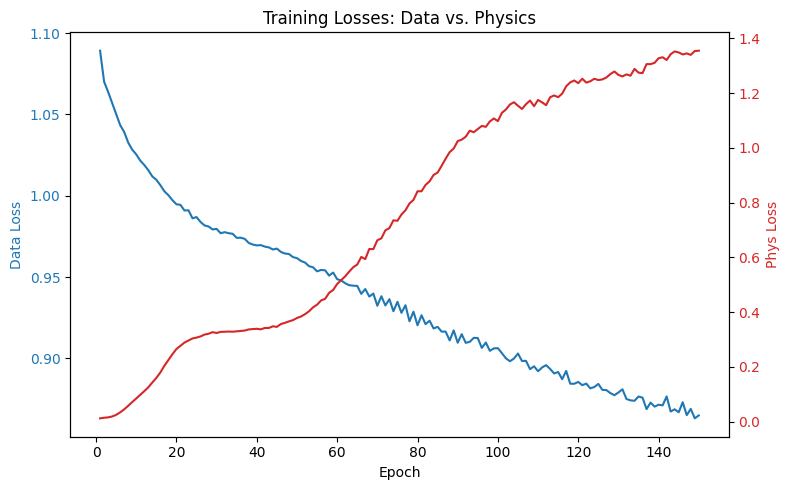

[Matplotlib] Overall Validation MSE: 3.4128


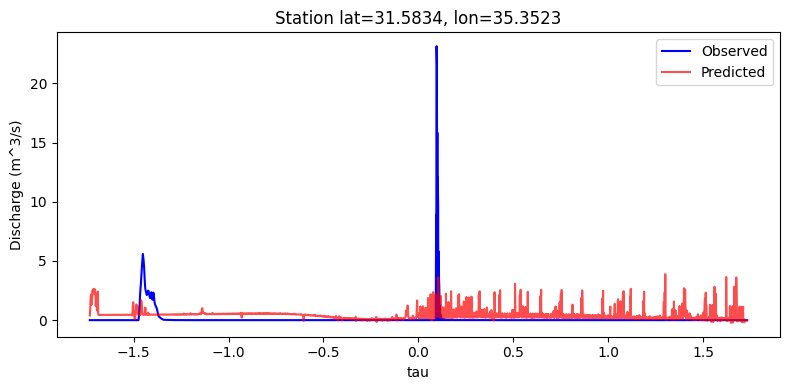

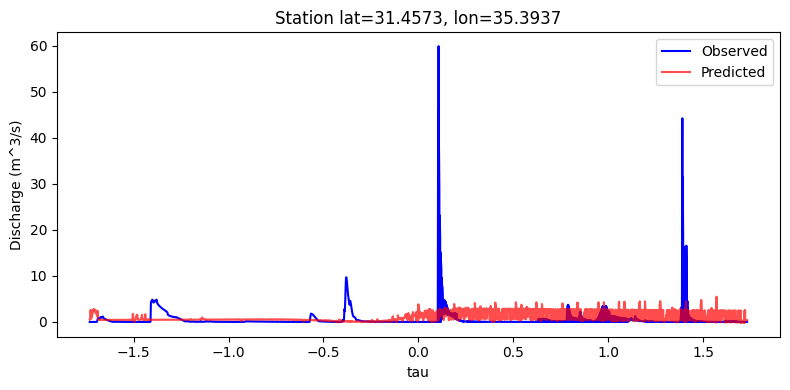

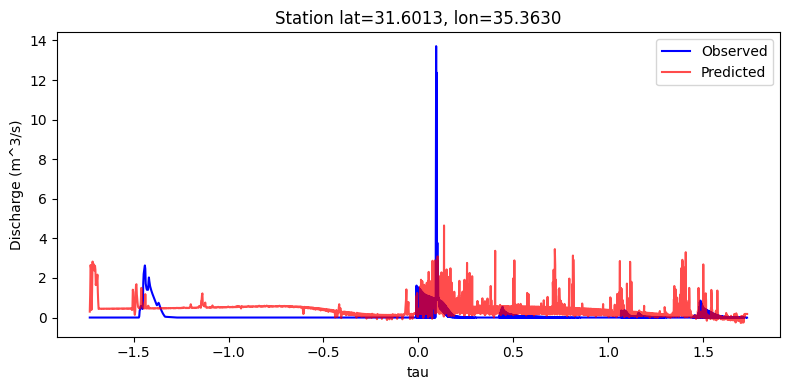

[Plotly] Overall Validation MSE: 3.4128


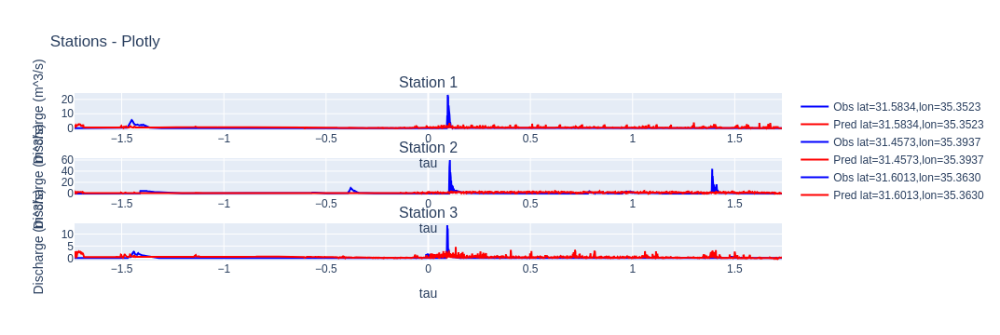

In [8]:
import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler

# For plotting
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

###############################################################################
# 1. Hyperparameters & File Paths
###############################################################################
DATA_DIR = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/merged/nov2apr/event_base_dfs/remapping time dfs/DEEP_RESEARCH/"

csv_files = [
    "Merged_North_Dead_Sea_2012_remapped.csv",
    "Merged_North_Dead_Sea_2013_remapped.csv",
    "Merged_North_Dead_Sea_2014_remapped.csv",
    "Merged_North_Dead_Sea_2015_remapped.csv",
    "Merged_North_Dead_Sea_2016_remapped.csv",
    "Merged_North_Dead_Sea_2018_remapped.csv",
    "Merged_North_Dead_Sea_2019_remapped.csv",
    "Merged_North_Dead_Sea_2020_remapped.csv",
]

# LSTM + infiltration PDE
HIDDEN_SIZE = 128
NUM_LAYERS = 2
DROPOUT = 0.2

BATCH_SIZE = 32
EPOCHS = 150             # increased from 120
LR = 1e-4

# Weighted MSE emphasis on big flows
BETA_WEIGHT = 15.0
GLOBAL_QMAX = 60.0

# Slightly increased lambda_phys
LAMBDA_DATA = 1.0     
LAMBDA_PHYS = 0.0    # was 0.2 before, now a small increase

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

###############################################################################
# 2. Data Loading & Merge (No Filtering)
###############################################################################
def load_and_merge_data(data_dir, file_list):
    merged = []
    for fname in file_list:
        fpath = os.path.join(data_dir, fname)
        if not os.path.exists(fpath):
            print(f"[WARNING] Missing: {fpath}")
            continue
        df = pd.read_csv(fpath)
        # Keep station pixels (where rg_qms not NaN)
        df = df[~df["rg_qms"].isna()].copy()
        # Sort by tau
        df.sort_values("tau", ascending=True, inplace=True)
        merged.append(df)
    if not merged:
        raise ValueError("No valid CSV files found. Check paths.")
    
    df_merged = pd.concat(merged, ignore_index=True)
    return df_merged

###############################################################################
# 3. Normalize Features
###############################################################################
def normalize_features(df):
    feat_cols = ["rainrate", "elevation", "slope_calculated", "tau"]
    scaler = StandardScaler()
    df[feat_cols] = scaler.fit_transform(df[feat_cols])
    return df, scaler

###############################################################################
# 4. Make Sequences + Keep lat/lon
###############################################################################
def make_sequences(df, seq_len=6):
    """
    We'll keep lat/lon so we know which station each row belongs to.
    That means each 'sample' also needs the lat/lon of the *final* step 
    for plotting station-based results.
    """
    feature_cols = ["rainrate", "elevation", "slope_calculated", "tau"]
    feats = df[feature_cols].values.astype(np.float32)
    
    discharge = df["rg_qms"].values.astype(np.float32)
    log_q = np.log1p(discharge)
    tau_vals = df["tau"].values.astype(np.float32)
    
    lat_vals = df["latitude"].values.astype(np.float32)
    lon_vals = df["longitude"].values.astype(np.float32)
    
    X_list, y_list = [], []
    tau_list, lat_list, lon_list = [], [], []
    N = len(df)
    for i in range(N - seq_len):
        X_list.append(feats[i : i+seq_len])
        y_list.append(log_q[i + seq_len])
        tau_list.append(tau_vals[i + seq_len])
        lat_list.append(lat_vals[i + seq_len])
        lon_list.append(lon_vals[i + seq_len])
    
    X_all = np.array(X_list, dtype=np.float32)
    y_all = np.array(y_list, dtype=np.float32).reshape(-1,1)
    tau_all= np.array(tau_list, dtype=np.float32).reshape(-1,1)
    lat_all= np.array(lat_list, dtype=np.float32).reshape(-1,1)
    lon_all= np.array(lon_list, dtype=np.float32).reshape(-1,1)
    
    return X_all, y_all, tau_all, lat_all, lon_all

class DischargeDataset(Dataset):
    def __init__(self, X, y, tau, lat, lon):
        super().__init__()
        self.X = X
        self.y = y
        self.tau = tau
        self.lat = lat
        self.lon = lon
    def __len__(self):
        return len(self.X)
    def __getitem__(self, idx):
        return self.X[idx], self.y[idx], self.tau[idx], self.lat[idx], self.lon[idx]

###############################################################################
# 5. LSTM + Infiltration PDE
###############################################################################
class LSTMInfiltrationReLU(nn.Module):
    def __init__(self, input_size=4, hidden_size=128, num_layers=2, dropout=0.2):
        super().__init__()
        self.lstm = nn.LSTM(input_size, hidden_size,
                            num_layers=num_layers,
                            batch_first=True,
                            dropout=dropout)
        self.fc = nn.Linear(hidden_size, 1)  # outputs log(Q)
        
        self.alpha = nn.Parameter(torch.tensor(0.01, dtype=torch.float32))
        self.i0     = nn.Parameter(torch.tensor(0.1, dtype=torch.float32))
        self.iSlope = nn.Parameter(torch.tensor(0.0, dtype=torch.float32))
        self.iElev  = nn.Parameter(torch.tensor(0.0, dtype=torch.float32))
        
        self.relu = nn.ReLU()
    
    def forward(self, x):
        lstm_out, (h_n, c_n) = self.lstm(x)
        out = lstm_out[:, -1, :]
        log_q_pred = self.fc(out)
        return log_q_pred
    
    def infiltration_fn(self, slope, elev):
        raw_infil = self.i0 + self.iSlope*slope + self.iElev*elev
        return self.relu(raw_infil)

###############################################################################
# 6. Weighted MSE
###############################################################################
def weighted_mse_loss(log_q_pred, log_q_true, beta=15.0, global_qmax=60.0):
    Q_true = torch.expm1(log_q_true)
    w = 1.0 + beta*(Q_true / global_qmax)
    diff = (log_q_pred - log_q_true)**2
    return torch.mean(w * diff)

###############################################################################
# 7. Training Loop
###############################################################################
def train_model(
    model, train_loader, optimizer, 
    num_epochs=150, lambda_data=1.0, lambda_phys=0.25,
    beta_weight=15.0, global_qmax=60.0
):
    data_losses = []
    phys_losses = []
    
    for epoch in range(num_epochs):
        model.train()
        epoch_data_loss = 0.0
        epoch_phys_loss = 0.0
        n_batches = 0
        
        for X_batch, y_log_batch, _, _, _ in train_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            optimizer.zero_grad()
            
            # (A) Data Loss
            log_q_pred = model(X_batch)
            data_loss_val = weighted_mse_loss(
                log_q_pred, y_log_batch,
                beta=beta_weight, global_qmax=global_qmax
            ) * lambda_data
            
            # (B) PDE infiltration
            Q_preds = []
            hidden = None
            seq_len = X_batch.size(1)
            for t_idx in range(seq_len):
                x_t = X_batch[:, t_idx, :].unsqueeze(1)
                if hidden is None:
                    lstm_out, hidden = model.lstm(x_t)
                else:
                    lstm_out, hidden = model.lstm(x_t, hidden)
                
                log_q_t = model.fc(lstm_out[:, -1, :])
                Q_t = torch.expm1(log_q_t)
                Q_preds.append(Q_t)
            
            penalty = 0.0
            alpha = model.alpha
            for t_idx in range(seq_len-1):
                Q_t  = Q_preds[t_idx]
                Q_t1 = Q_preds[t_idx+1]
                
                # parse features
                rain_t  = X_batch[:, t_idx, 0].unsqueeze(1)
                elev_t  = X_batch[:, t_idx, 1].unsqueeze(1)
                slope_t = X_batch[:, t_idx, 2].unsqueeze(1)
                
                infil_val = model.infiltration_fn(slope_t, elev_t)
                eff_rain  = torch.clamp(rain_t - infil_val, min=0.0)
                
                diff = Q_t1 - Q_t - alpha*eff_rain
                penalty += torch.mean(diff**2)
            
            if seq_len > 1:
                penalty = penalty / (seq_len-1)
            
            phys_loss = penalty * lambda_phys
            
            total_loss = data_loss_val + phys_loss
            total_loss.backward()
            optimizer.step()
            
            epoch_data_loss += data_loss_val.item() / max(lambda_data,1e-9)
            epoch_phys_loss += penalty.item()
            n_batches += 1
        
        if n_batches > 0:
            data_losses.append(epoch_data_loss / n_batches)
            phys_losses.append(epoch_phys_loss / n_batches)
        
        print(f"Epoch [{epoch+1}/{num_epochs}] - "
              f"DataLoss: {data_losses[-1]:.4f}, PhysLoss: {phys_losses[-1]:.4f}")
    
    return data_losses, phys_losses

###############################################################################
# 8. Plot Losses (Matplotlib), Evaluate Per Station, Plot Interactive (Plotly)
###############################################################################
def plot_training_losses(data_losses, phys_losses):
    epochs = range(1, len(data_losses)+1)
    
    fig, ax1 = plt.subplots(figsize=(8,5))
    
    color_data = 'tab:blue'
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Data Loss", color=color_data)
    ax1.plot(epochs, data_losses, color=color_data)
    ax1.tick_params(axis='y', labelcolor=color_data)
    
    ax2 = ax1.twinx()
    color_phys = 'tab:red'
    ax2.set_ylabel("Phys Loss", color=color_phys)
    ax2.plot(epochs, phys_losses, color=color_phys)
    ax2.tick_params(axis='y', labelcolor=color_phys)
    
    plt.title("Training Losses: Data vs. Physics")
    plt.tight_layout()
    plt.show()

def evaluate_per_station_matplotlib(model, val_loader):
    """
    Evaluate predictions, then separate them by lat/lon station
    and plot each station with Matplotlib.
    """
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in val_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true = torch.expm1(y_log_batch).cpu().numpy().flatten()
            tau_np = tau_batch.cpu().numpy().flatten()
            lat_np = lat_batch.numpy().flatten()
            lon_np = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    # Concatenate
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Matplotlib] Overall Validation MSE: {val_mse:.4f}")
    
    # Identify unique stations by lat/lon
    station_coords = {}
    for (lat, lon) in zip(all_lat, all_lon):
        station_coords[(lat, lon)] = True
    unique_stations = list(station_coords.keys())
    
    # For each station, filter data + plot
    for st in unique_stations:
        lat_st, lon_st = st
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        
        tau_st = all_tau[mask]
        obs_st = all_truth[mask]
        pred_st= all_preds[mask]
        
        # Sort by tau if needed
        idx_sort = np.argsort(tau_st)
        tau_st = tau_st[idx_sort]
        obs_st = obs_st[idx_sort]
        pred_st= pred_st[idx_sort]
        
        # Plot
        plt.figure(figsize=(8,4))
        plt.plot(tau_st, obs_st, label='Observed', color='blue')
        plt.plot(tau_st, pred_st, label='Predicted', color='red', alpha=0.7)
        plt.xlabel("tau")
        plt.ylabel("Discharge (m^3/s)")
        plt.title(f"Station lat={lat_st:.4f}, lon={lon_st:.4f}")
        plt.legend()
        plt.tight_layout()
        plt.show()

def evaluate_per_station_plotly(model, val_loader, title="Stations - Plotly"):
    """
    Similar approach, but build a multi-subplot Plotly figure 
    with one subplot per station.
    """
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in val_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true = torch.expm1(y_log_batch).cpu().numpy().flatten()
            tau_np = tau_batch.cpu().numpy().flatten()
            lat_np = lat_batch.numpy().flatten()
            lon_np = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Plotly] Overall Validation MSE: {val_mse:.4f}")
    
    # Identify unique stations
    stations_map = {}
    for (lat, lon) in zip(all_lat, all_lon):
        stations_map[(lat, lon)] = True
    unique_stations = list(stations_map.keys())
    n_stations = len(unique_stations)
    
    # Make a subplot with #rows = #stations (1 column for simplicity)
    fig = make_subplots(rows=n_stations, cols=1, 
                        subplot_titles=[f"Station {i+1}" for i in range(n_stations)])
    
    row_idx = 1
    for st in unique_stations:
        lat_st, lon_st = st
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        
        tau_st = all_tau[mask]
        obs_st = all_truth[mask]
        pred_st= all_preds[mask]
        
        # Sort by tau for nice plotting
        idx_sort = np.argsort(tau_st)
        tau_st = tau_st[idx_sort]
        obs_st = obs_st[idx_sort]
        pred_st= pred_st[idx_sort]
        
        fig.add_trace(
            go.Scatter(x=tau_st, y=obs_st, mode='lines', name=f"Obs lat={lat_st:.4f},lon={lon_st:.4f}",
                       line=dict(color='blue')),
            row=row_idx, col=1
        )
        fig.add_trace(
            go.Scatter(x=tau_st, y=pred_st, mode='lines', name=f"Pred lat={lat_st:.4f},lon={lon_st:.4f}",
                       line=dict(color='red')),
            row=row_idx, col=1
        )
        
        row_idx += 1
    
    fig.update_layout(
        title=title,
        hovermode='x',
        showlegend=True,
        height=300*n_stations,  # to give each subplot decent vertical space
    )
    fig.update_xaxes(title_text='tau')
    fig.update_yaxes(title_text='Discharge (m^3/s)')
    
    fig.show()


###############################################################################
# 9. Main
###############################################################################
def main():
    # 1) Load & Merge
    df_all = load_and_merge_data(DATA_DIR, csv_files)
    print("Loaded shape:", df_all.shape)
    
    # 2) Normalize
    df_norm, scaler = normalize_features(df_all)
    
    # 3) Sequences
    X_all, y_all, tau_all, lat_all, lon_all = make_sequences(df_norm, seq_len=6)
    print("X_all:", X_all.shape, "y_all:", y_all.shape)
    
    # 4) Train/Val Split
    N = len(X_all)
    split_idx = int(0.8 * N)
    
    X_train, y_train   = X_all[:split_idx], y_all[:split_idx]
    tau_train, lat_train, lon_train = tau_all[:split_idx], lat_all[:split_idx], lon_all[:split_idx]
    
    X_val,   y_val     = X_all[split_idx:], y_all[split_idx:]
    tau_val, lat_val, lon_val = tau_all[split_idx:], lat_all[split_idx:], lon_all[split_idx:]
    
    train_ds = DischargeDataset(X_train, y_train, tau_train, lat_train, lon_train)
    val_ds   = DischargeDataset(X_val,   y_val,   tau_val,   lat_val,   lon_val)
    
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=False)
    val_loader   = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False)
    
    # 5) Model
    model = LSTMInfiltrationReLU(
        input_size=4,
        hidden_size=HIDDEN_SIZE,
        num_layers=NUM_LAYERS,
        dropout=DROPOUT
    ).to(device)
    
    optimizer = torch.optim.Adam(model.parameters(), lr=LR)
    
    # 6) Train
    print("\n=== Training for 150 epochs, λ_phys=0.25, BETA_WEIGHT=15, hidden_size=128 ===")
    data_losses, phys_losses = train_model(
        model=model,
        train_loader=train_loader,
        optimizer=optimizer,
        num_epochs=EPOCHS,
        lambda_data=LAMBDA_DATA,
        lambda_phys=LAMBDA_PHYS,
        beta_weight=BETA_WEIGHT,
        global_qmax=GLOBAL_QMAX
    )
    
    # 7) Plot Training Losses (Matplotlib)
    plot_training_losses(data_losses, phys_losses)
    
    # 8) Evaluate per station in Matplotlib
    evaluate_per_station_matplotlib(model, val_loader)
    
    # 9) Evaluate per station in Plotly (interactive)
    evaluate_per_station_plotly(model, val_loader, title="Stations - Plotly")

if __name__ == "__main__":
    main()
